In [19]:
# Standard libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

# For Machine Learning (PyTorch)
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

root = "tensile_fatigue_data_v14.xlsx"
main_df = pd.read_excel(root)

## Training and Test set

In [6]:
X = pd.read_excel(root,usecols=[0,1,2,3,4])
y = pd.read_excel(root,usecols=[5,6])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

result = pd.concat([X_train, y_train], axis=1)
result

,E,RA,BHN,σy,σu,σf',b
20,180,20,496,1861,1905,269.0,-102.0
37,205,48,380,1379,1415,182.5,-80.0
7,205,55,180,475,783,162.2,-135.0
6,219,67,195,410,649,100.9,-97.0
45,200,38,409,1372,1470,200.0,-91.0
57,201,66,241,565,825,104.0,-92.0
47,205,11,518,1924,2015,258.5,-90.0
10,203,34,220,460,829,109.4,-75.0
44,195,43,243,634,825,120.0,-95.0
50,200,32,410,1379,1565,185.5,-57.0


In [7]:
result2 = pd.concat([X_test, y_test], axis=1)
result2

,E,RA,BHN,σy,σu,σf',b
31,200,51,410,1365,1450,186.0,-73.0
3,220,47,229,493,789,132.6,-103.0
38,200,42,450,1586,1760,200.0,-80.0
27,200,64,125,400,415,54.0,-73.0
21,205,33,660,2034,2585,317.0,-77.0
17,185,67,405,1482,1515,165.5,-65.0
46,195,42,430,1531,1670,193.0,-71.0
2,215,58,252,610,797,116.2,-86.0
23,205,67,290,883,930,124.0,-70.0
26,205,66,125,448,470,51.5,-59.0


## Main Function

In [65]:
def GBR_HYP(X_train, X_test, y_train, y_test):
    n_estimate = [30000, 50000]
    l_rate = [0.001, 0.01, 0.1, 0.2]
    m_depth = [2, 3, 4]
    
    max_test_score = 0
    max_n = 0
    max_l = 0
    max_d = 0
    
    for x in range(len(n_estimate)):
        for y in range(len(l_rate)):
            for z in range(len(m_depth)):
                        gbr = GradientBoostingRegressor(n_estimators = n_estimate[x],
                                                        learning_rate = l_rate[y], max_depth = m_depth[z], 
                                                        random_state = 42, tol = 1e-5)
                        gbr.fit(X_train, y_train)
            
                        y_train_pred = gbr.predict(X_train)
                        y_test_pred = gbr.predict(X_test)
            
                        r2_train = r2_score(y_train, y_train_pred)
                        r2_test  = r2_score(y_test, y_test_pred)
            
                        print("GBR Parameters: n-estimators = ", n_estimate[x], " lr = ", l_rate[y], " max depth = ", m_depth[z])
                        print("Train R²: ", "%.5f" % round(r2_train, 5))
                        print("Test R² : ", "%.5f" % round(r2_test, 5))
            
                        if r2_test > max_test_score:
                            max_test_score = r2_test
                            max_n = n_estimate[x]
                            max_l = l_rate[y]
                            max_d = m_depth[z]
    
    print("Best GBR Parameters: n-estimators = ", max_n, " lr = ", max_l, " max depth = ", max_d)
    return max_n, max_l, max_d

In [66]:
def GBR_DNN(variable):
    X = pd.read_excel(root,usecols=[0,1,2,3,4])
    y = pd.read_excel(root,usecols=[variable])
    
    # Normalize inputs
    scaler_X = StandardScaler()
    X_scaled = scaler_X.fit_transform(X)
    
    scaler_y = StandardScaler()
    y_scaled = scaler_y.fit_transform(y)
    
    # Use scaled data
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=10)
    
    # Convert y to float and flatten
    y_train = np.array(y_train, dtype=np.float32).ravel()
    y_test = np.array(y_test, dtype=np.float32).ravel()

    a1, a2, a3 = GBR_HYP(X_train, X_test, y_train, y_test)
    
    # Train the Gradient Boosting Regressor #70000, 0.001, 4
    gbr = GradientBoostingRegressor(n_estimators= a1, learning_rate= a2, max_depth= a3, random_state=42, tol=1e-5)
    gbr.fit(X_train, y_train)
    
    # Get GBR predictions
    gbr_train_pred = gbr.predict(X_train)
    gbr_test_pred = gbr.predict(X_test)
    
    # Augment inputs
    X_train_nn = np.hstack([X_train, gbr_train_pred.reshape(-1, 1)])
    X_test_nn = np.hstack([X_test, gbr_test_pred.reshape(-1, 1)])
    
    # Convert to tensors
    X_train = torch.tensor(X_train_nn, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
    X_test = torch.tensor(X_test_nn, dtype=torch.float32)
    y_test = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)
    
    # Neural network class
    class DeepNN(nn.Module):
        def __init__(self, input_size=6, hidden_size= 32, output_size=1):
            super(DeepNN, self).__init__()
            # self.fc1 = nn.Linear(input_size, hidden_size)
            # self.activation = nn.ReLU()
            # self.out = nn.Linear(hidden_size, output_size)
            self.fc1 = nn.Linear(input_size, hidden_size)
            self.fc2 = nn.Linear(hidden_size, hidden_size)
            self.fc3 = nn.Linear(hidden_size, hidden_size)
            self.fc4 = nn.Linear(hidden_size, hidden_size)
            self.fc5 = nn.Linear(hidden_size, hidden_size)
            self.fc6 = nn.Linear(hidden_size, output_size)
    
        def forward(self, x):
            # x = self.activation(self.fc1(x))
            x = torch.relu(self.fc1(x))
            x = torch.relu(self.fc2(x))
            x = torch.relu(self.fc3(x))
            x = torch.relu(self.fc4(x))
            x = torch.relu(self.fc5(x))
            x = self.fc6(x)
            return x
    
    # Model, loss, optimizer
    model = DeepNN()
    criterion = nn.MSELoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
    
    # Training loop
    num_epochs = 1000
    for epoch in range(num_epochs):
        model.train()
        y_train_pred = model(X_train)
        loss = criterion(y_train_pred, y_train)
    
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
        if (epoch + 1) % 50 == 0:
            model.eval()
            y_test_pred = model(X_test)
            train_r2 = r2_score(y_train.detach().numpy(), y_train_pred.detach().numpy())
            train_mpe = mean_absolute_percentage_error(y_train.detach().numpy(), y_train_pred.detach().numpy())
            
            test_r2 = r2_score(y_test.detach().numpy(), y_test_pred.detach().numpy())
            test_mpe = mean_absolute_percentage_error(y_test.detach().numpy(), y_test_pred.detach().numpy())
           
            print(f"Epoch {epoch+1}, Training Loss: {loss.item():.4f}")
            print("Train R²: ", "%.5f" % round(train_r2, 5), "  Train MPE: ", "%.2f" % round(train_mpe * 100, 2),"%")
            print("Test R² : ", "%.5f" % round(test_r2, 5), "  Test MPE : ", "%.2f" % round(test_mpe * 100, 2),"%")
    
            y_train2 = scaler_y.inverse_transform(y_train.detach().numpy())
            y_train_pred2 = scaler_y.inverse_transform(y_train_pred.detach().numpy())
            y_test2 = scaler_y.inverse_transform(y_test.detach().numpy())
            y_test_pred2 = scaler_y.inverse_transform(y_test_pred.detach().numpy())
    
            fig, axes = plt.subplots(2, 2, figsize = (7, 6))
            axes[0, 0].scatter(y_train2, y_train_pred2)
            axes[0, 0].plot([min(y_train2), max(y_train2)],[min(y_train2), max(y_train2)], color = 'r')
            axes[0, 0].set_title("Training Data")
            axes[0, 0].set_xlabel("Actual values")
            axes[0, 0].set_ylabel("Predicted values")
            
            axes[0, 1].scatter(y_test2, y_test_pred2)
            axes[0, 1].plot([min(y_test2), max(y_test2)],[min(y_test2), max(y_test2)], color = 'r')
            axes[0, 1].set_title("Test Data")
            axes[0, 1].set_xlabel("Actual values")
            axes[0, 1].set_ylabel("Predicted values")
    
            axes[1, 0].plot(y_train2,'tab:orange', label = 'real')
            axes[1, 0].plot(y_train_pred2,'tab:green',label = 'pred')
    
            axes[1, 1].plot(y_test2,'tab:orange',label = 'real')
            axes[1, 1].plot(y_test_pred2,'tab:green',label = 'pred')
    
            plt.draw();plt.pause(0.05)
        
        plt.ioff()
        plt.show()

GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  2
Train R²:  0.99968
Test R² :  0.91683
GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  3
Train R²:  1.00000
Test R² :  0.92458
GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  4
Train R²:  1.00000
Test R² :  0.91308
GBR Parameters: n-estimators =  30000  lr =  0.01  max depth =  2
Train R²:  1.00000
Test R² :  0.91532
GBR Parameters: n-estimators =  30000  lr =  0.01  max depth =  3
Train R²:  1.00000
Test R² :  0.92415
GBR Parameters: n-estimators =  30000  lr =  0.01  max depth =  4
Train R²:  1.00000
Test R² :  0.91399
GBR Parameters: n-estimators =  30000  lr =  0.1  max depth =  2
Train R²:  1.00000
Test R² :  0.90464
GBR Parameters: n-estimators =  30000  lr =  0.1  max depth =  3
Train R²:  1.00000
Test R² :  0.92325
GBR Parameters: n-estimators =  30000  lr =  0.1  max depth =  4
Train R²:  1.00000
Test R² :  0.91788
GBR Parameters: n-estimators =  30000  lr =  0.2  max depth =  2

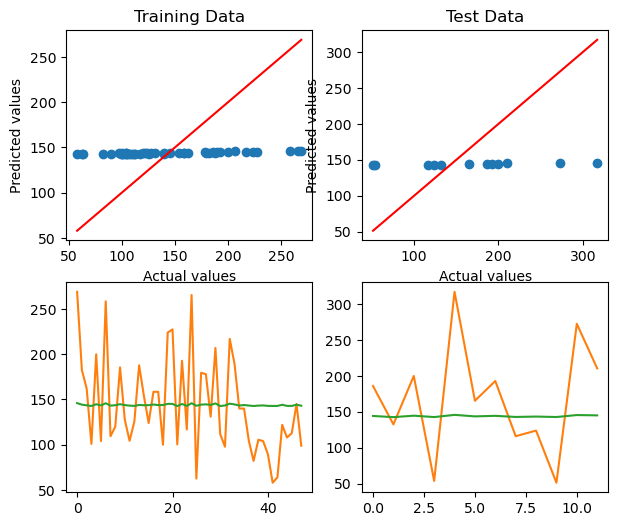

Epoch 100, Training Loss: 0.1353
Train R²:  0.83131   Train MPE:  85.14 %
Test R² :  0.83339   Test MPE :  69.00 %


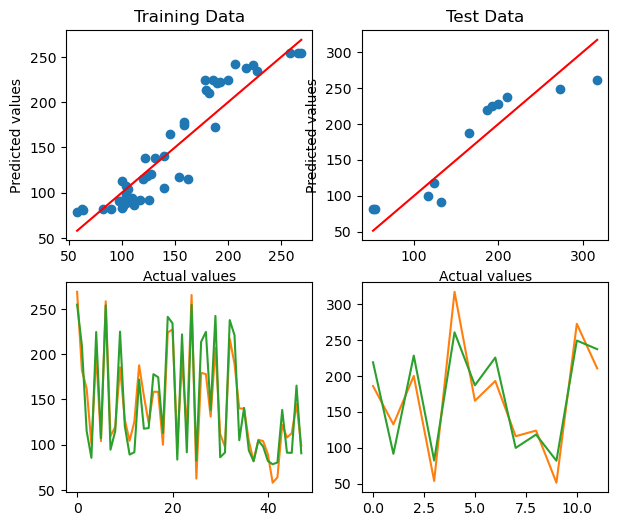

Epoch 150, Training Loss: 0.0094
Train R²:  0.98831   Train MPE:  12.83 %
Test R² :  0.92945   Test MPE :  21.45 %


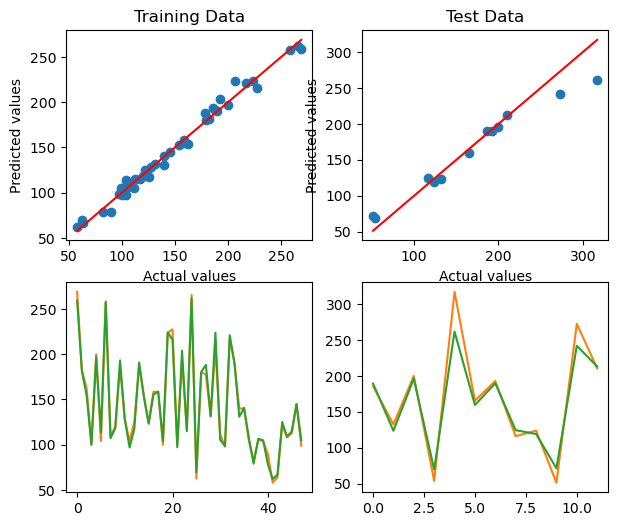

Epoch 200, Training Loss: 0.0034
Train R²:  0.99571   Train MPE:  10.10 %
Test R² :  0.93698   Test MPE :  23.66 %


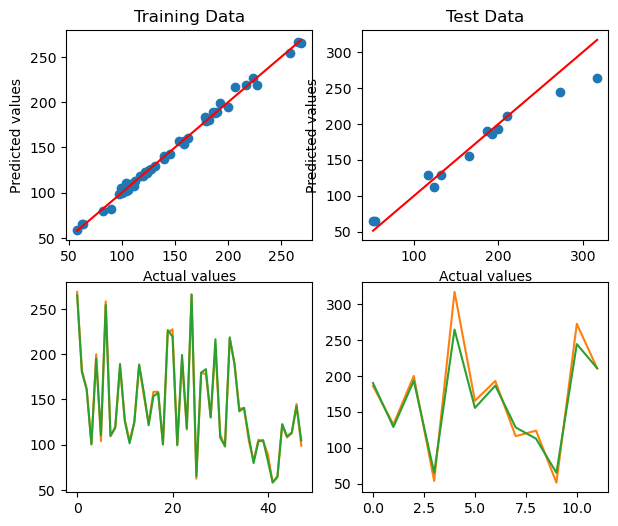

Epoch 250, Training Loss: 0.0019
Train R²:  0.99764   Train MPE:  8.18 %
Test R² :  0.93407   Test MPE :  24.86 %


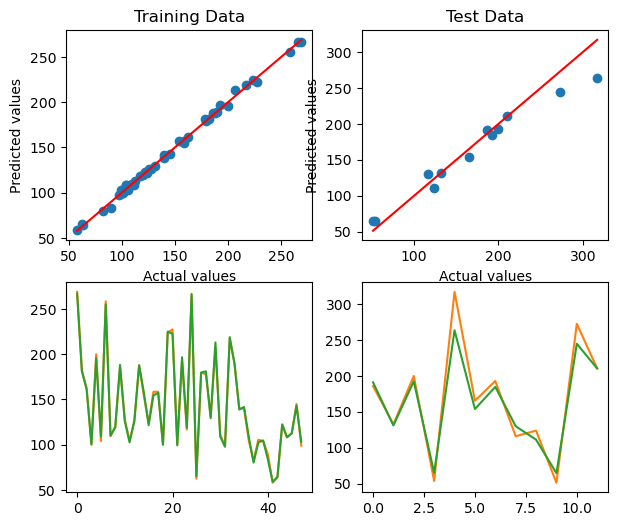

Epoch 300, Training Loss: 0.0013
Train R²:  0.99844   Train MPE:  6.66 %
Test R² :  0.93285   Test MPE :  24.99 %


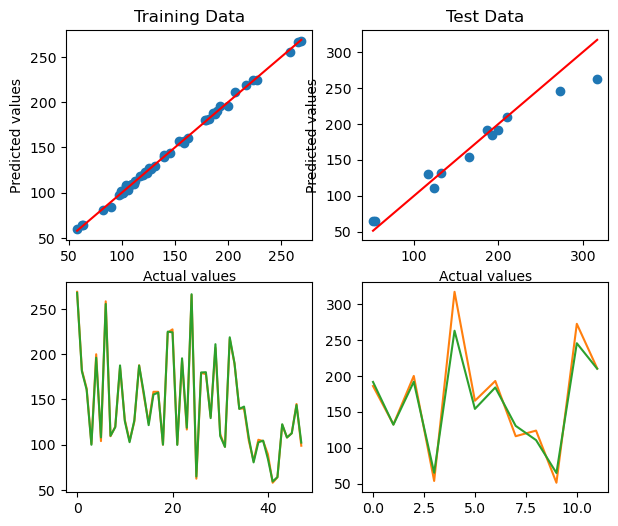

Epoch 350, Training Loss: 0.0009
Train R²:  0.99887   Train MPE:  5.62 %
Test R² :  0.93111   Test MPE :  25.46 %


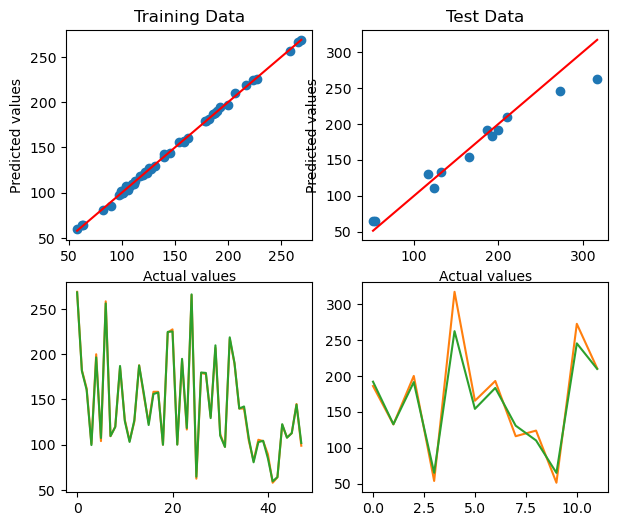

Epoch 400, Training Loss: 0.0007
Train R²:  0.99914   Train MPE:  4.87 %
Test R² :  0.93026   Test MPE :  25.95 %


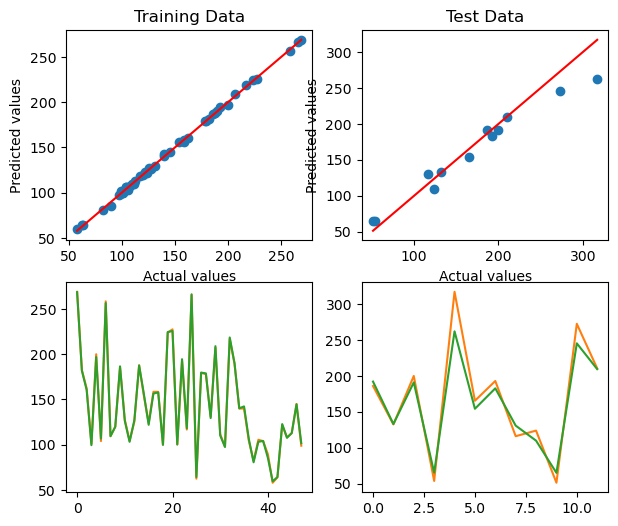

Epoch 450, Training Loss: 0.0005
Train R²:  0.99932   Train MPE:  4.25 %
Test R² :  0.92957   Test MPE :  26.22 %


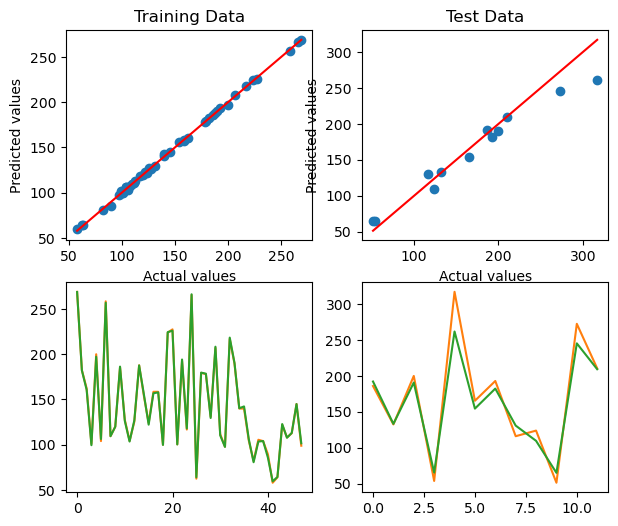

Epoch 500, Training Loss: 0.0004
Train R²:  0.99944   Train MPE:  3.85 %
Test R² :  0.92878   Test MPE :  26.43 %


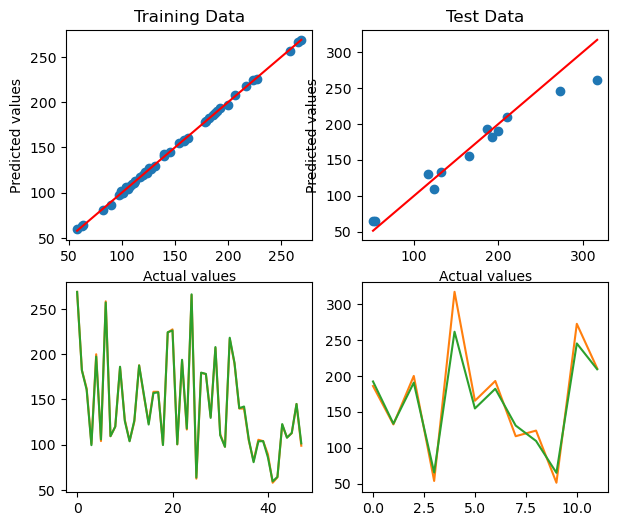

Epoch 550, Training Loss: 0.0004
Train R²:  0.99953   Train MPE:  3.55 %
Test R² :  0.92795   Test MPE :  26.56 %


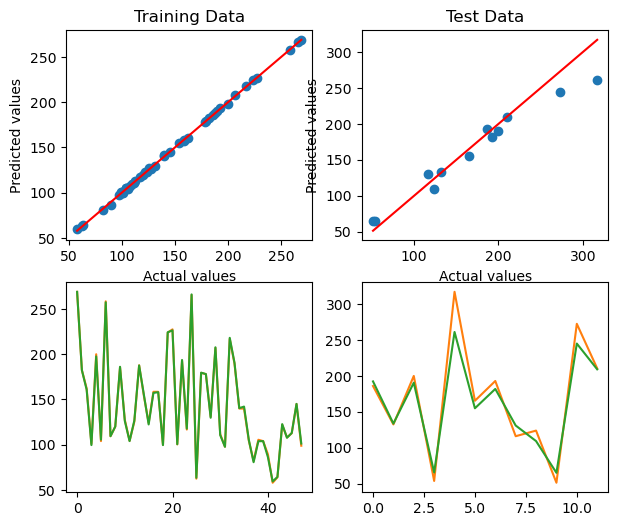

Epoch 600, Training Loss: 0.0003
Train R²:  0.99960   Train MPE:  3.29 %
Test R² :  0.92718   Test MPE :  26.69 %


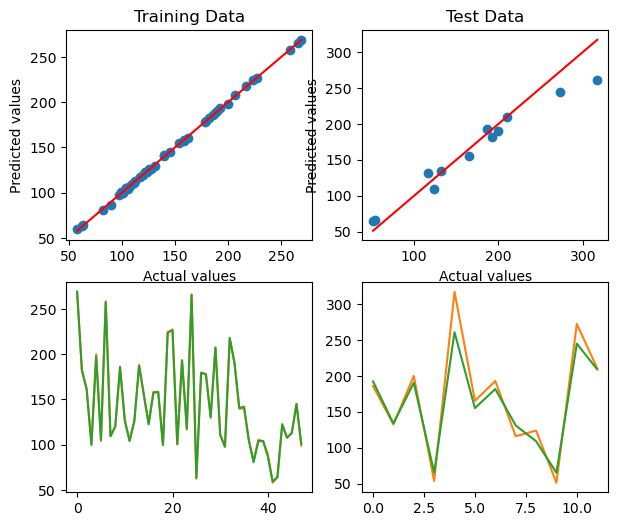

Epoch 650, Training Loss: 0.0003
Train R²:  0.99965   Train MPE:  3.07 %
Test R² :  0.92655   Test MPE :  26.74 %


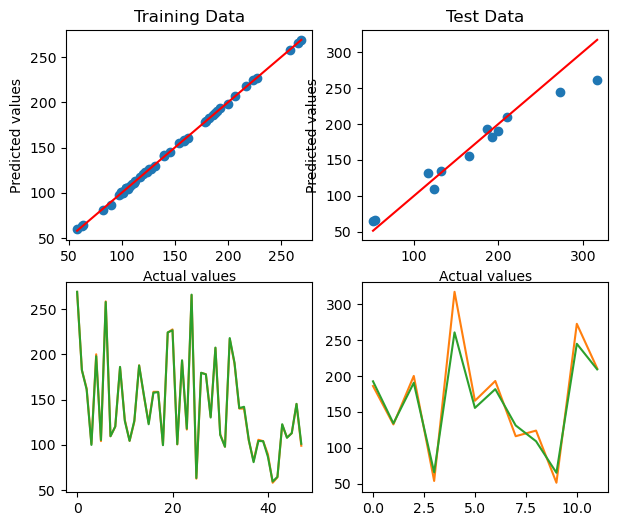

Epoch 700, Training Loss: 0.0003
Train R²:  0.99969   Train MPE:  2.88 %
Test R² :  0.92599   Test MPE :  26.77 %


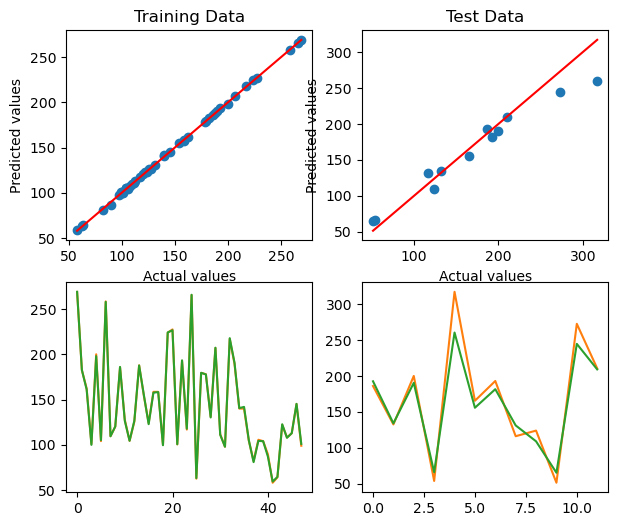

Epoch 750, Training Loss: 0.0002
Train R²:  0.99972   Train MPE:  2.70 %
Test R² :  0.92551   Test MPE :  26.78 %


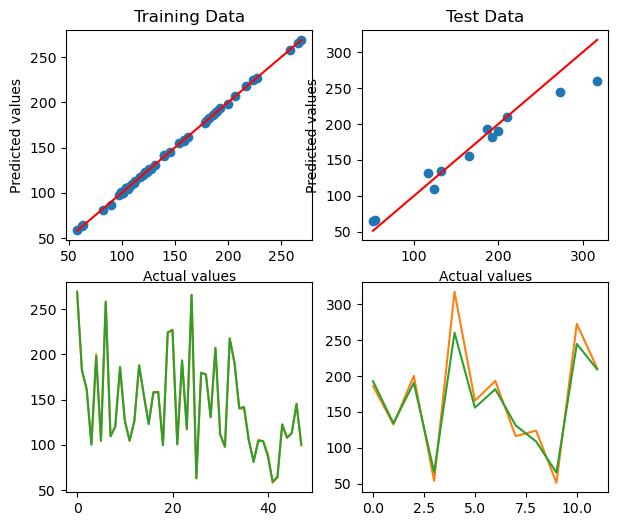

Epoch 800, Training Loss: 0.0002
Train R²:  0.99975   Train MPE:  2.52 %
Test R² :  0.92511   Test MPE :  26.78 %


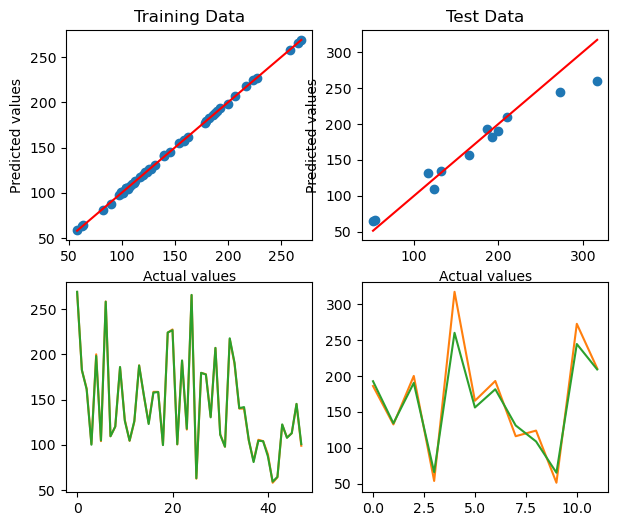

Epoch 850, Training Loss: 0.0002
Train R²:  0.99978   Train MPE:  2.38 %
Test R² :  0.92476   Test MPE :  26.77 %


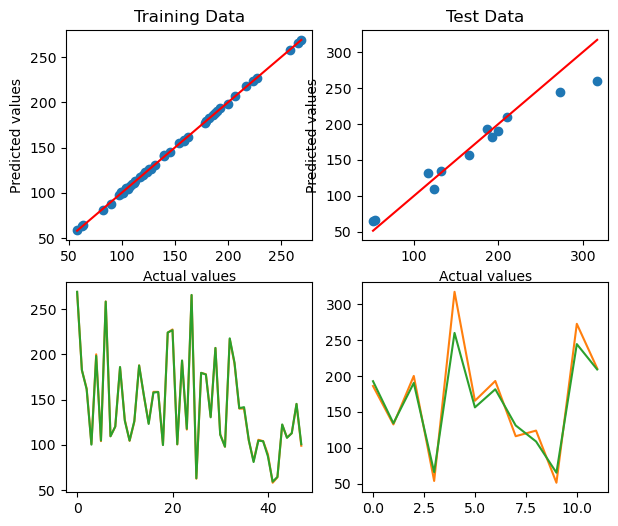

Epoch 900, Training Loss: 0.0002
Train R²:  0.99980   Train MPE:  2.25 %
Test R² :  0.92448   Test MPE :  26.73 %


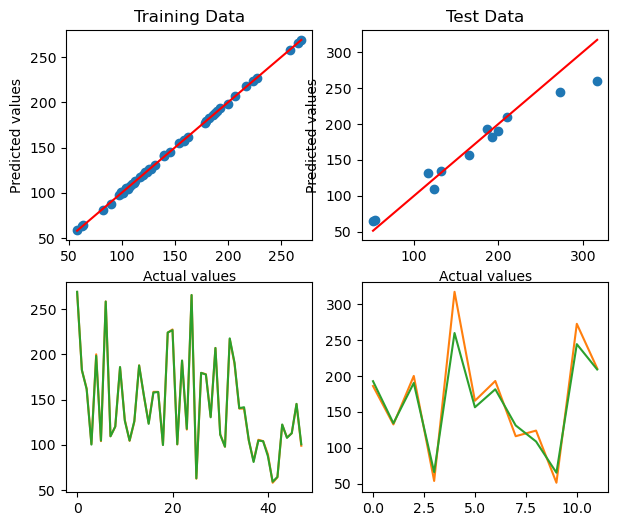

Epoch 950, Training Loss: 0.0001
Train R²:  0.99981   Train MPE:  2.12 %
Test R² :  0.92426   Test MPE :  26.70 %


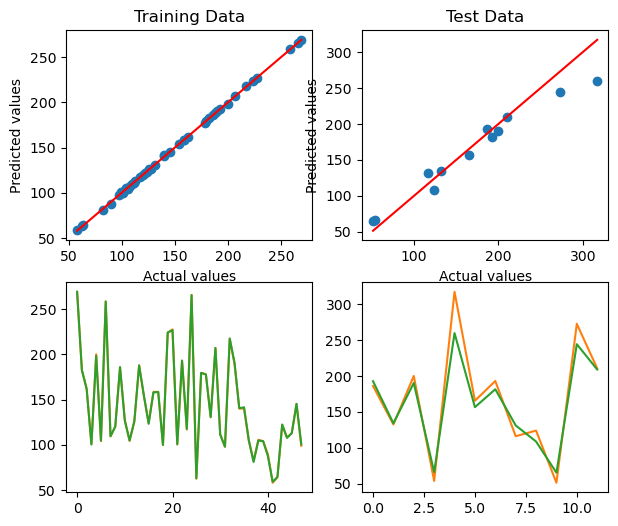

Epoch 1000, Training Loss: 0.0001
Train R²:  0.99983   Train MPE:  2.00 %
Test R² :  0.92406   Test MPE :  26.66 %


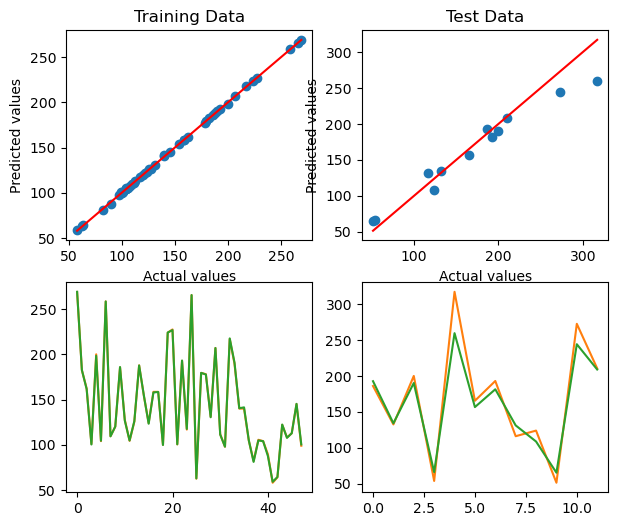

In [67]:
GBR_DNN(5)

GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  2
Train R²:  0.99798
Test R² :  0.04424
GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  3
Train R²:  1.00000
Test R² :  0.21452
GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  4
Train R²:  1.00000
Test R² :  0.37450
GBR Parameters: n-estimators =  30000  lr =  0.01  max depth =  2
Train R²:  1.00000
Test R² :  0.11248
GBR Parameters: n-estimators =  30000  lr =  0.01  max depth =  3
Train R²:  1.00000
Test R² :  0.16734
GBR Parameters: n-estimators =  30000  lr =  0.01  max depth =  4
Train R²:  1.00000
Test R² :  0.22858
GBR Parameters: n-estimators =  30000  lr =  0.1  max depth =  2
Train R²:  1.00000
Test R² :  0.18390
GBR Parameters: n-estimators =  30000  lr =  0.1  max depth =  3
Train R²:  1.00000
Test R² :  0.26238
GBR Parameters: n-estimators =  30000  lr =  0.1  max depth =  4
Train R²:  1.00000
Test R² :  0.18906
GBR Parameters: n-estimators =  30000  lr =  0.2  max depth =  2

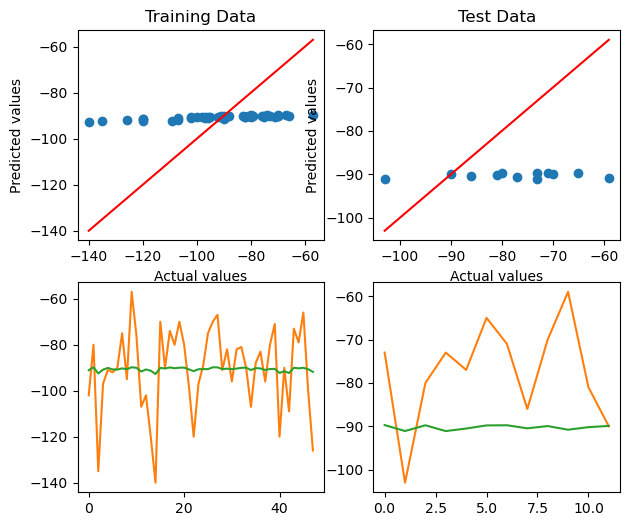

Epoch 100, Training Loss: 0.0674
Train R²:  0.93508   Train MPE:  174.96 %
Test R² :  0.30402   Test MPE :  121.83 %


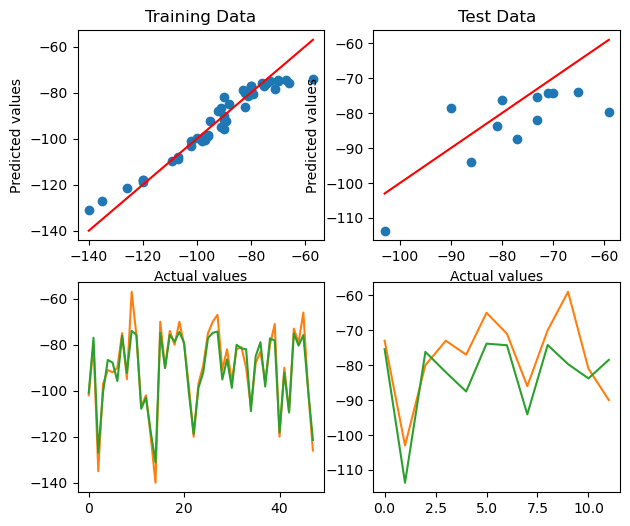

Epoch 150, Training Loss: 0.0125
Train R²:  0.98798   Train MPE:  85.13 %
Test R² :  0.39360   Test MPE :  116.91 %


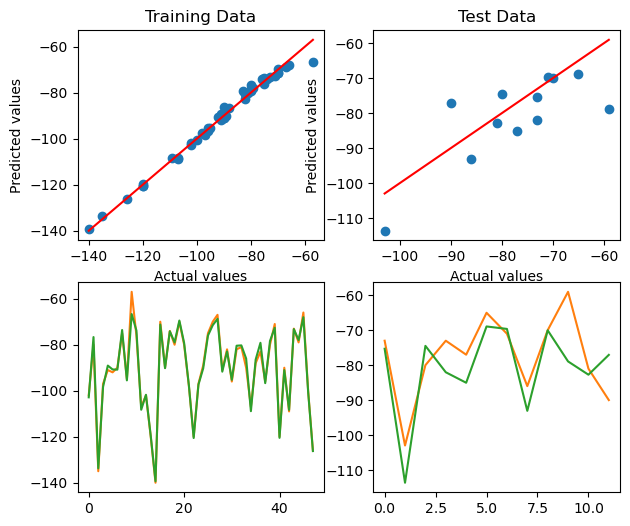

Epoch 200, Training Loss: 0.0038
Train R²:  0.99631   Train MPE:  30.48 %
Test R² :  0.38054   Test MPE :  119.92 %


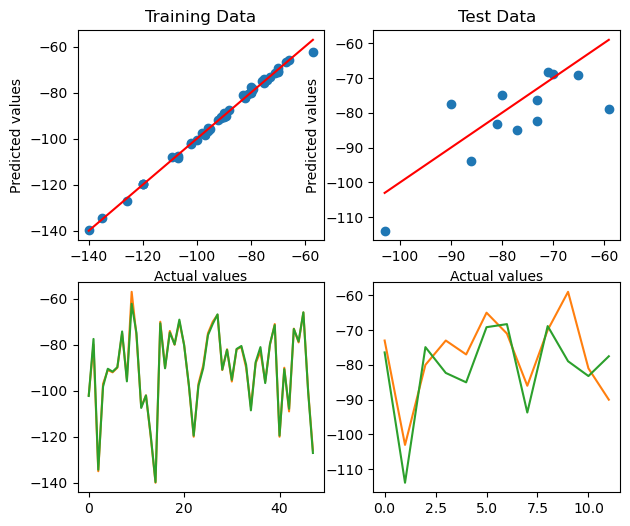

Epoch 250, Training Loss: 0.0018
Train R²:  0.99828   Train MPE:  25.23 %
Test R² :  0.39518   Test MPE :  119.00 %


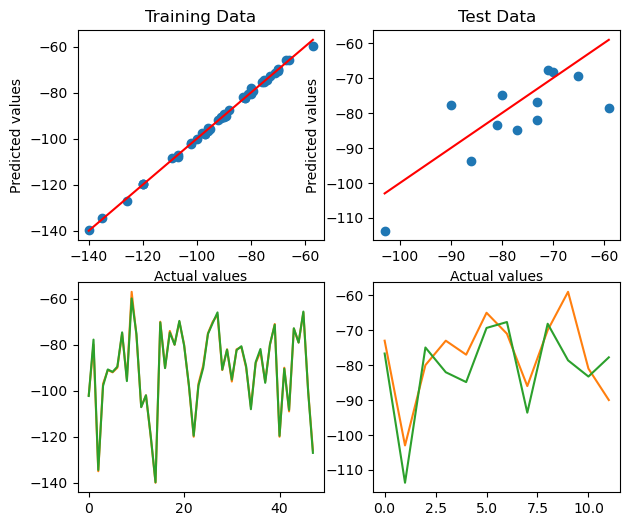

Epoch 300, Training Loss: 0.0012
Train R²:  0.99889   Train MPE:  22.11 %
Test R² :  0.40849   Test MPE :  117.72 %


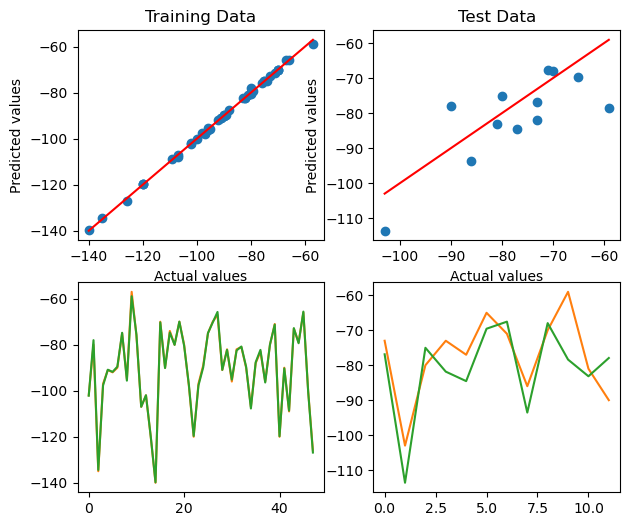

Epoch 350, Training Loss: 0.0009
Train R²:  0.99917   Train MPE:  19.53 %
Test R² :  0.41851   Test MPE :  116.76 %


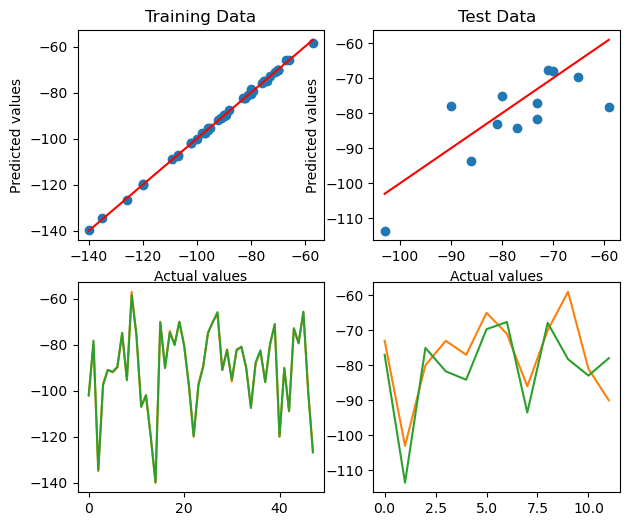

Epoch 400, Training Loss: 0.0007
Train R²:  0.99933   Train MPE:  16.65 %
Test R² :  0.42428   Test MPE :  116.19 %


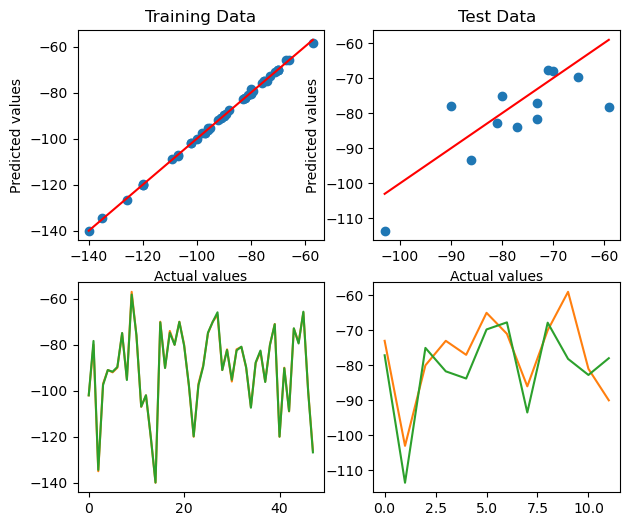

Epoch 450, Training Loss: 0.0006
Train R²:  0.99944   Train MPE:  14.96 %
Test R² :  0.42841   Test MPE :  115.75 %


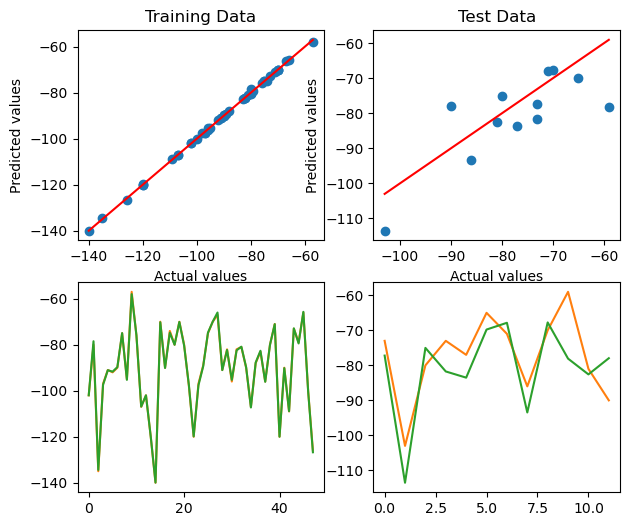

Epoch 500, Training Loss: 0.0005
Train R²:  0.99954   Train MPE:  12.82 %
Test R² :  0.43115   Test MPE :  115.38 %


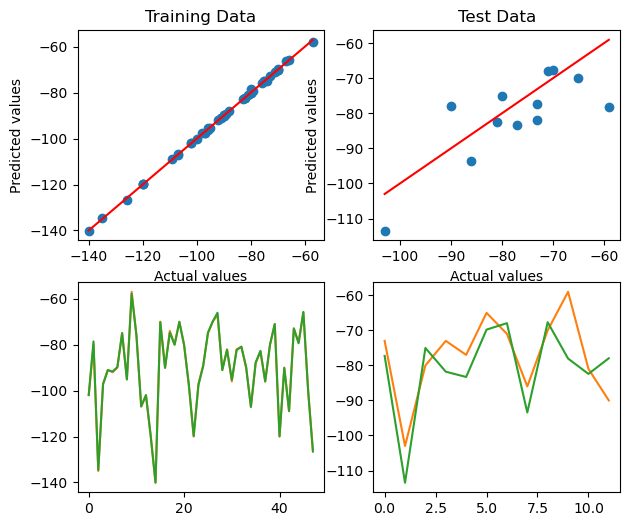

Epoch 550, Training Loss: 0.0004
Train R²:  0.99962   Train MPE:  10.11 %
Test R² :  0.43291   Test MPE :  115.10 %


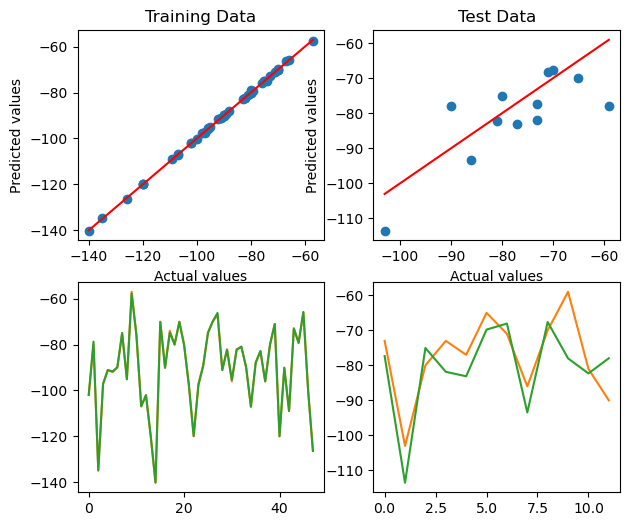

Epoch 600, Training Loss: 0.0003
Train R²:  0.99967   Train MPE:  8.62 %
Test R² :  0.43415   Test MPE :  114.80 %


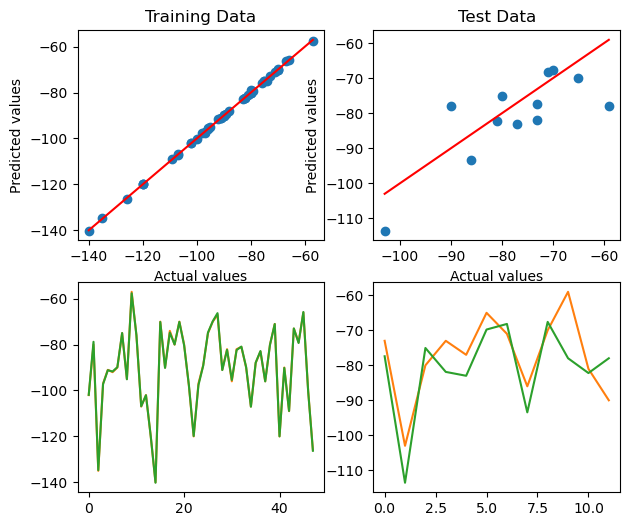

Epoch 650, Training Loss: 0.0003
Train R²:  0.99971   Train MPE:  7.56 %
Test R² :  0.43521   Test MPE :  114.55 %


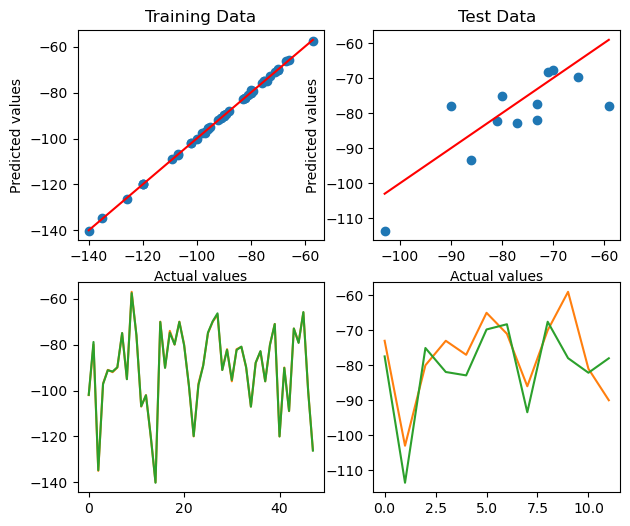

Epoch 700, Training Loss: 0.0003
Train R²:  0.99974   Train MPE:  6.74 %
Test R² :  0.43565   Test MPE :  114.36 %


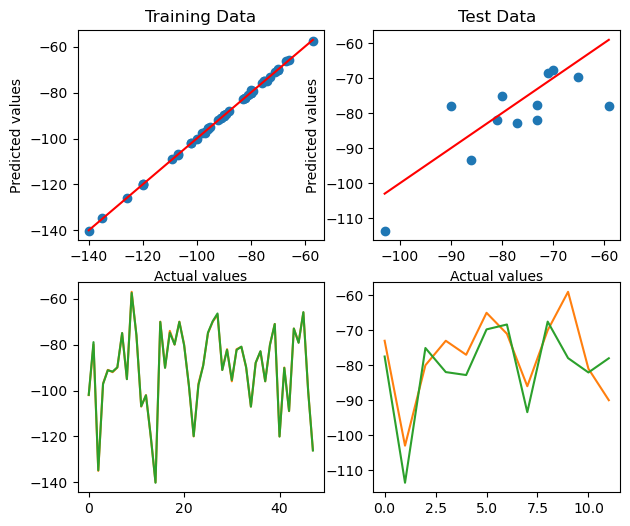

Epoch 750, Training Loss: 0.0002
Train R²:  0.99977   Train MPE:  6.13 %
Test R² :  0.43631   Test MPE :  114.18 %


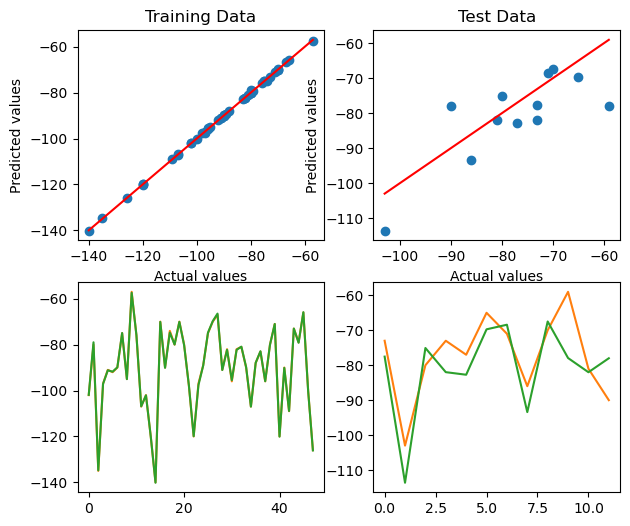

Epoch 800, Training Loss: 0.0002
Train R²:  0.99979   Train MPE:  5.57 %
Test R² :  0.43666   Test MPE :  114.03 %


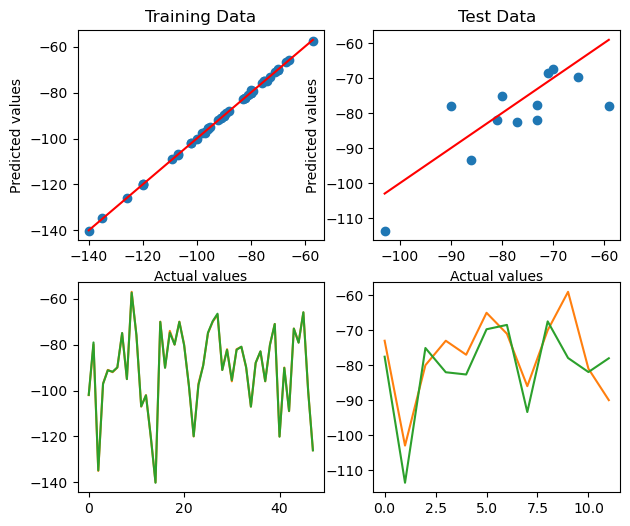

Epoch 850, Training Loss: 0.0002
Train R²:  0.99981   Train MPE:  5.39 %
Test R² :  0.43742   Test MPE :  113.84 %


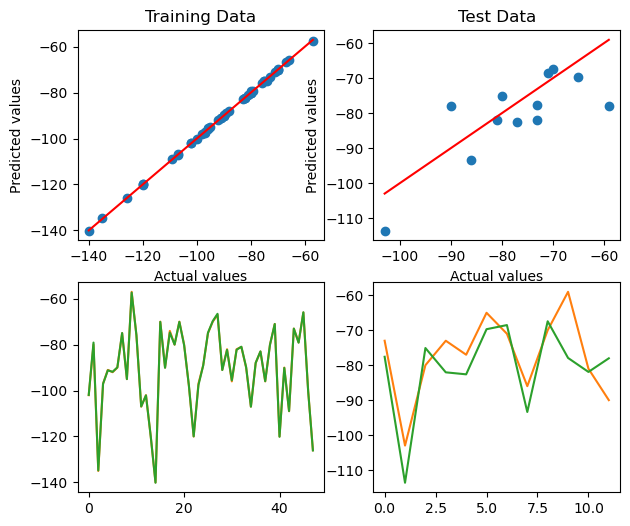

Epoch 900, Training Loss: 0.0002
Train R²:  0.99983   Train MPE:  5.18 %
Test R² :  0.43772   Test MPE :  113.68 %


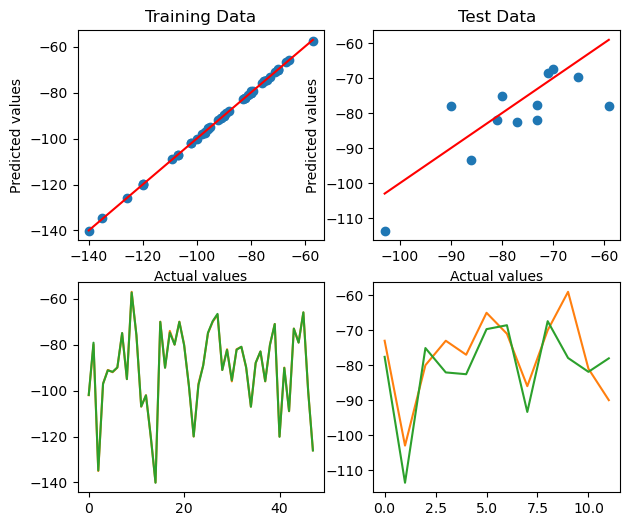

Epoch 950, Training Loss: 0.0002
Train R²:  0.99984   Train MPE:  5.01 %
Test R² :  0.43776   Test MPE :  113.55 %


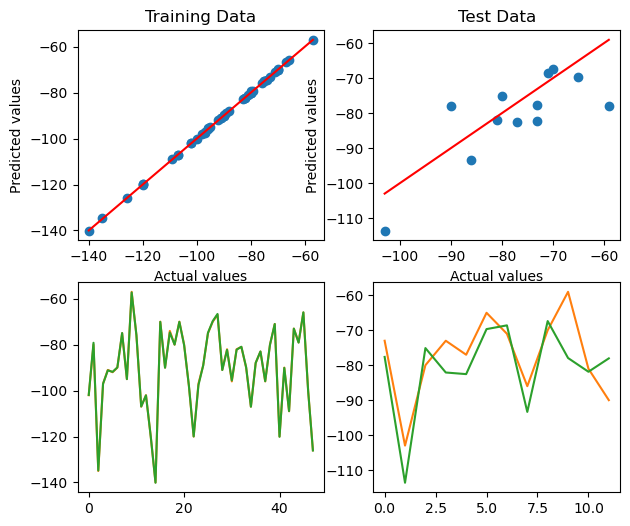

Epoch 1000, Training Loss: 0.0002
Train R²:  0.99985   Train MPE:  4.74 %
Test R² :  0.43749   Test MPE :  113.47 %


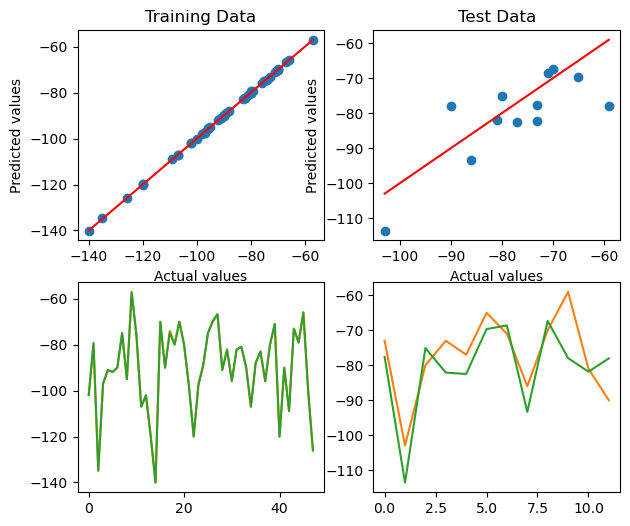

In [68]:
GBR_DNN(6)

### Manual Code

Epoch 50, Training Loss: 0.5959
Train R²:  0.25698   Train MPE:  86.99 %
Test R² :  0.14874   Test MPE :  77.78 %


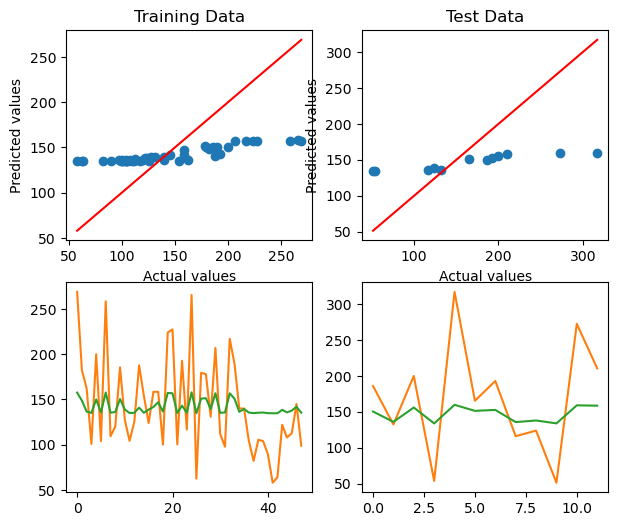

Epoch 100, Training Loss: 0.0126
Train R²:  0.98425   Train MPE:  15.28 %
Test R² :  0.89513   Test MPE :  52.82 %


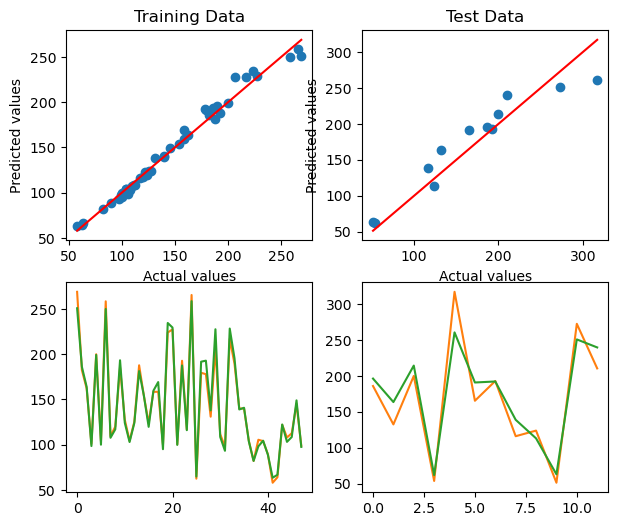

Epoch 150, Training Loss: 0.0043
Train R²:  0.99459   Train MPE:  10.30 %
Test R² :  0.91201   Test MPE :  49.09 %


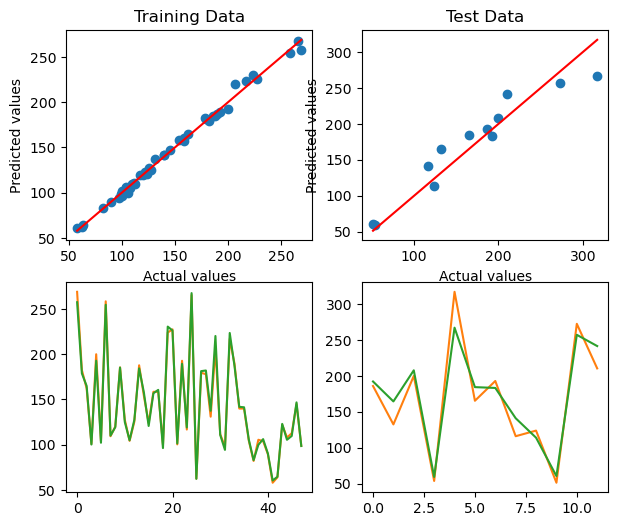

Epoch 200, Training Loss: 0.0028
Train R²:  0.99648   Train MPE:  7.30 %
Test R² :  0.90869   Test MPE :  49.08 %


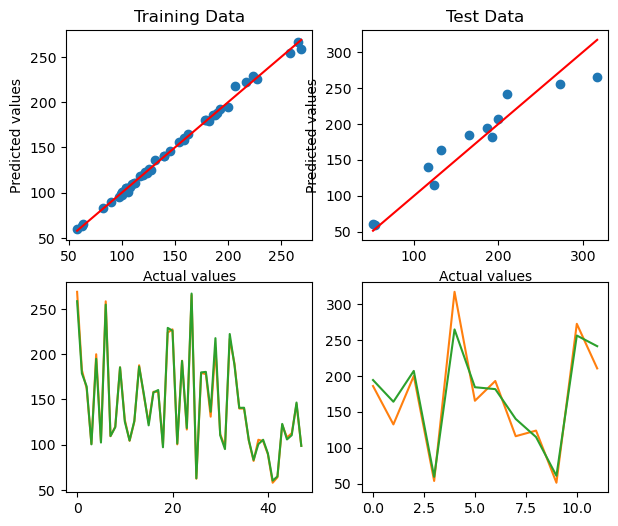

Epoch 250, Training Loss: 0.0021
Train R²:  0.99739   Train MPE:  5.89 %
Test R² :  0.90767   Test MPE :  48.77 %


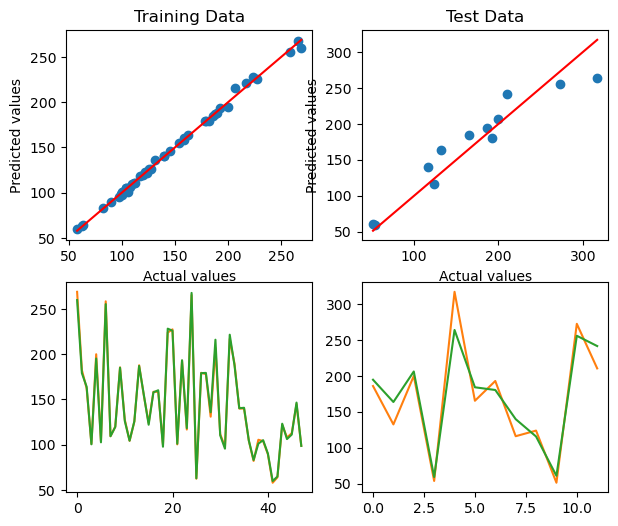

Epoch 300, Training Loss: 0.0016
Train R²:  0.99802   Train MPE:  5.01 %
Test R² :  0.90633   Test MPE :  48.76 %


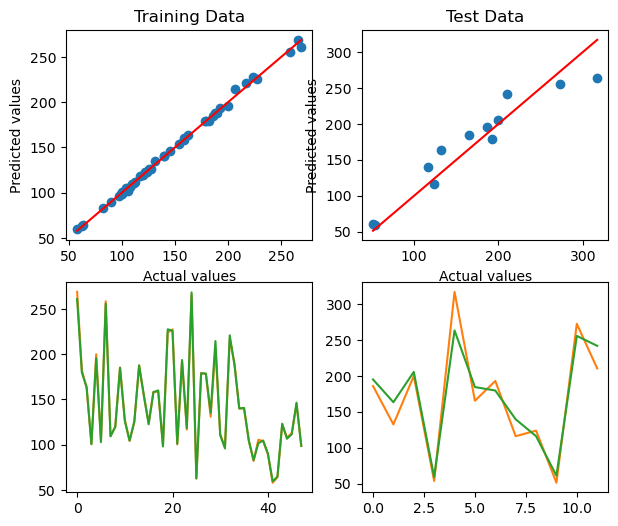

Epoch 350, Training Loss: 0.0012
Train R²:  0.99851   Train MPE:  4.29 %
Test R² :  0.90443   Test MPE :  48.78 %


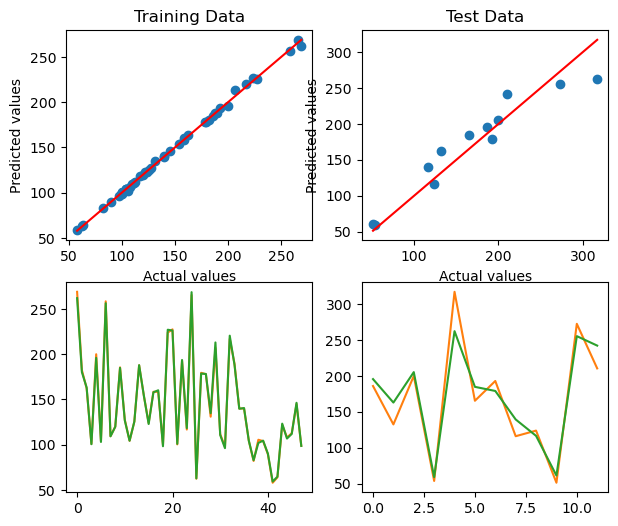

Epoch 400, Training Loss: 0.0009
Train R²:  0.99888   Train MPE:  3.77 %
Test R² :  0.90245   Test MPE :  48.82 %


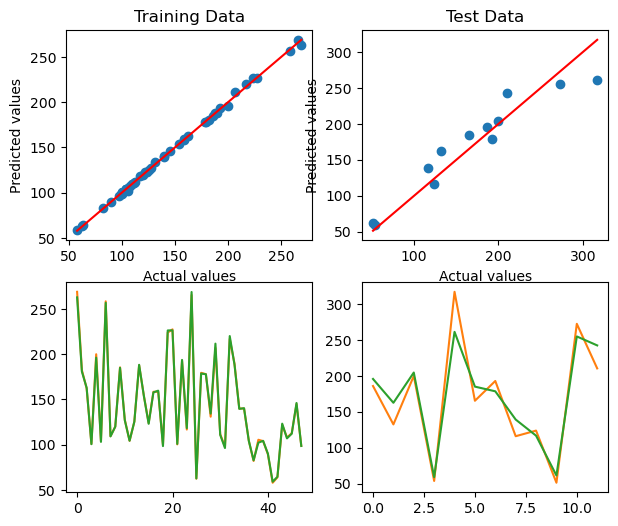

Epoch 450, Training Loss: 0.0007
Train R²:  0.99915   Train MPE:  3.33 %
Test R² :  0.89979   Test MPE :  49.00 %


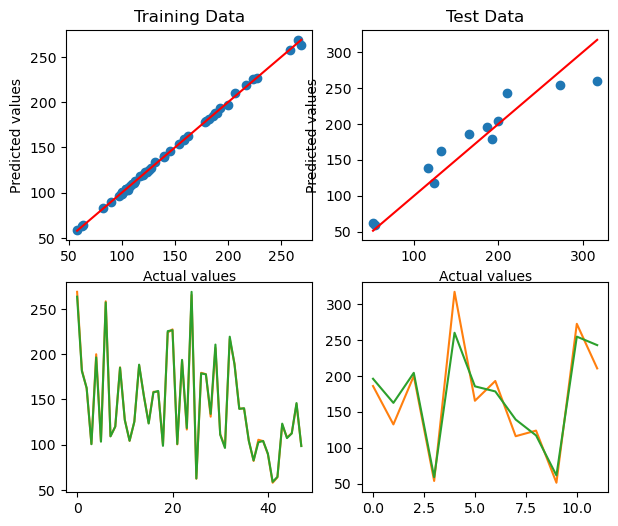

Epoch 500, Training Loss: 0.0005
Train R²:  0.99934   Train MPE:  2.91 %
Test R² :  0.89691   Test MPE :  49.17 %


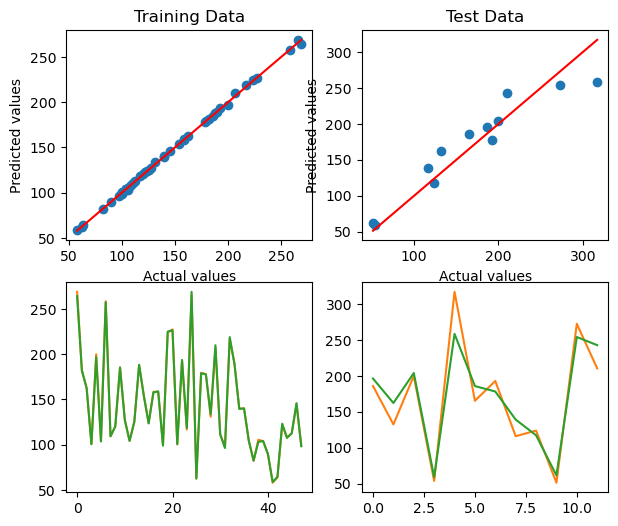

Epoch 550, Training Loss: 0.0004
Train R²:  0.99946   Train MPE:  2.60 %
Test R² :  0.89432   Test MPE :  49.43 %


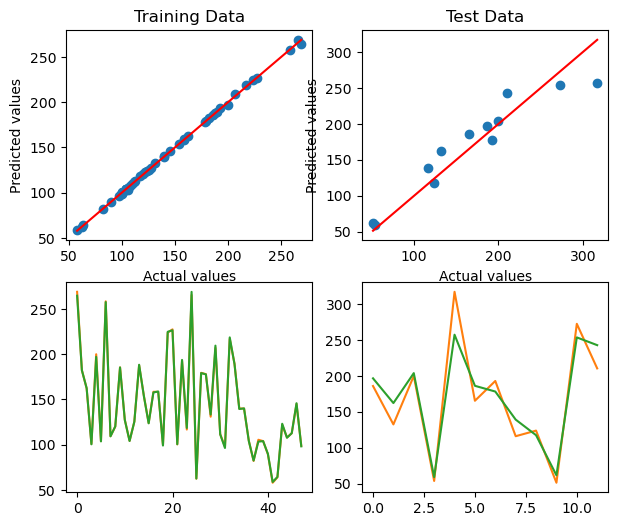

Epoch 600, Training Loss: 0.0004
Train R²:  0.99955   Train MPE:  2.35 %
Test R² :  0.89211   Test MPE :  49.64 %


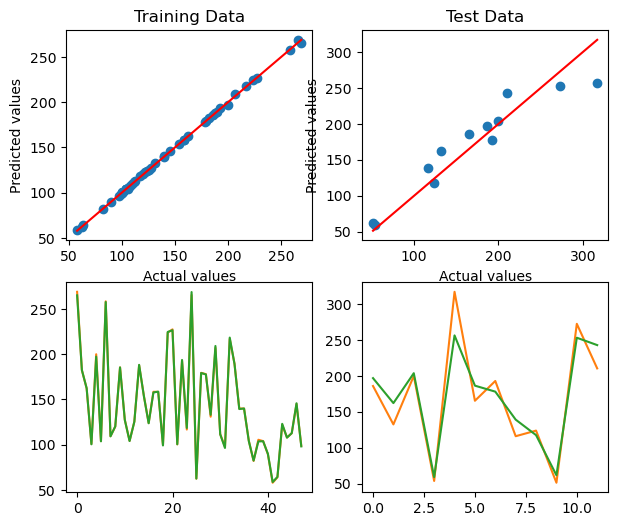

Epoch 650, Training Loss: 0.0003
Train R²:  0.99961   Train MPE:  2.19 %
Test R² :  0.89022   Test MPE :  49.83 %


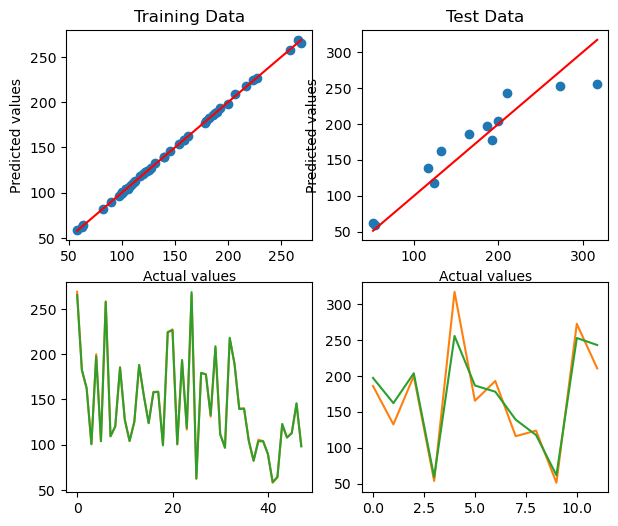

Epoch 700, Training Loss: 0.0003
Train R²:  0.99966   Train MPE:  2.09 %
Test R² :  0.88844   Test MPE :  49.99 %


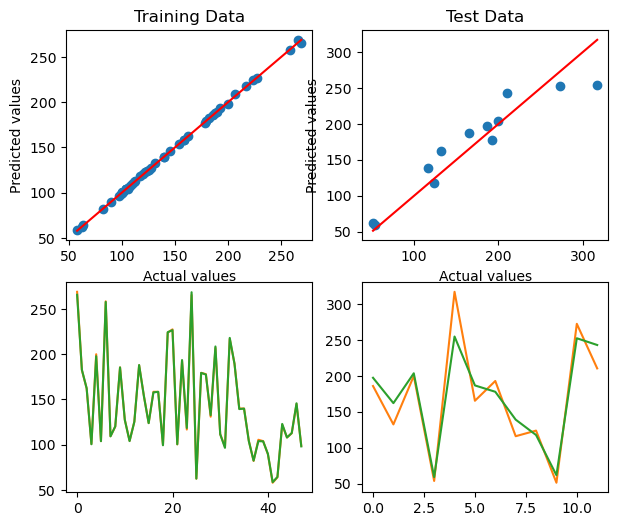

Epoch 750, Training Loss: 0.0002
Train R²:  0.99970   Train MPE:  2.01 %
Test R² :  0.88684   Test MPE :  50.16 %


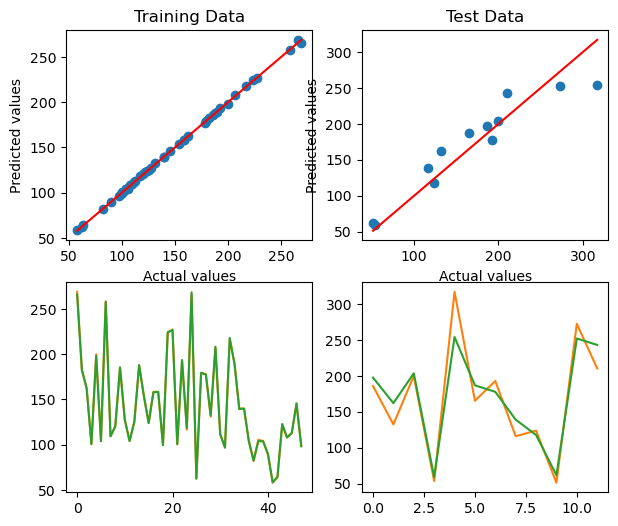

Epoch 800, Training Loss: 0.0002
Train R²:  0.99974   Train MPE:  1.95 %
Test R² :  0.88545   Test MPE :  50.31 %


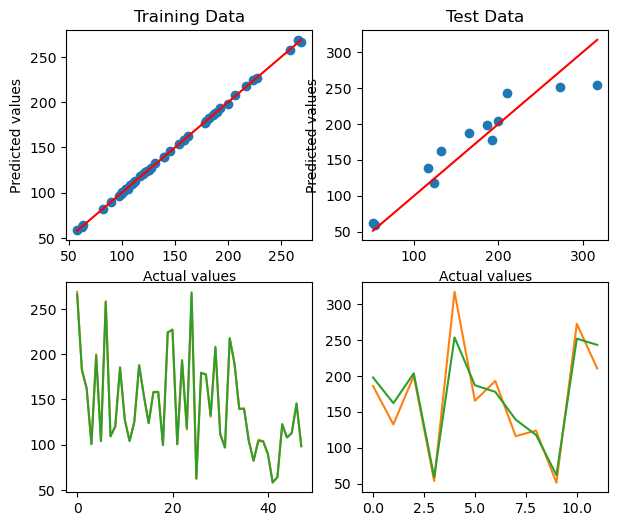

Epoch 850, Training Loss: 0.0002
Train R²:  0.99977   Train MPE:  1.88 %
Test R² :  0.88419   Test MPE :  50.45 %


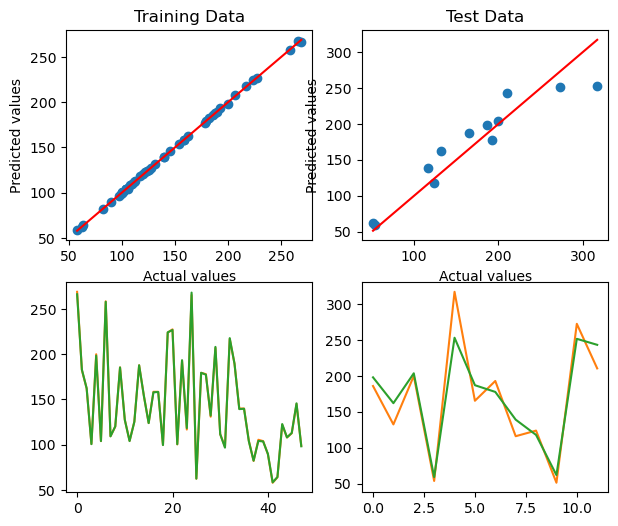

Epoch 900, Training Loss: 0.0002
Train R²:  0.99979   Train MPE:  1.82 %
Test R² :  0.88303   Test MPE :  50.56 %


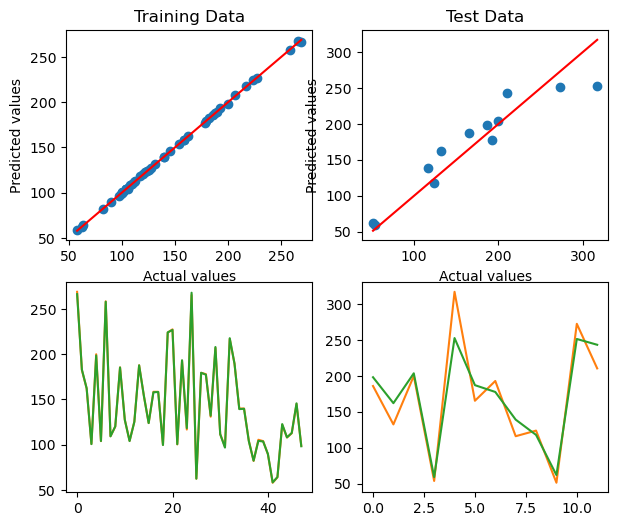

Epoch 950, Training Loss: 0.0002
Train R²:  0.99981   Train MPE:  1.77 %
Test R² :  0.88200   Test MPE :  50.68 %


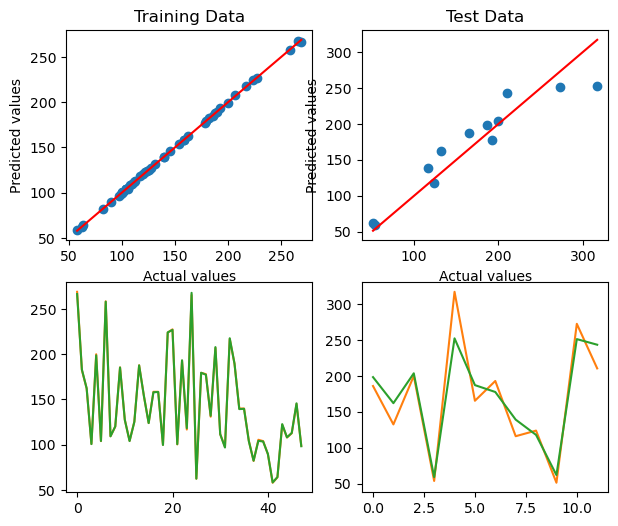

Epoch 1000, Training Loss: 0.0001
Train R²:  0.99983   Train MPE:  1.73 %
Test R² :  0.88103   Test MPE :  50.78 %


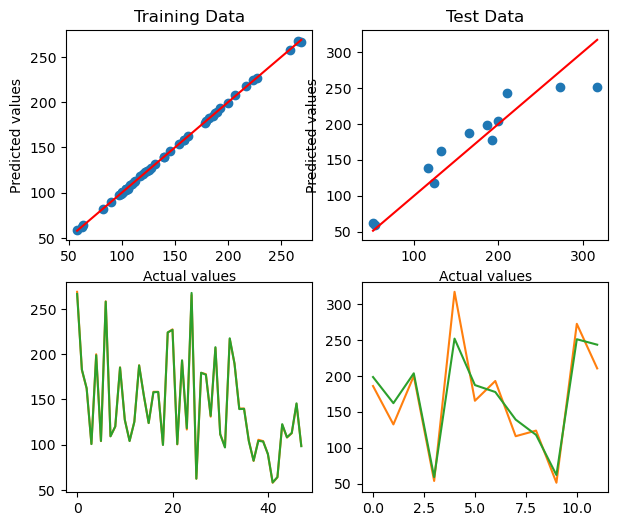

In [63]:
X = pd.read_excel(root,usecols=[3,4])
y = pd.read_excel(root,usecols=[5])

# Normalize inputs
scaler_X = StandardScaler()
X_scaled = scaler_X.fit_transform(X)

scaler_y = StandardScaler()
y_scaled = scaler_y.fit_transform(y)

# Use scaled data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=10)

# Convert y to float and flatten
y_train = np.array(y_train, dtype=np.float32).ravel()
y_test = np.array(y_test, dtype=np.float32).ravel()

# Train the Gradient Boosting Regressor #70000, 0.001, 4
gbr = GradientBoostingRegressor(n_estimators= 30000, learning_rate= 0.001, max_depth= 3, random_state=42, tol=1e-5)
gbr.fit(X_train, y_train)

# Get GBR predictions
gbr_train_pred = gbr.predict(X_train)
gbr_test_pred = gbr.predict(X_test)

# X_train_gbr = scaler_y.inverse_transform(gbr_train_pred.reshape(-1, 1))
# print(X_train_gbr)

# Augment inputs
X_train_nn = np.hstack([X_train, gbr_train_pred.reshape(-1, 1)])
X_test_nn = np.hstack([X_test, gbr_test_pred.reshape(-1, 1)])

# Convert to tensors
X_train = torch.tensor(X_train_nn, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
X_test = torch.tensor(X_test_nn, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)

# Neural network class
class DeepNN(nn.Module):
    def __init__(self, input_size=3, hidden_size= 32, output_size=1):
        super(DeepNN, self).__init__()
        # self.fc1 = nn.Linear(input_size, hidden_size)
        # self.activation = nn.ReLU()
        # self.out = nn.Linear(hidden_size, output_size)
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.fc4 = nn.Linear(hidden_size, hidden_size)
        self.fc5 = nn.Linear(hidden_size, hidden_size)
        self.fc6 = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # x = self.activation(self.fc1(x))
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        x = torch.relu(self.fc4(x))
        x = torch.relu(self.fc5(x))
        x = self.fc6(x)
        return x

# Model, loss, optimizer
model = DeepNN()
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

# Training loop
num_epochs = 1000
for epoch in range(num_epochs):
    model.train()
    y_train_pred = model(X_train)
    loss = criterion(y_train_pred, y_train)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if (epoch + 1) % 50 == 0:
        model.eval()
        y_test_pred = model(X_test)
        train_r2 = r2_score(y_train.detach().numpy(), y_train_pred.detach().numpy())
        train_mpe = mean_absolute_percentage_error(y_train.detach().numpy(), y_train_pred.detach().numpy())
        
        test_r2 = r2_score(y_test.detach().numpy(), y_test_pred.detach().numpy())
        test_mpe = mean_absolute_percentage_error(y_test.detach().numpy(), y_test_pred.detach().numpy())
       
        print(f"Epoch {epoch+1}, Training Loss: {loss.item():.4f}")
        print("Train R²: ", "%.5f" % round(train_r2, 5), "  Train MPE: ", "%.2f" % round(train_mpe * 100, 2),"%")
        print("Test R² : ", "%.5f" % round(test_r2, 5), "  Test MPE : ", "%.2f" % round(test_mpe * 100, 2),"%")
        
        y_train2 = scaler_y.inverse_transform(y_train.detach().numpy())
        y_train_pred2 = scaler_y.inverse_transform(y_train_pred.detach().numpy())
        y_test2 = scaler_y.inverse_transform(y_test.detach().numpy())
        y_test_pred2 = scaler_y.inverse_transform(y_test_pred.detach().numpy())

        fig, axes = plt.subplots(2, 2, figsize = (7, 6))
        axes[0, 0].scatter(y_train2, y_train_pred2)
        axes[0, 0].plot([min(y_train2), max(y_train2)],[min(y_train2), max(y_train2)], color = 'r')
        axes[0, 0].set_title("Training Data")
        axes[0, 0].set_xlabel("Actual values")
        axes[0, 0].set_ylabel("Predicted values")
        
        axes[0, 1].scatter(y_test2, y_test_pred2)
        axes[0, 1].plot([min(y_test2), max(y_test2)],[min(y_test2), max(y_test2)], color = 'r')
        axes[0, 1].set_title("Test Data")
        axes[0, 1].set_xlabel("Actual values")
        axes[0, 1].set_ylabel("Predicted values")

        axes[1, 0].plot(y_train2,'tab:orange', label = 'real')
        axes[1, 0].plot(y_train_pred2,'tab:green',label = 'pred')

        axes[1, 1].plot(y_test2,'tab:orange',label = 'real')
        axes[1, 1].plot(y_test_pred2,'tab:green',label = 'pred')

        plt.draw();plt.pause(0.05)
    
    plt.ioff()
    plt.show()

Epoch 50, Training Loss: 0.1462
Train R²:  0.85923   Train MPE:  529.70 %
Test R² :  -0.49803   Test MPE :  127.46 %


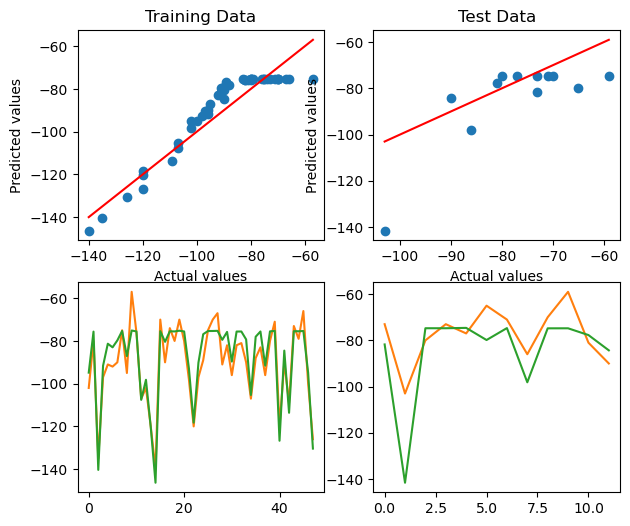

Epoch 100, Training Loss: 0.0096
Train R²:  0.99071   Train MPE:  15.34 %
Test R² :  -0.76798   Test MPE :  152.47 %


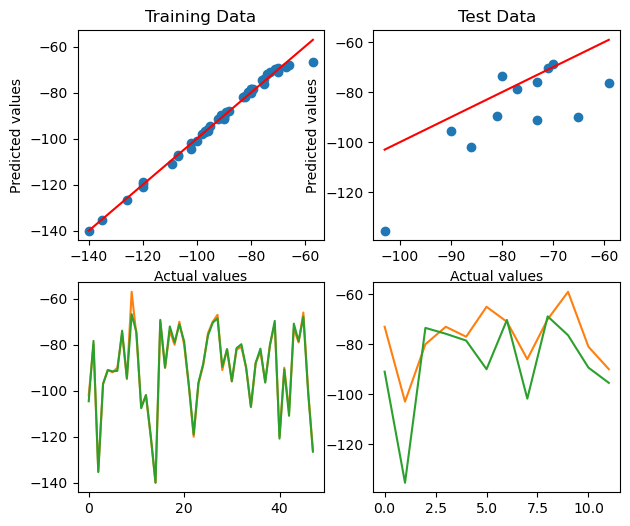

Epoch 150, Training Loss: 0.0035
Train R²:  0.99660   Train MPE:  34.87 %
Test R² :  -0.76318   Test MPE :  148.79 %


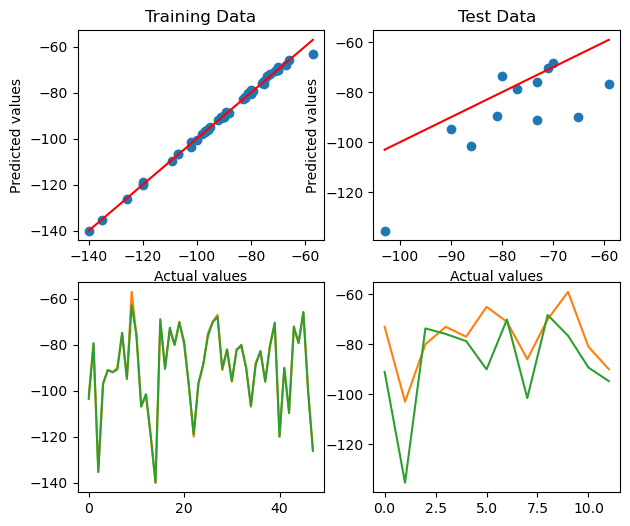

Epoch 200, Training Loss: 0.0017
Train R²:  0.99838   Train MPE:  42.25 %
Test R² :  -0.74205   Test MPE :  147.21 %


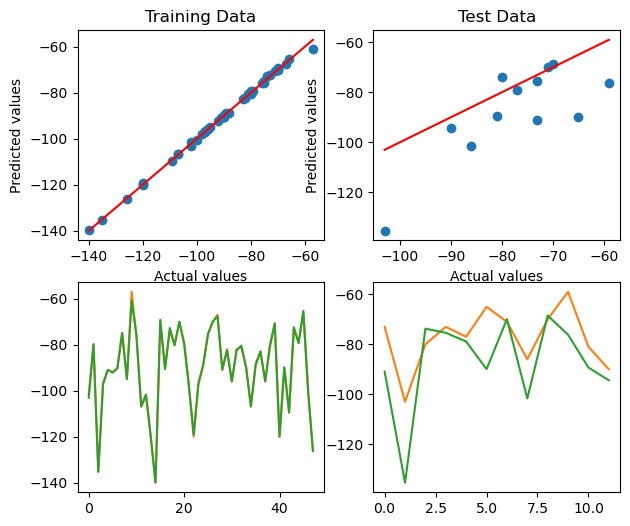

Epoch 250, Training Loss: 0.0010
Train R²:  0.99906   Train MPE:  43.09 %
Test R² :  -0.72703   Test MPE :  146.18 %


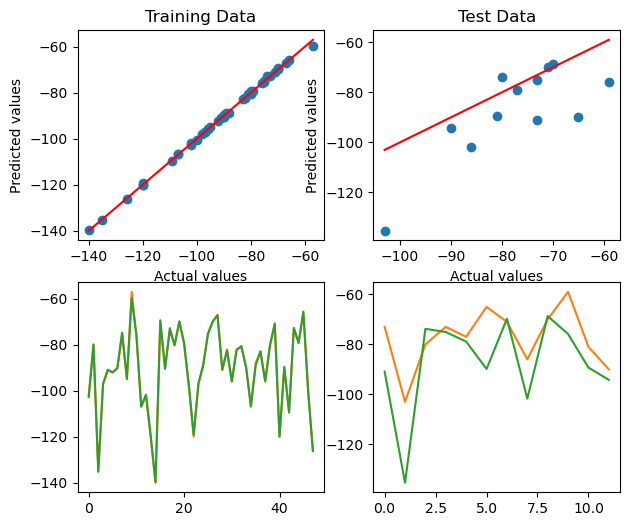

Epoch 300, Training Loss: 0.0007
Train R²:  0.99937   Train MPE:  41.84 %
Test R² :  -0.71907   Test MPE :  145.40 %


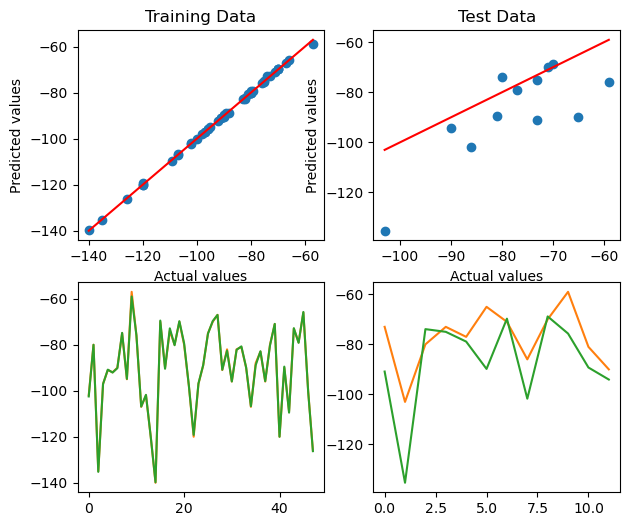

Epoch 350, Training Loss: 0.0005
Train R²:  0.99954   Train MPE:  40.48 %
Test R² :  -0.71637   Test MPE :  144.81 %


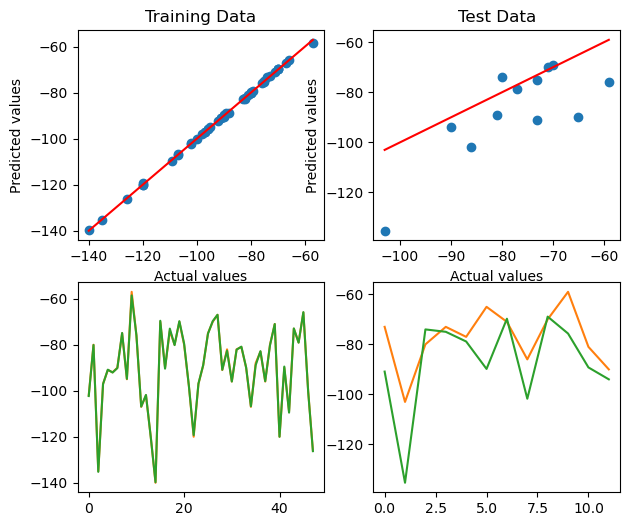

Epoch 400, Training Loss: 0.0004
Train R²:  0.99965   Train MPE:  38.54 %
Test R² :  -0.71488   Test MPE :  144.41 %


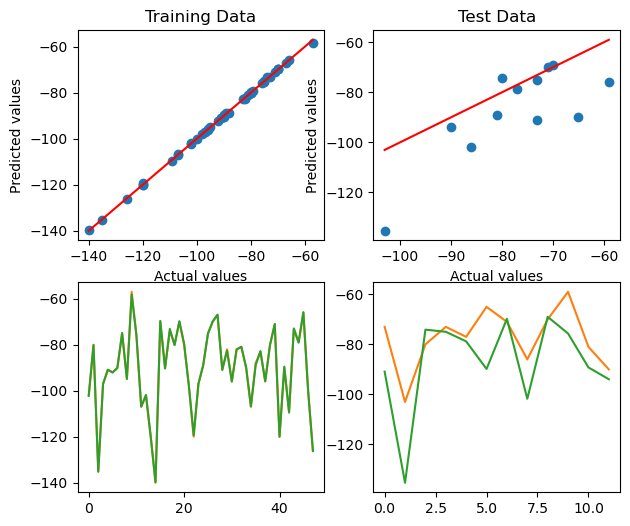

Epoch 450, Training Loss: 0.0003
Train R²:  0.99972   Train MPE:  36.20 %
Test R² :  -0.71448   Test MPE :  144.10 %


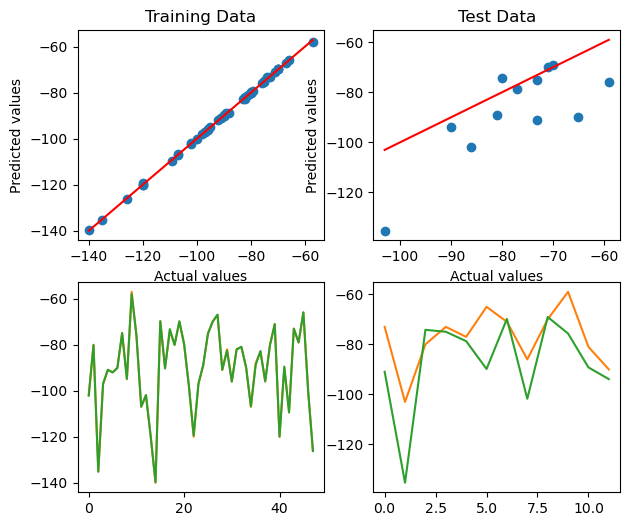

Epoch 500, Training Loss: 0.0002
Train R²:  0.99977   Train MPE:  34.28 %
Test R² :  -0.71313   Test MPE :  143.75 %


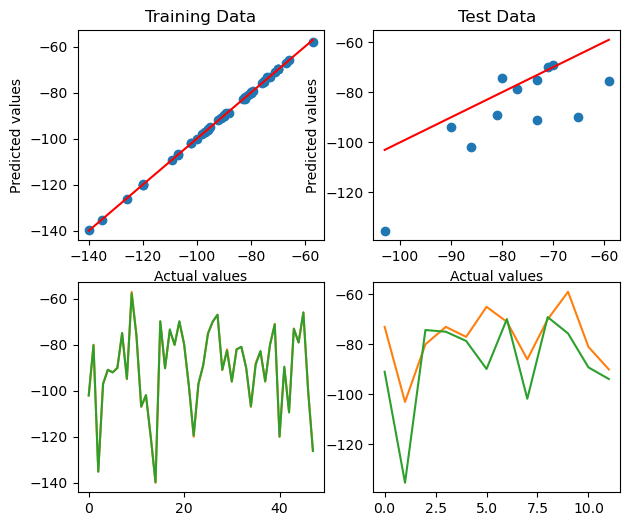

Epoch 550, Training Loss: 0.0002
Train R²:  0.99980   Train MPE:  32.61 %
Test R² :  -0.71257   Test MPE :  143.53 %


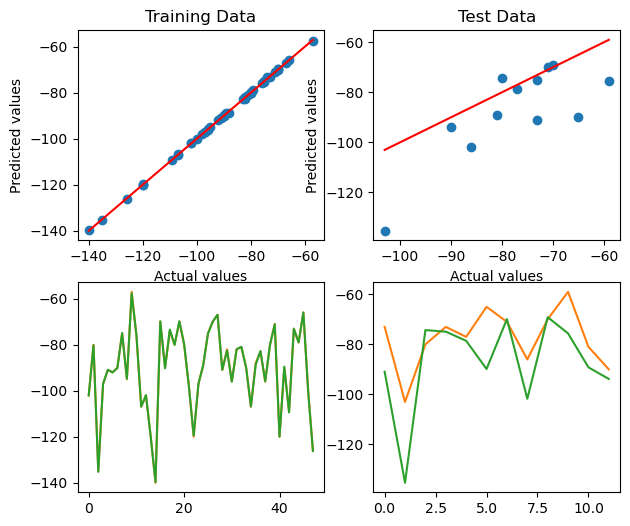

Epoch 600, Training Loss: 0.0002
Train R²:  0.99983   Train MPE:  30.83 %
Test R² :  -0.71214   Test MPE :  143.35 %


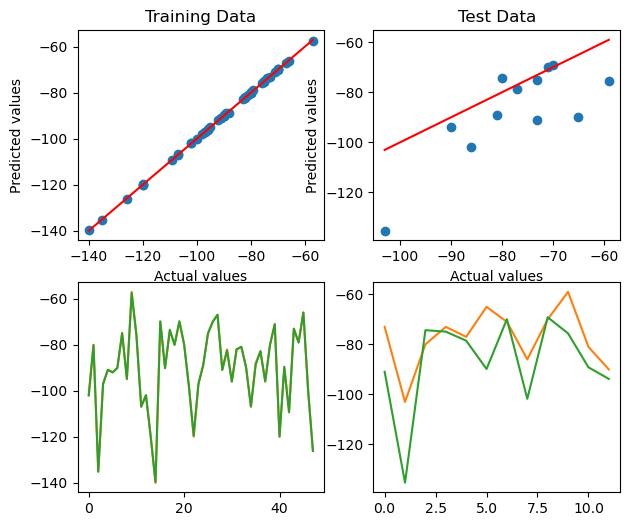

Epoch 650, Training Loss: 0.0002
Train R²:  0.99985   Train MPE:  29.18 %
Test R² :  -0.71187   Test MPE :  143.21 %


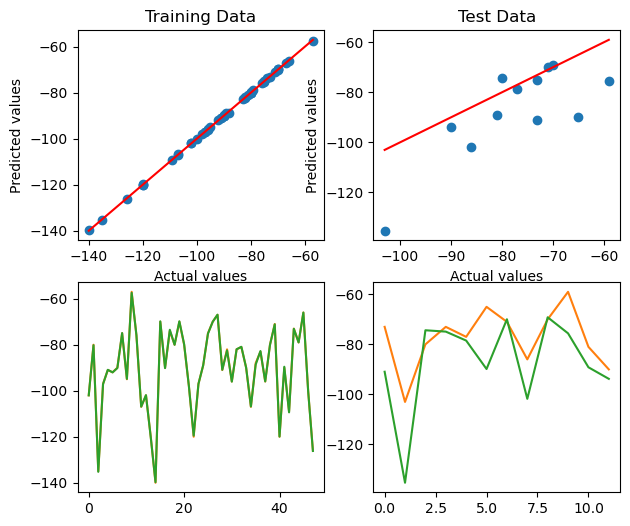

Epoch 700, Training Loss: 0.0001
Train R²:  0.99986   Train MPE:  27.64 %
Test R² :  -0.71153   Test MPE :  143.06 %


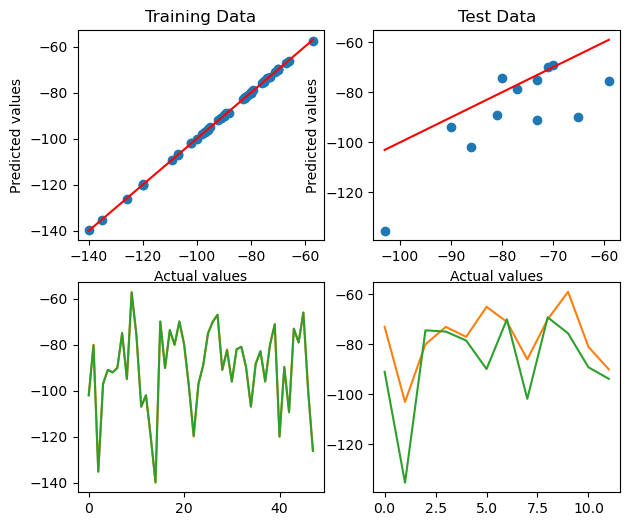

Epoch 750, Training Loss: 0.0001
Train R²:  0.99988   Train MPE:  26.40 %
Test R² :  -0.71092   Test MPE :  142.87 %


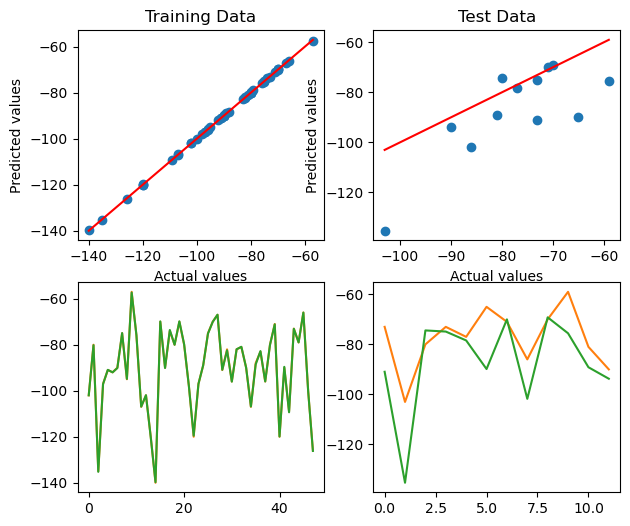

Epoch 800, Training Loss: 0.0001
Train R²:  0.99989   Train MPE:  25.39 %
Test R² :  -0.71051   Test MPE :  142.72 %


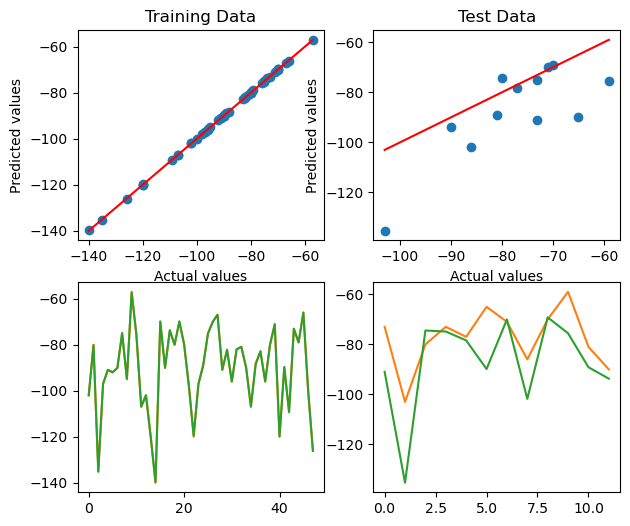

Epoch 850, Training Loss: 0.0001
Train R²:  0.99989   Train MPE:  24.42 %
Test R² :  -0.71018   Test MPE :  142.59 %


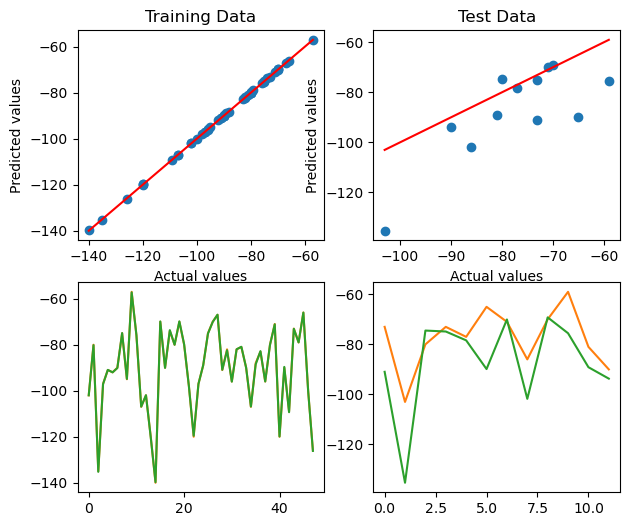

Epoch 900, Training Loss: 0.0001
Train R²:  0.99990   Train MPE:  23.50 %
Test R² :  -0.70997   Test MPE :  142.45 %


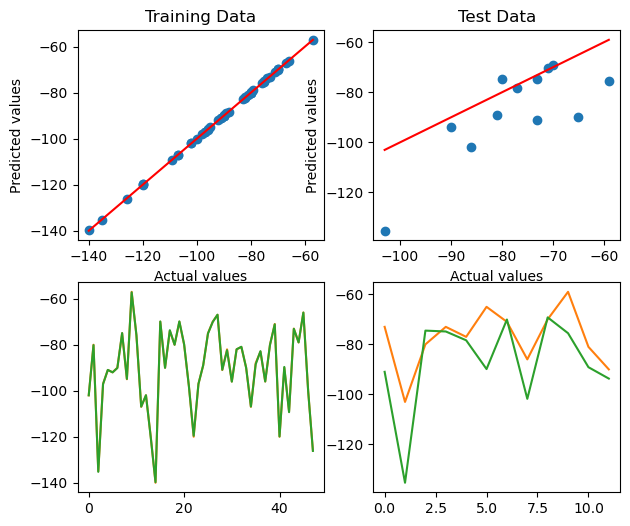

Epoch 950, Training Loss: 0.0001
Train R²:  0.99991   Train MPE:  22.71 %
Test R² :  -0.70984   Test MPE :  142.32 %


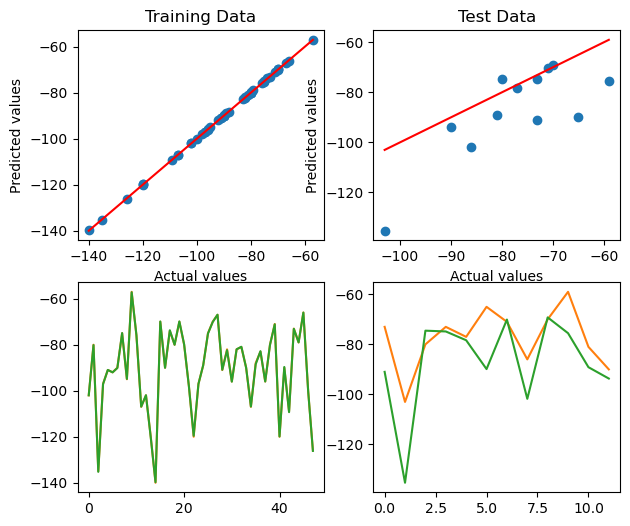

Epoch 1000, Training Loss: 0.0001
Train R²:  0.99991   Train MPE:  21.65 %
Test R² :  -0.70984   Test MPE :  142.19 %


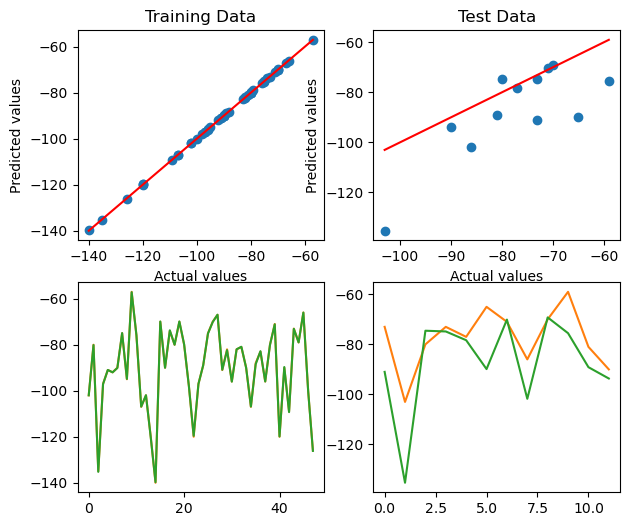

In [64]:
X = pd.read_excel(root,usecols=[3,4])
y = pd.read_excel(root,usecols=[6])

# Normalize inputs
scaler_X = StandardScaler()
X_scaled = scaler_X.fit_transform(X)

scaler_y = StandardScaler()
y_scaled = scaler_y.fit_transform(y)

# Use scaled data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=10)

# Convert y to float and flatten
y_train = np.array(y_train, dtype=np.float32).ravel()
y_test = np.array(y_test, dtype=np.float32).ravel()

# Train the Gradient Boosting Regressor #70000, 0.001, 4
gbr = GradientBoostingRegressor(n_estimators= 50000, learning_rate= 0.001, max_depth= 4, random_state=42, tol=1e-5)
gbr.fit(X_train, y_train)

# Get GBR predictions
gbr_train_pred = gbr.predict(X_train)
gbr_test_pred = gbr.predict(X_test)

# X_train_gbr = scaler_y.inverse_transform(gbr_train_pred.reshape(-1, 1))
# print(X_train_gbr)

# Augment inputs
X_train_nn = np.hstack([X_train, gbr_train_pred.reshape(-1, 1)])
X_test_nn = np.hstack([X_test, gbr_test_pred.reshape(-1, 1)])

# Convert to tensors
X_train = torch.tensor(X_train_nn, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
X_test = torch.tensor(X_test_nn, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)

# Neural network class
class DeepNN(nn.Module):
    def __init__(self, input_size=3, hidden_size= 32, output_size=1):
        super(DeepNN, self).__init__()
        # self.fc1 = nn.Linear(input_size, hidden_size)
        # self.activation = nn.ReLU()
        # self.out = nn.Linear(hidden_size, output_size)
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.fc4 = nn.Linear(hidden_size, hidden_size)
        self.fc5 = nn.Linear(hidden_size, hidden_size)
        self.fc6 = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # x = self.activation(self.fc1(x))
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        x = torch.relu(self.fc4(x))
        x = torch.relu(self.fc5(x))
        x = self.fc6(x)
        return x

# Model, loss, optimizer
model = DeepNN()
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

# Training loop
num_epochs = 1000
for epoch in range(num_epochs):
    model.train()
    y_train_pred = model(X_train)
    loss = criterion(y_train_pred, y_train)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if (epoch + 1) % 50 == 0:
        model.eval()
        y_test_pred = model(X_test)
        train_r2 = r2_score(y_train.detach().numpy(), y_train_pred.detach().numpy())
        train_mpe = mean_absolute_percentage_error(y_train.detach().numpy(), y_train_pred.detach().numpy())
        
        test_r2 = r2_score(y_test.detach().numpy(), y_test_pred.detach().numpy())
        test_mpe = mean_absolute_percentage_error(y_test.detach().numpy(), y_test_pred.detach().numpy())
       
        print(f"Epoch {epoch+1}, Training Loss: {loss.item():.4f}")
        print("Train R²: ", "%.5f" % round(train_r2, 5), "  Train MPE: ", "%.2f" % round(train_mpe * 100, 2),"%")
        print("Test R² : ", "%.5f" % round(test_r2, 5), "  Test MPE : ", "%.2f" % round(test_mpe * 100, 2),"%")
        
        y_train2 = scaler_y.inverse_transform(y_train.detach().numpy())
        y_train_pred2 = scaler_y.inverse_transform(y_train_pred.detach().numpy())
        y_test2 = scaler_y.inverse_transform(y_test.detach().numpy())
        y_test_pred2 = scaler_y.inverse_transform(y_test_pred.detach().numpy())

        fig, axes = plt.subplots(2, 2, figsize = (7, 6))
        axes[0, 0].scatter(y_train2, y_train_pred2)
        axes[0, 0].plot([min(y_train2), max(y_train2)],[min(y_train2), max(y_train2)], color = 'r')
        axes[0, 0].set_title("Training Data")
        axes[0, 0].set_xlabel("Actual values")
        axes[0, 0].set_ylabel("Predicted values")

        axes[0, 1].scatter(y_test2, y_test_pred2)
        axes[0, 1].plot([min(y_test2), max(y_test2)],[min(y_test2), max(y_test2)], color = 'r')
        axes[0, 1].set_title("Test Data")
        axes[0, 1].set_xlabel("Actual values")
        axes[0, 1].set_ylabel("Predicted values")

        axes[1, 0].plot(y_train2,'tab:orange', label = 'real')
        axes[1, 0].plot(y_train_pred2,'tab:green',label = 'pred')

        axes[1, 1].plot(y_test2, 'tab:orange',label = 'real')
        axes[1, 1].plot(y_test_pred2,'tab:green',label = 'pred')

        plt.draw();plt.pause(0.05)
    
    plt.ioff()
    plt.show()

## Pure DNN

In [74]:
def Pure_DNN(variable):
    X = pd.read_excel(root,usecols=[0,1,2,3,4])
    y = pd.read_excel(root,usecols=[variable])
    
    # Normalize inputs
    scaler_X = StandardScaler()
    X_scaled = scaler_X.fit_transform(X)
    
    scaler_y = StandardScaler()
    y_scaled = scaler_y.fit_transform(y)
    
    # Use scaled data
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=10)
    
    # Convert y to float and flatten
    y_train = np.array(y_train, dtype=np.float32).ravel()
    y_test = np.array(y_test, dtype=np.float32).ravel()
    
    # Convert to tensors
    X_train = torch.tensor(X_train, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
    X_test = torch.tensor(X_test, dtype=torch.float32)
    y_test = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)
    
    # Neural network class
    class DeepNN(nn.Module):
        def __init__(self, input_size=5, hidden_size= 32, output_size=1):
            super(DeepNN, self).__init__()
            # self.fc1 = nn.Linear(input_size, hidden_size)
            # self.activation = nn.ReLU()
            # self.out = nn.Linear(hidden_size, output_size)
            self.fc1 = nn.Linear(input_size, hidden_size)
            self.fc2 = nn.Linear(hidden_size, hidden_size)
            self.fc3 = nn.Linear(hidden_size, hidden_size)
            self.fc4 = nn.Linear(hidden_size, hidden_size)
            self.fc5 = nn.Linear(hidden_size, hidden_size)
            self.fc6 = nn.Linear(hidden_size, output_size)
    
        def forward(self, x):
            # x = self.activation(self.fc1(x))
            x = torch.relu(self.fc1(x))
            x = torch.relu(self.fc2(x))
            x = torch.relu(self.fc3(x))
            x = torch.relu(self.fc4(x))
            x = torch.relu(self.fc5(x))
            x = self.fc6(x)
            return x
    
    # Model, loss, optimizer
    model = DeepNN()
    criterion = nn.MSELoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
    
    # Training loop
    num_epochs = 1000
    for epoch in range(num_epochs):
        model.train()
        y_train_pred = model(X_train)
        loss = criterion(y_train_pred, y_train)
    
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
        if (epoch + 1) % 50 == 0:
            model.eval()
            y_test_pred = model(X_test)

            train_r2 = r2_score(y_train.detach().numpy(), y_train_pred.detach().numpy())
            train_mpe = mean_absolute_percentage_error(y_train.detach().numpy(), y_train_pred.detach().numpy())
            
            test_r2 = r2_score(y_test.detach().numpy(), y_test_pred.detach().numpy())
            test_mpe = mean_absolute_percentage_error(y_test.detach().numpy(), y_test_pred.detach().numpy())
           
            print(f"Epoch {epoch+1}, Training Loss: {loss.item():.4f}")
            print("Train R²: ", "%.5f" % round(train_r2, 5), "  Train MPE: ", "%.2f" % round(train_mpe * 100, 2),"%")
            print("Test R² : ", "%.5f" % round(test_r2, 5), "  Test MPE : ", "%.2f" % round(test_mpe * 100, 2),"%")
    
            y_train2 = scaler_y.inverse_transform(y_train.detach().numpy())
            y_train_pred2 = scaler_y.inverse_transform(y_train_pred.detach().numpy())
            y_test2 = scaler_y.inverse_transform(y_test.detach().numpy())
            y_test_pred2 = scaler_y.inverse_transform(y_test_pred.detach().numpy())
    
            fig, axes = plt.subplots(2, 2, figsize = (7, 6))
            axes[0, 0].scatter(y_train2, y_train_pred2)
            axes[0, 0].plot([min(y_train2), max(y_train2)],[min(y_train2), max(y_train2)], color = 'r')
            axes[0, 0].set_title("Training Data")
            axes[0, 0].set_xlabel("Actual values")
            axes[0, 0].set_ylabel("Predicted values")
            
            axes[0, 1].scatter(y_test2, y_test_pred2)
            axes[0, 1].plot([min(y_test2), max(y_test2)],[min(y_test2), max(y_test2)], color = 'r')
            axes[0, 1].set_title("Test Data")
            axes[0, 1].set_xlabel("Actual values")
            axes[0, 1].set_ylabel("Predicted values")
    
            axes[1, 0].plot(y_train2,'tab:orange', label = 'real')
            axes[1, 0].plot(y_train_pred2,'tab:green',label = 'pred')
    
            axes[1, 1].plot(y_test2,'tab:orange',label = 'real')
            axes[1, 1].plot(y_test_pred2,'tab:green',label = 'pred')
    
            plt.draw();plt.pause(0.05)
        
        plt.ioff()
        plt.show()

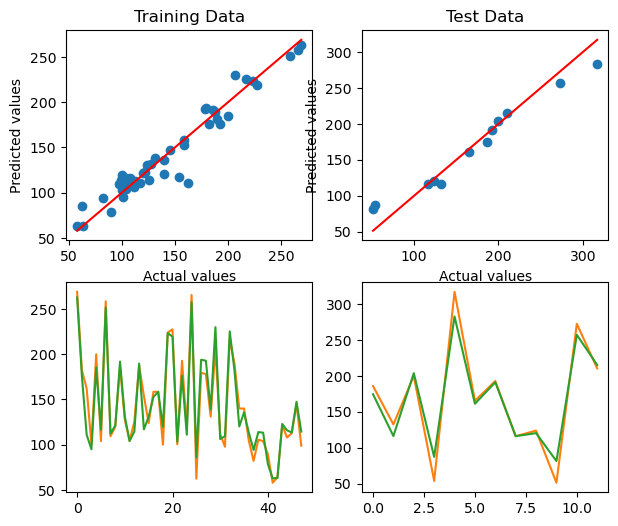

Epoch 50, Training Loss: 0.5911
Train R²:  0.26300   Train MPE:  87.95 %
Test R² :  0.18909   Test MPE :  75.74 %


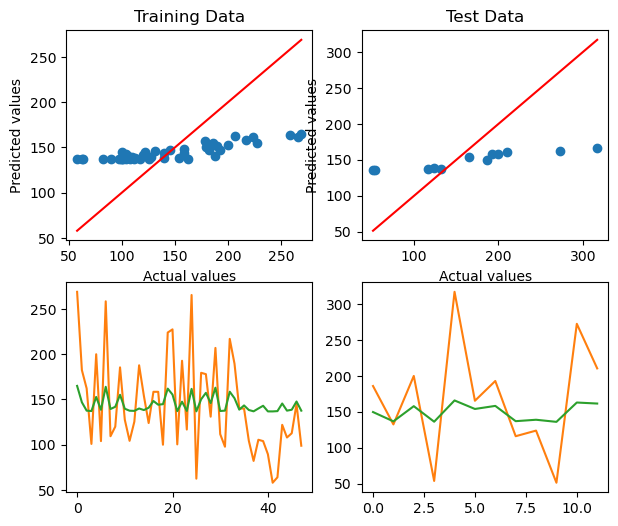

Epoch 100, Training Loss: 0.1138
Train R²:  0.85815   Train MPE:  67.71 %
Test R² :  0.90129   Test MPE :  36.18 %


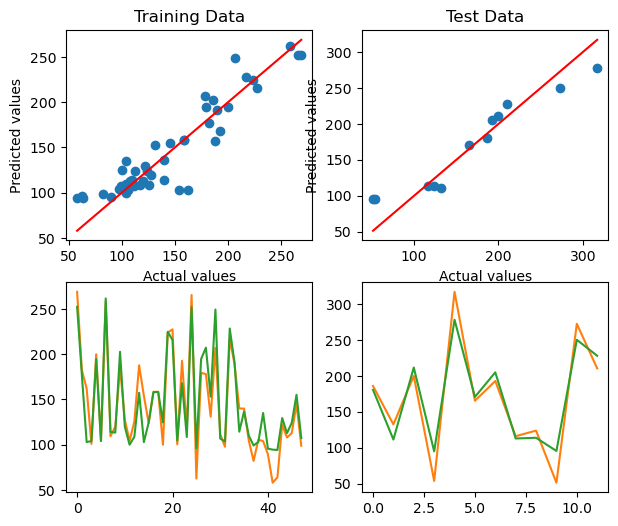

Epoch 150, Training Loss: 0.0791
Train R²:  0.90132   Train MPE:  58.07 %
Test R² :  0.92832   Test MPE :  32.43 %


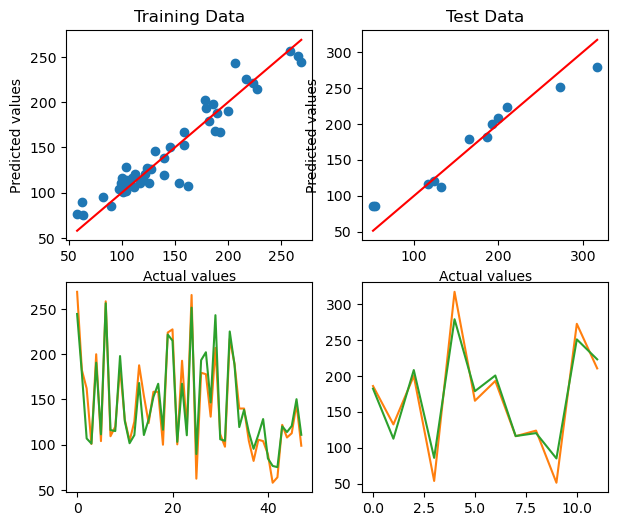

Epoch 200, Training Loss: 0.0651
Train R²:  0.91885   Train MPE:  52.26 %
Test R² :  0.94177   Test MPE :  31.43 %


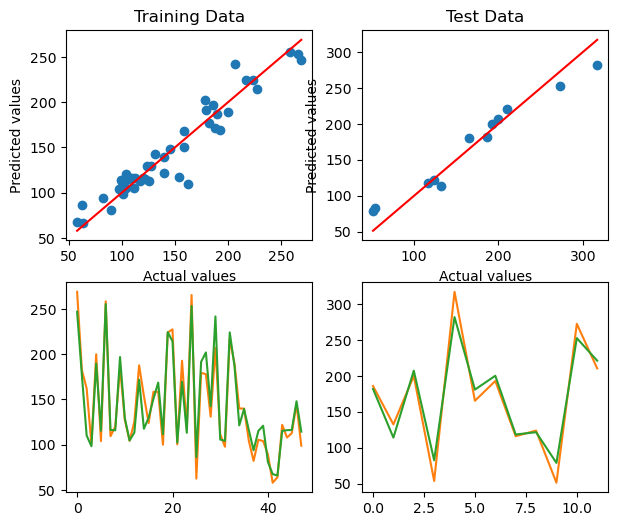

Epoch 250, Training Loss: 0.0564
Train R²:  0.92967   Train MPE:  46.41 %
Test R² :  0.94770   Test MPE :  31.78 %


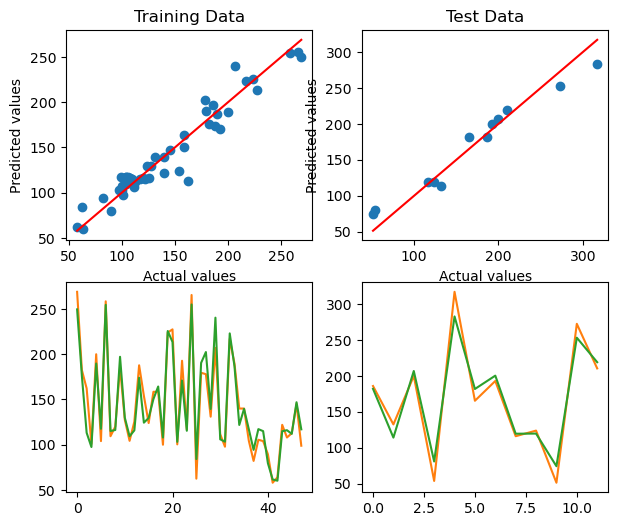

Epoch 300, Training Loss: 0.0496
Train R²:  0.93820   Train MPE:  41.42 %
Test R² :  0.95361   Test MPE :  31.88 %


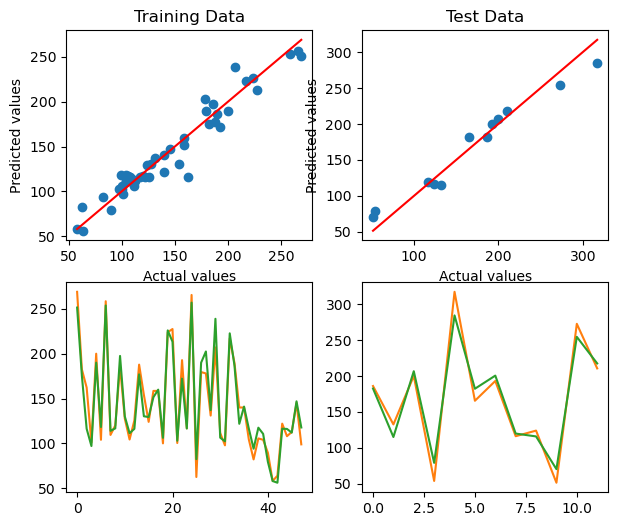

Epoch 350, Training Loss: 0.0428
Train R²:  0.94667   Train MPE:  37.75 %
Test R² :  0.96007   Test MPE :  31.90 %


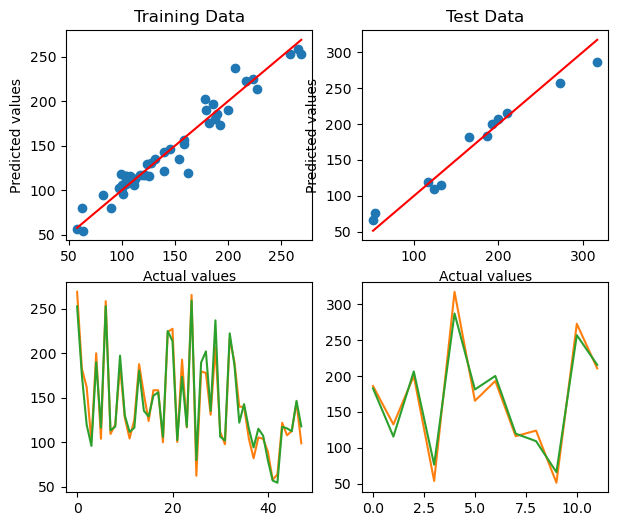

Epoch 400, Training Loss: 0.0364
Train R²:  0.95458   Train MPE:  34.16 %
Test R² :  0.96580   Test MPE :  32.02 %


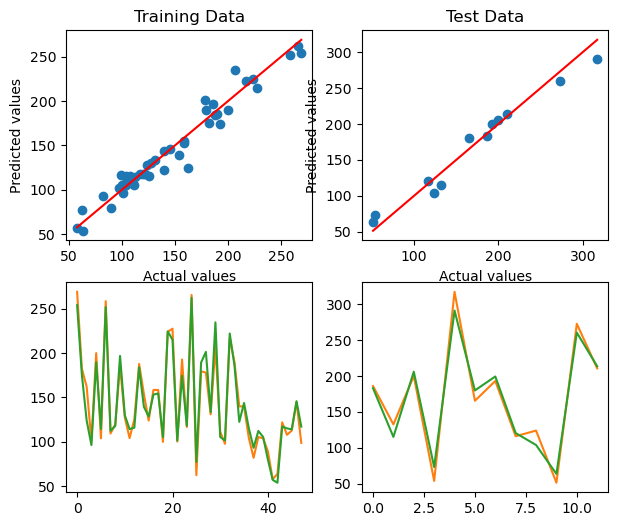

Epoch 450, Training Loss: 0.0300
Train R²:  0.96254   Train MPE:  29.77 %
Test R² :  0.96862   Test MPE :  31.74 %


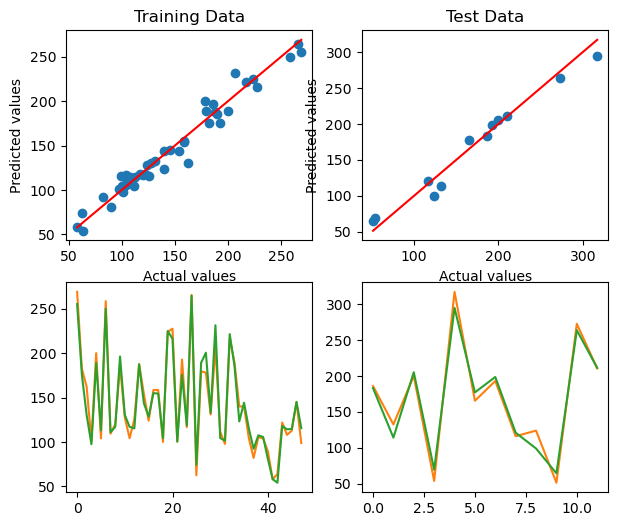

Epoch 500, Training Loss: 0.0248
Train R²:  0.96907   Train MPE:  25.70 %
Test R² :  0.96991   Test MPE :  32.09 %


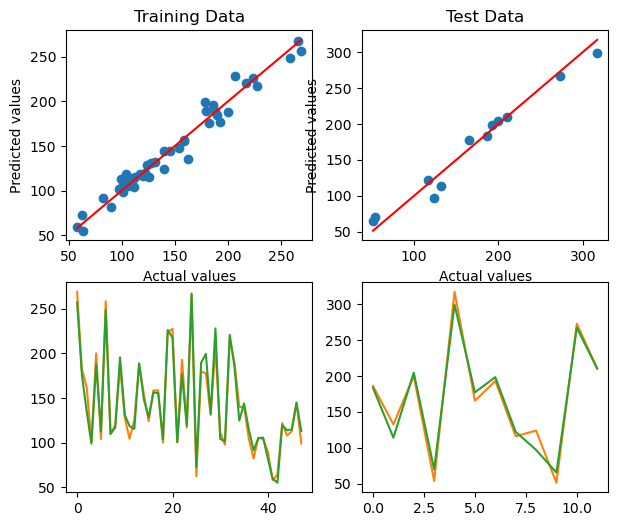

Epoch 550, Training Loss: 0.0204
Train R²:  0.97458   Train MPE:  22.17 %
Test R² :  0.97086   Test MPE :  32.31 %


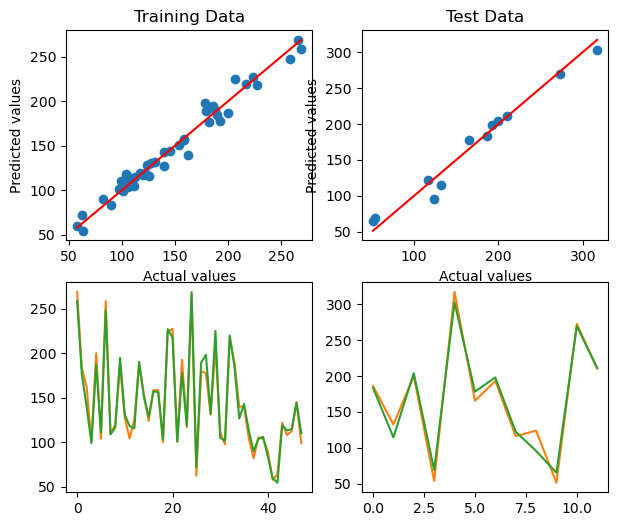

Epoch 600, Training Loss: 0.0166
Train R²:  0.97933   Train MPE:  19.05 %
Test R² :  0.97298   Test MPE :  31.46 %


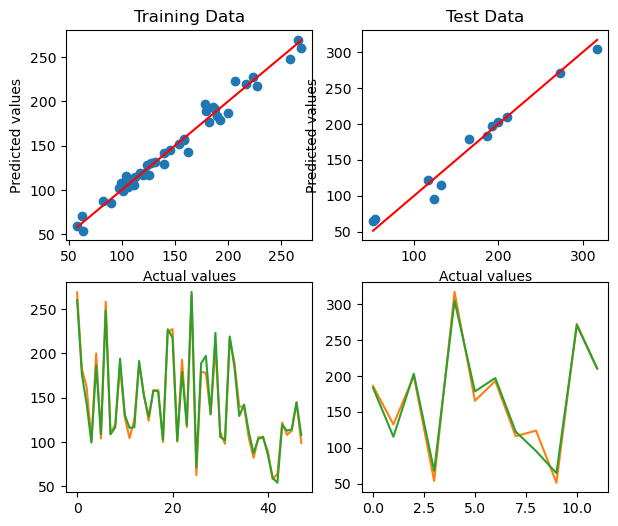

Epoch 650, Training Loss: 0.0133
Train R²:  0.98337   Train MPE:  16.37 %
Test R² :  0.97427   Test MPE :  30.68 %


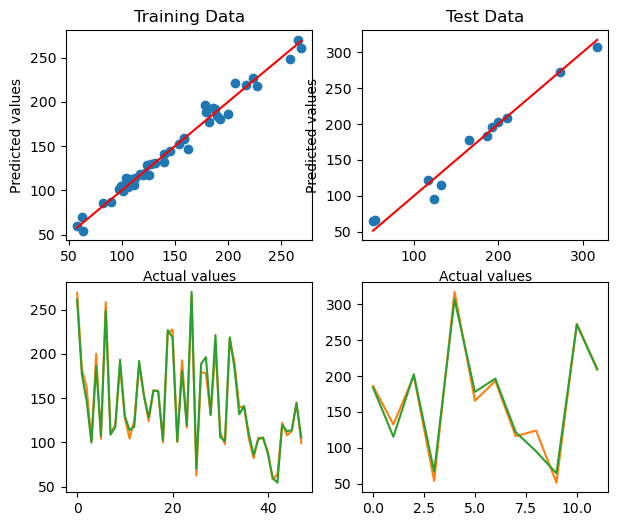

Epoch 700, Training Loss: 0.0106
Train R²:  0.98675   Train MPE:  13.96 %
Test R² :  0.97559   Test MPE :  29.65 %


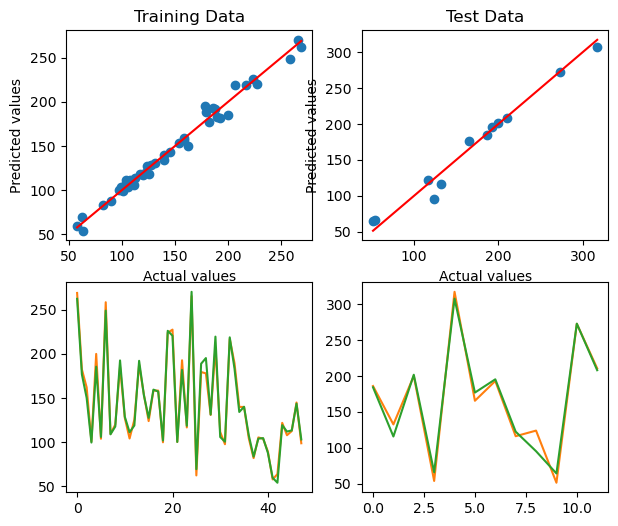

Epoch 750, Training Loss: 0.0085
Train R²:  0.98937   Train MPE:  12.17 %
Test R² :  0.97634   Test MPE :  28.71 %


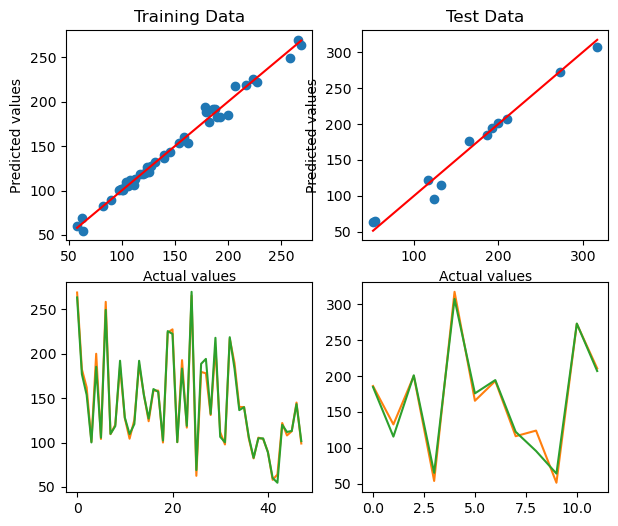

Epoch 800, Training Loss: 0.0070
Train R²:  0.99124   Train MPE:  10.62 %
Test R² :  0.97713   Test MPE :  27.59 %


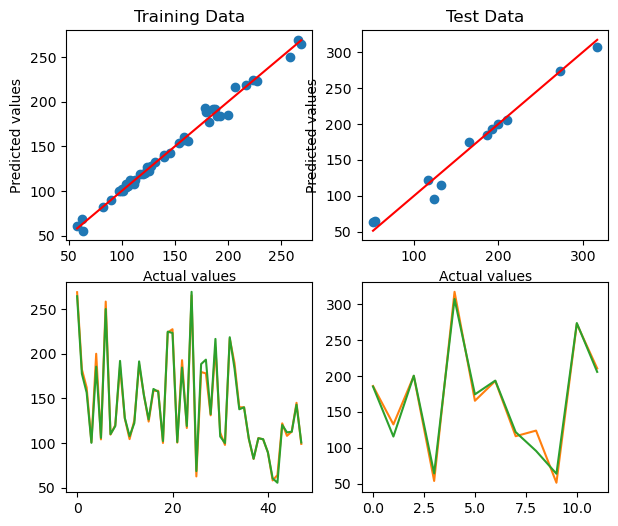

Epoch 850, Training Loss: 0.0059
Train R²:  0.99269   Train MPE:  9.19 %
Test R² :  0.97732   Test MPE :  26.39 %


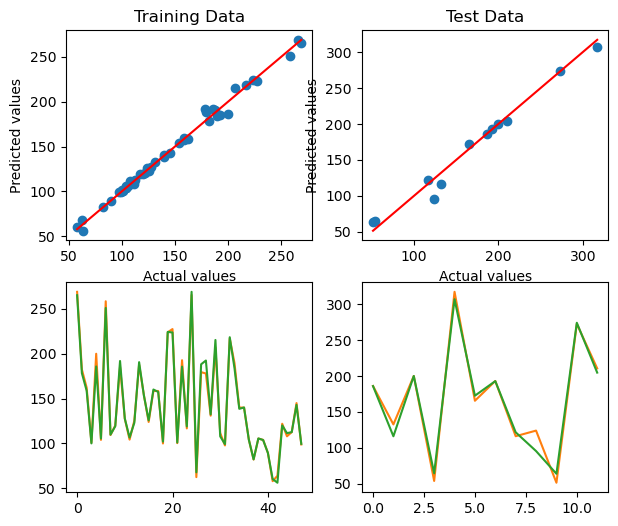

Epoch 900, Training Loss: 0.0048
Train R²:  0.99395   Train MPE:  7.92 %
Test R² :  0.97744   Test MPE :  25.73 %


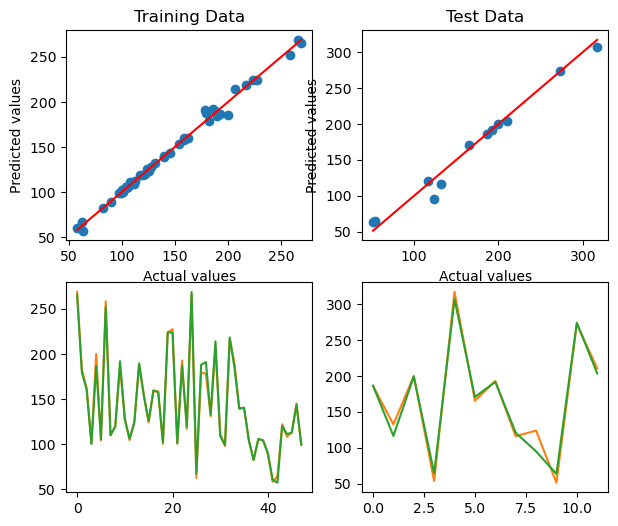

Epoch 950, Training Loss: 0.0040
Train R²:  0.99504   Train MPE:  6.97 %
Test R² :  0.97765   Test MPE :  25.09 %


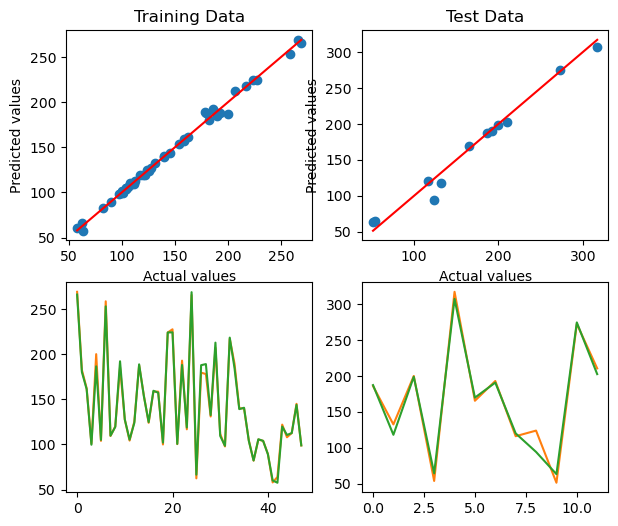

Epoch 1000, Training Loss: 0.0032
Train R²:  0.99596   Train MPE:  5.94 %
Test R² :  0.97772   Test MPE :  24.27 %


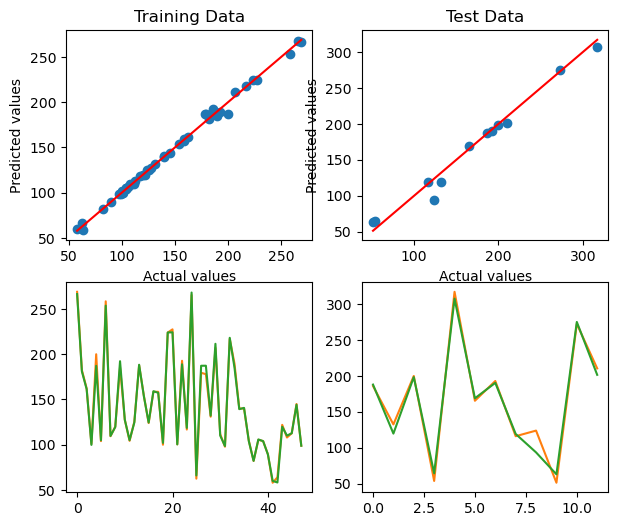

In [75]:
Pure_DNN(5)

Epoch 50, Training Loss: 1.0320
Train R²:  0.00616   Train MPE:  203.59 %
Test R² :  -1.34827   Test MPE :  117.14 %


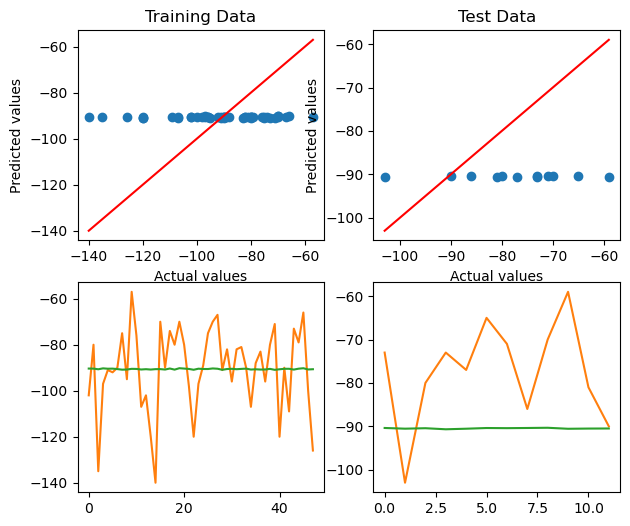

Epoch 100, Training Loss: 0.9743
Train R²:  0.06169   Train MPE:  222.38 %
Test R² :  -1.12590   Test MPE :  111.09 %


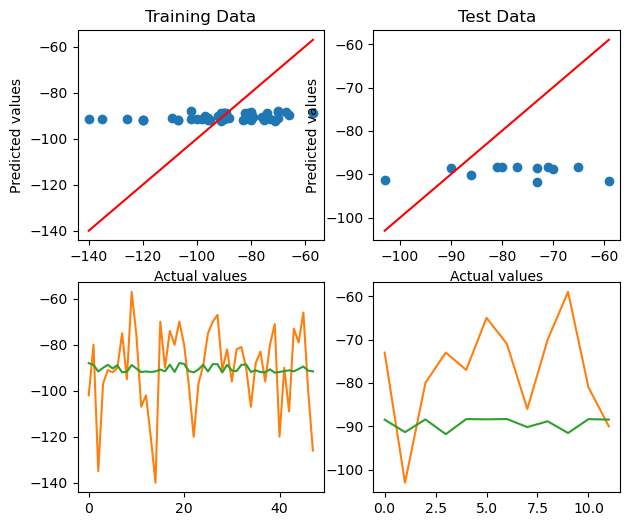

Epoch 150, Training Loss: 0.7335
Train R²:  0.29356   Train MPE:  208.51 %
Test R² :  -0.93732   Test MPE :  108.92 %


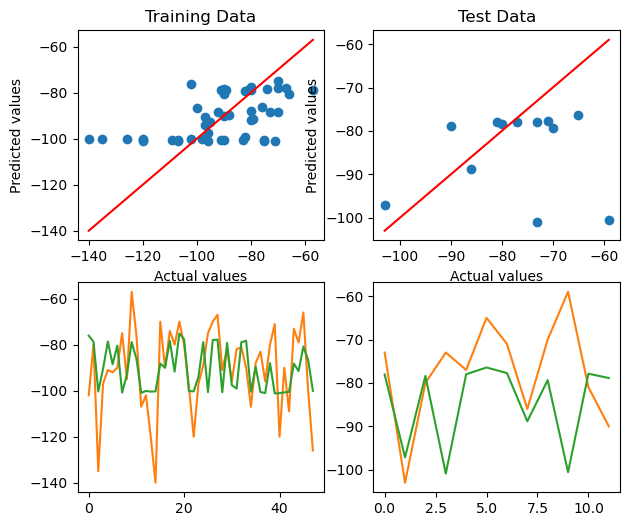

Epoch 200, Training Loss: 0.6372
Train R²:  0.38636   Train MPE:  328.00 %
Test R² :  -1.02978   Test MPE :  81.81 %


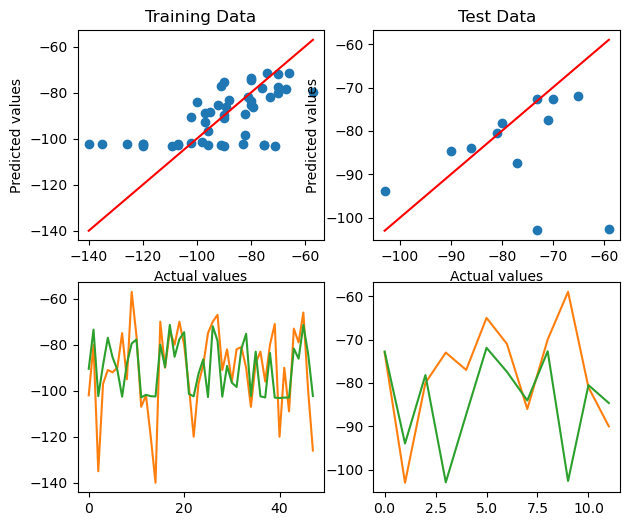

Epoch 250, Training Loss: 0.5973
Train R²:  0.42480   Train MPE:  295.05 %
Test R² :  -1.15123   Test MPE :  84.66 %


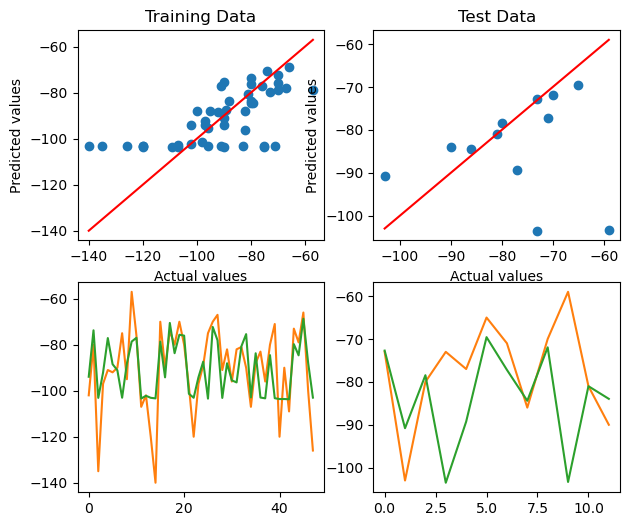

Epoch 300, Training Loss: 0.5672
Train R²:  0.45378   Train MPE:  218.12 %
Test R² :  -1.27416   Test MPE :  89.24 %


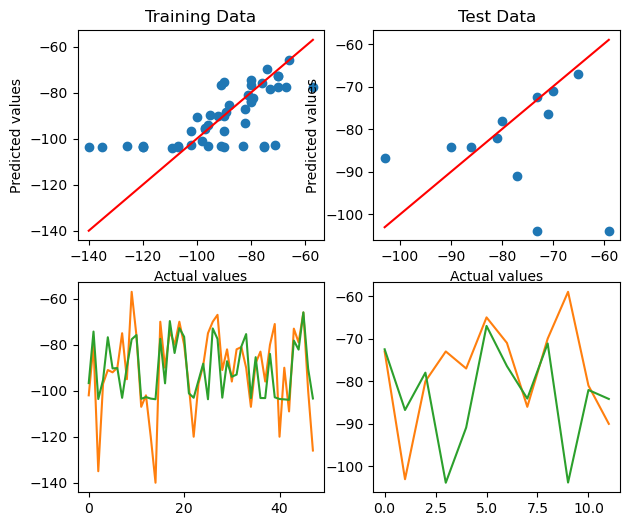

Epoch 350, Training Loss: 0.5404
Train R²:  0.47954   Train MPE:  159.43 %
Test R² :  -1.41142   Test MPE :  91.83 %


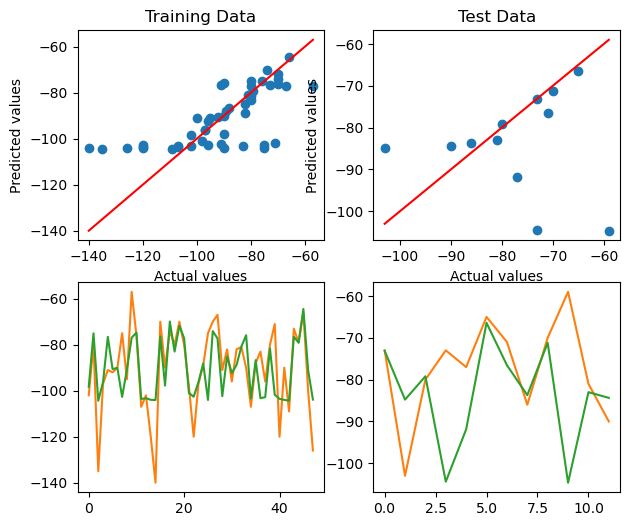

Epoch 400, Training Loss: 0.4909
Train R²:  0.52728   Train MPE:  105.38 %
Test R² :  -1.70961   Test MPE :  97.07 %


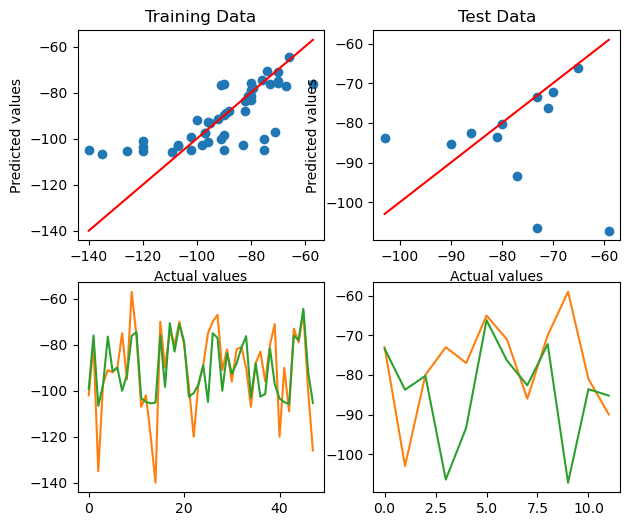

Epoch 450, Training Loss: 0.3318
Train R²:  0.68046   Train MPE:  134.37 %
Test R² :  -2.57857   Test MPE :  112.46 %


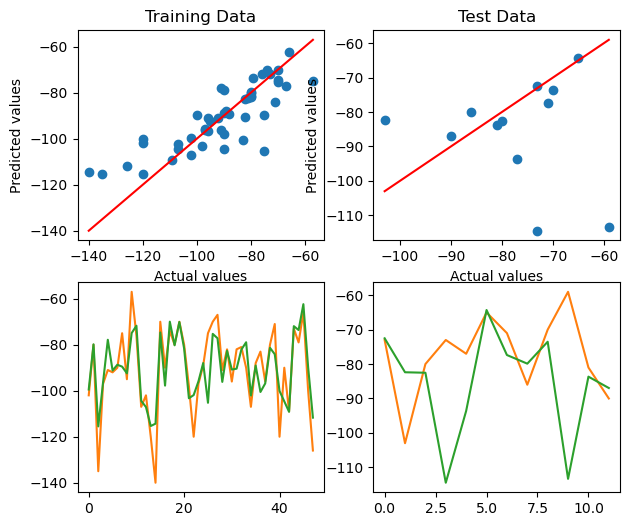

Epoch 500, Training Loss: 0.1549
Train R²:  0.85083   Train MPE:  163.55 %
Test R² :  -5.00883   Test MPE :  120.19 %


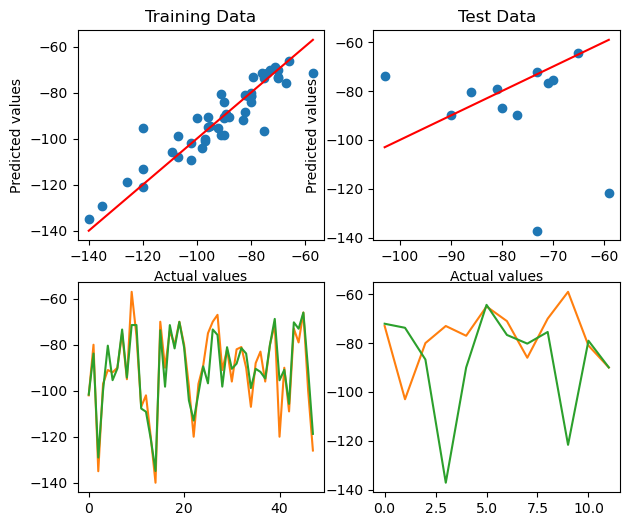

Epoch 550, Training Loss: 0.1122
Train R²:  0.89196   Train MPE:  209.23 %
Test R² :  -4.70384   Test MPE :  96.08 %


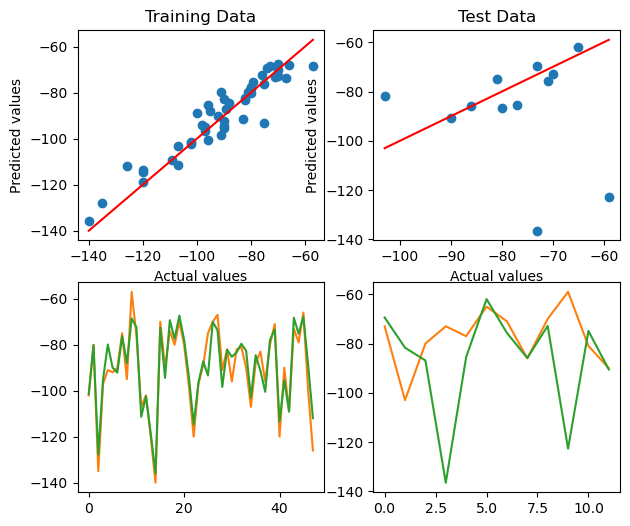

Epoch 600, Training Loss: 0.0903
Train R²:  0.91308   Train MPE:  120.67 %
Test R² :  -5.45768   Test MPE :  104.88 %


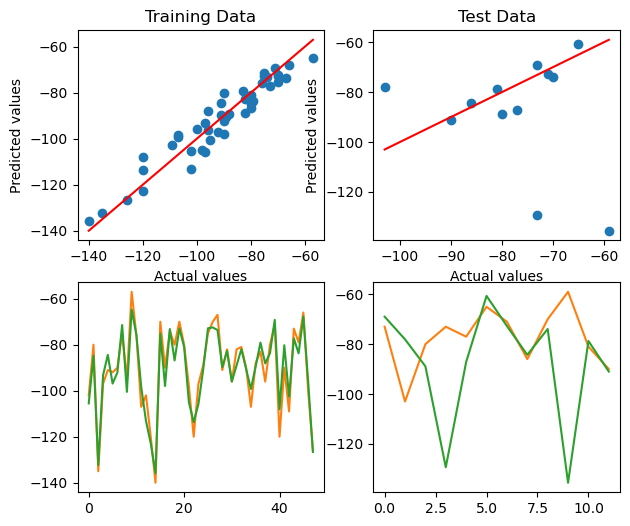

Epoch 650, Training Loss: 0.0209
Train R²:  0.97985   Train MPE:  45.11 %
Test R² :  -5.39049   Test MPE :  114.78 %


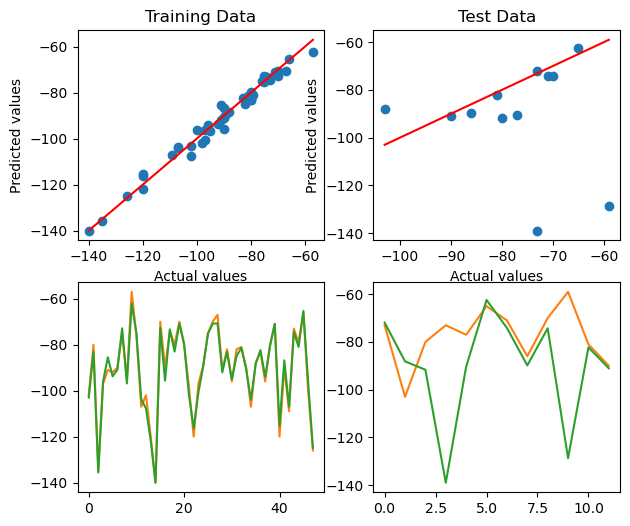

Epoch 700, Training Loss: 0.0027
Train R²:  0.99742   Train MPE:  31.94 %
Test R² :  -5.25875   Test MPE :  134.66 %


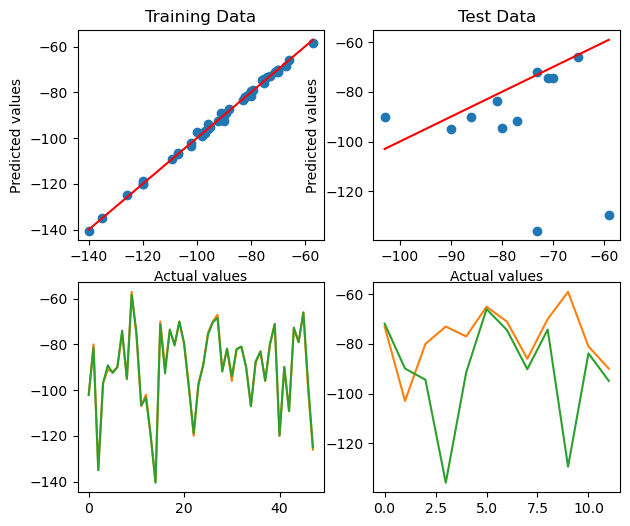

Epoch 750, Training Loss: 0.0016
Train R²:  0.99843   Train MPE:  46.65 %
Test R² :  -5.37435   Test MPE :  150.41 %


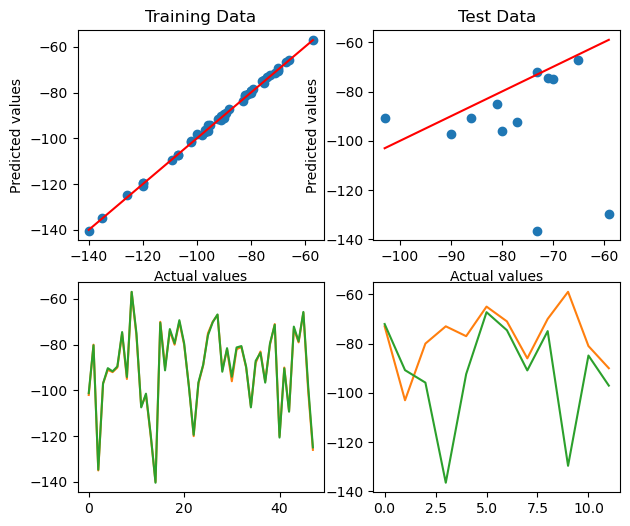

Epoch 800, Training Loss: 0.0008
Train R²:  0.99921   Train MPE:  14.09 %
Test R² :  -5.27490   Test MPE :  143.21 %


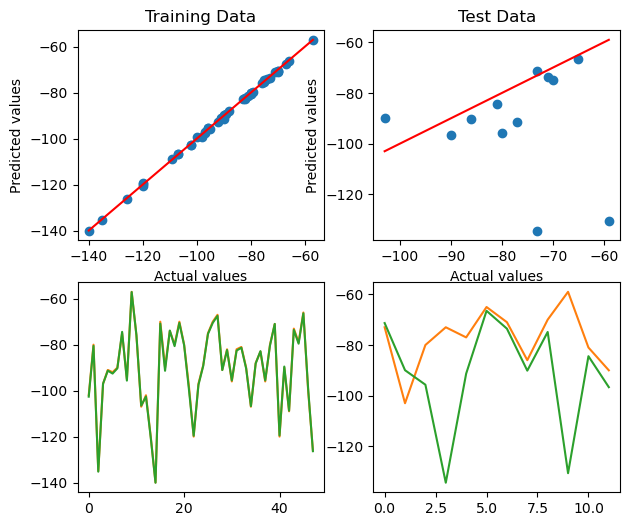

Epoch 850, Training Loss: 0.0002
Train R²:  0.99980   Train MPE:  8.70 %
Test R² :  -5.26175   Test MPE :  145.81 %


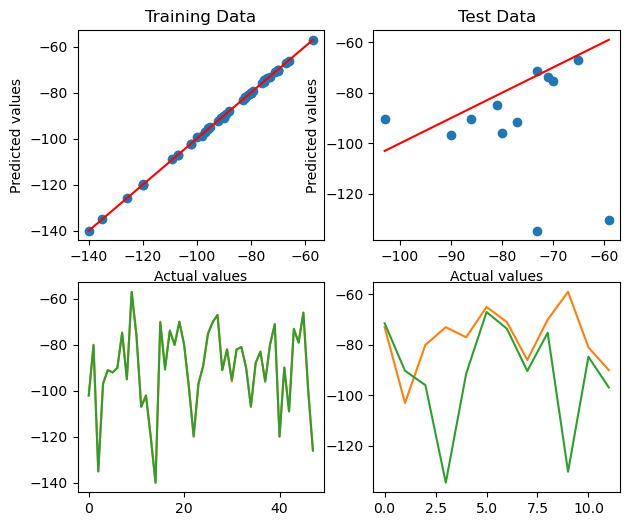

Epoch 900, Training Loss: 0.0001
Train R²:  0.99990   Train MPE:  7.87 %
Test R² :  -5.35134   Test MPE :  152.09 %


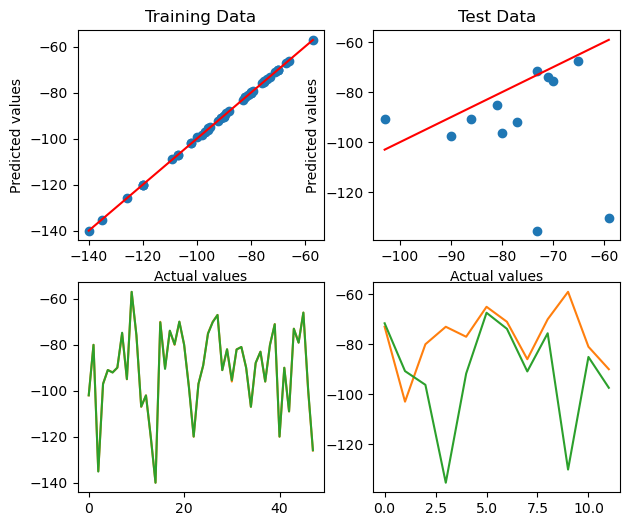

Epoch 950, Training Loss: 0.0001
Train R²:  0.99994   Train MPE:  7.34 %
Test R² :  -5.33148   Test MPE :  152.28 %


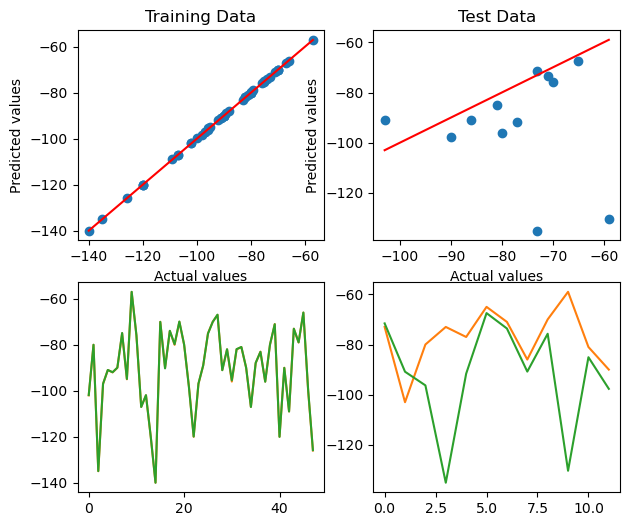

Epoch 1000, Training Loss: 0.0002
Train R²:  0.99984   Train MPE:  14.00 %
Test R² :  -5.35446   Test MPE :  153.38 %


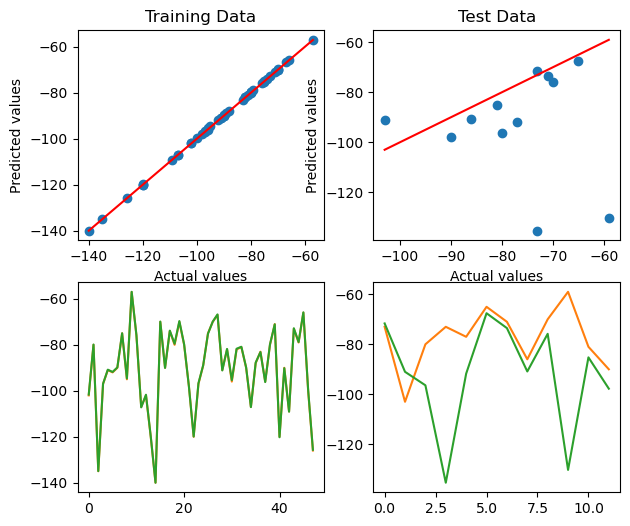

In [76]:
Pure_DNN(6)

In [8]:
X = pd.read_excel(root,usecols=[0,1,2,3,4])
y = pd.read_excel(root,usecols=[6])

# Normalize inputs
scaler_X = StandardScaler()
X_scaled = scaler_X.fit_transform(X)

scaler_y = StandardScaler()
y_scaled = scaler_y.fit_transform(y)

# Use scaled data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=10)

# Convert y to float and flatten
y_train = np.array(y_train, dtype=np.float32).ravel()
y_test = np.array(y_test, dtype=np.float32).ravel()

a1, a2, a3 = GBR_HYP(X_train, X_test, y_train, y_test)

GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  2
Subsample =  0.8 Min_samples_split =  2
Train R²:  0.99802
Test R² :  0.05737
GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  2
Subsample =  0.8 Min_samples_split =  5
Train R²:  0.99755
Test R² :  -0.02224
GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  2
Subsample =  1.0 Min_samples_split =  2
Train R²:  0.99798
Test R² :  0.05479
GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  2
Subsample =  1.0 Min_samples_split =  5
Train R²:  0.99656
Test R² :  -0.00542
GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  3
Subsample =  0.8 Min_samples_split =  2
Train R²:  0.99999
Test R² :  0.24516
GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  3
Subsample =  0.8 Min_samples_split =  5
Train R²:  0.99998
Test R² :  0.12082
GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  3
Subsample =  1.0 Min_samples_split =  2
Train R²:  1.00000
Te

In [77]:
def Pure_DNN2(variable):
    X = pd.read_excel(root,usecols=[3,4])
    y = pd.read_excel(root,usecols=[variable])
    
    # Normalize inputs
    scaler_X = StandardScaler()
    X_scaled = scaler_X.fit_transform(X)
    
    scaler_y = StandardScaler()
    y_scaled = scaler_y.fit_transform(y)
    
    # Use scaled data
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=10)
    
    # Convert y to float and flatten
    y_train = np.array(y_train, dtype=np.float32).ravel()
    y_test = np.array(y_test, dtype=np.float32).ravel()
    
    # Convert to tensors
    X_train = torch.tensor(X_train, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
    X_test = torch.tensor(X_test, dtype=torch.float32)
    y_test = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)
    
    # Neural network class
    class DeepNN(nn.Module):
        def __init__(self, input_size=2, hidden_size= 32, output_size=1):
            super(DeepNN, self).__init__()
            # self.fc1 = nn.Linear(input_size, hidden_size)
            # self.activation = nn.ReLU()
            # self.out = nn.Linear(hidden_size, output_size)
            self.fc1 = nn.Linear(input_size, hidden_size)
            self.fc2 = nn.Linear(hidden_size, hidden_size)
            self.fc3 = nn.Linear(hidden_size, hidden_size)
            self.fc4 = nn.Linear(hidden_size, hidden_size)
            self.fc5 = nn.Linear(hidden_size, hidden_size)
            self.fc6 = nn.Linear(hidden_size, output_size)
    
        def forward(self, x):
            # x = self.activation(self.fc1(x))
            x = torch.relu(self.fc1(x))
            x = torch.relu(self.fc2(x))
            x = torch.relu(self.fc3(x))
            x = torch.relu(self.fc4(x))
            x = torch.relu(self.fc5(x))
            x = self.fc6(x)
            return x
    
    # Model, loss, optimizer
    model = DeepNN()
    criterion = nn.MSELoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
    
    # Training loop
    num_epochs = 1000
    for epoch in range(num_epochs):
        model.train()
        y_train_pred = model(X_train)
        loss = criterion(y_train_pred, y_train)
    
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
        if (epoch + 1) % 50 == 0:
            model.eval()
            y_test_pred = model(X_test)

            train_r2 = r2_score(y_train.detach().numpy(), y_train_pred.detach().numpy())
            train_mpe = mean_absolute_percentage_error(y_train.detach().numpy(), y_train_pred.detach().numpy())
            
            test_r2 = r2_score(y_test.detach().numpy(), y_test_pred.detach().numpy())
            test_mpe = mean_absolute_percentage_error(y_test.detach().numpy(), y_test_pred.detach().numpy())
           
            print(f"Epoch {epoch+1}, Training Loss: {loss.item():.4f}")
            print("Train R²: ", "%.5f" % round(train_r2, 5), "  Train MPE: ", "%.2f" % round(train_mpe * 100, 2),"%")
            print("Test R² : ", "%.5f" % round(test_r2, 5), "  Test MPE : ", "%.2f" % round(test_mpe * 100, 2),"%")
    
            y_train2 = scaler_y.inverse_transform(y_train.detach().numpy())
            y_train_pred2 = scaler_y.inverse_transform(y_train_pred.detach().numpy())
            y_test2 = scaler_y.inverse_transform(y_test.detach().numpy())
            y_test_pred2 = scaler_y.inverse_transform(y_test_pred.detach().numpy())
    
            fig, axes = plt.subplots(2, 2, figsize = (7, 6))
            axes[0, 0].scatter(y_train2, y_train_pred2)
            axes[0, 0].plot([min(y_train2), max(y_train2)],[min(y_train2), max(y_train2)], color = 'r')
            axes[0, 0].set_title("Training Data")
            axes[0, 0].set_xlabel("Actual values")
            axes[0, 0].set_ylabel("Predicted values")
            
            axes[0, 1].scatter(y_test2, y_test_pred2)
            axes[0, 1].plot([min(y_test2), max(y_test2)],[min(y_test2), max(y_test2)], color = 'r')
            axes[0, 1].set_title("Test Data")
            axes[0, 1].set_xlabel("Actual values")
            axes[0, 1].set_ylabel("Predicted values")
    
            axes[1, 0].plot(y_train2,'tab:orange', label = 'real')
            axes[1, 0].plot(y_train_pred2,'tab:green',label = 'pred')
    
            axes[1, 1].plot(y_test2,'tab:orange',label = 'real')
            axes[1, 1].plot(y_test_pred2,'tab:green',label = 'pred')
    
            plt.draw();plt.pause(0.05)
        
        plt.ioff()
        plt.show()

Epoch 50, Training Loss: 0.2247
Train R²:  0.71982   Train MPE:  101.16 %
Test R² :  0.83205   Test MPE :  55.63 %


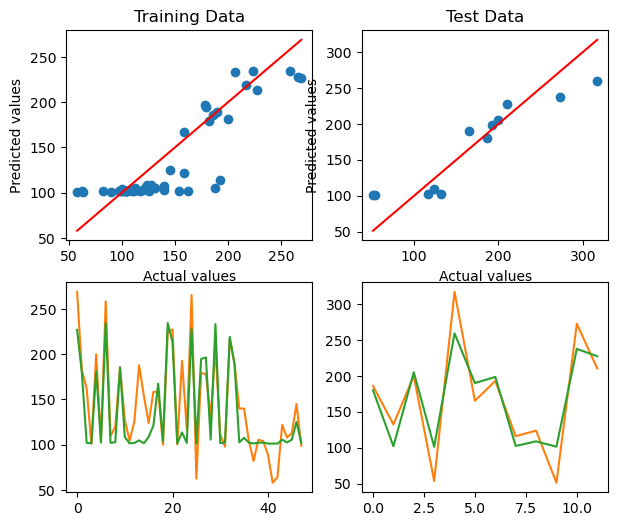

Epoch 100, Training Loss: 0.1283
Train R²:  0.83998   Train MPE:  73.04 %
Test R² :  0.87965   Test MPE :  45.58 %


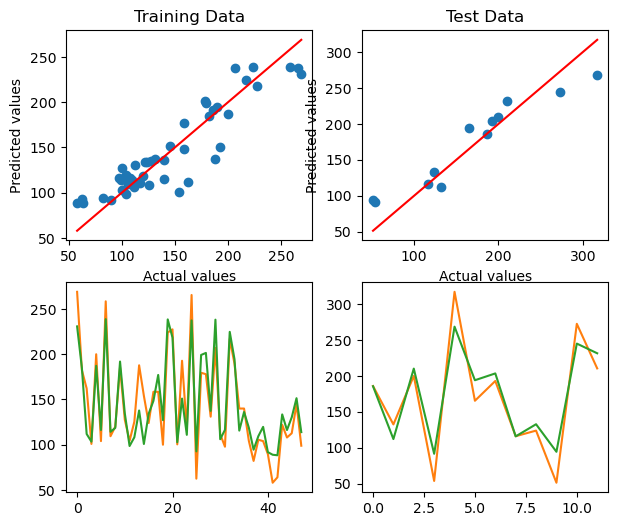

Epoch 150, Training Loss: 0.1109
Train R²:  0.86168   Train MPE:  71.62 %
Test R² :  0.91675   Test MPE :  41.27 %


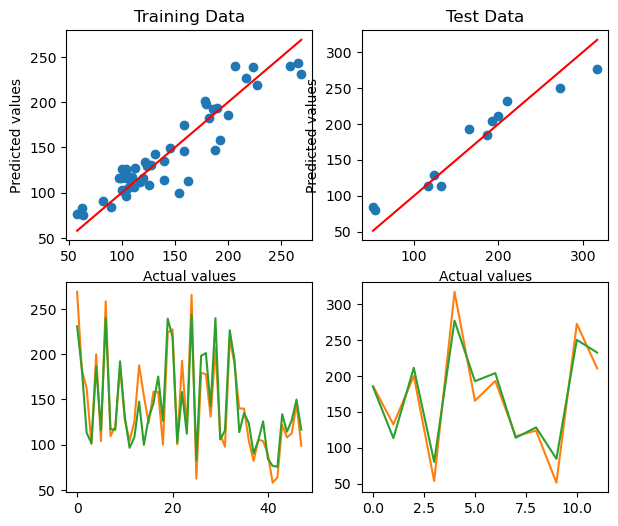

Epoch 200, Training Loss: 0.1045
Train R²:  0.86965   Train MPE:  69.27 %
Test R² :  0.93332   Test MPE :  37.74 %


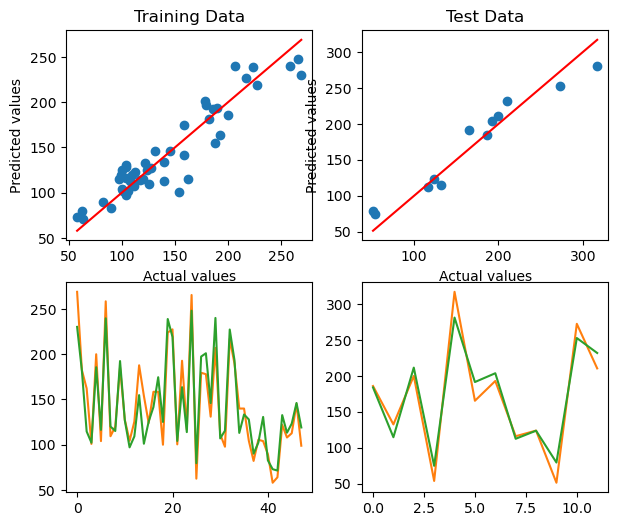

Epoch 250, Training Loss: 0.1015
Train R²:  0.87349   Train MPE:  68.57 %
Test R² :  0.94030   Test MPE :  37.47 %


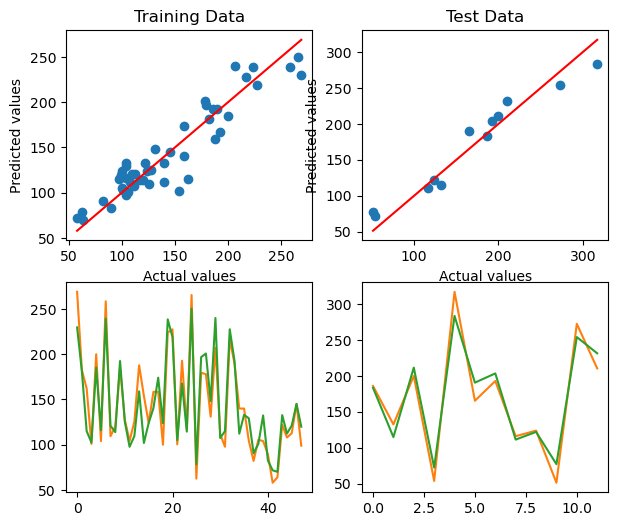

Epoch 300, Training Loss: 0.0993
Train R²:  0.87621   Train MPE:  68.45 %
Test R² :  0.94391   Test MPE :  37.32 %


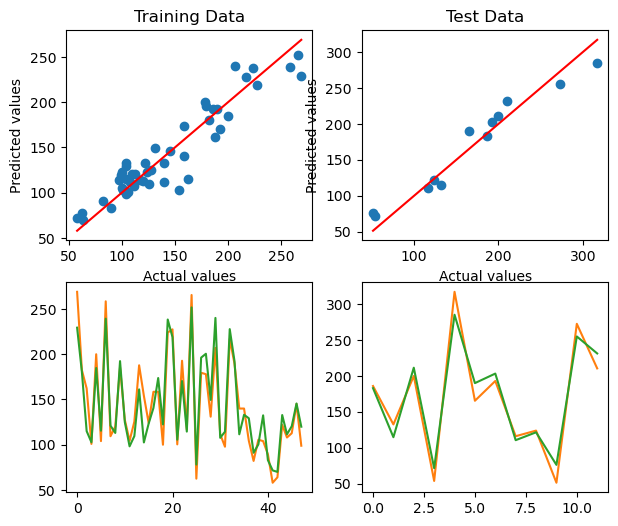

Epoch 350, Training Loss: 0.0973
Train R²:  0.87869   Train MPE:  68.33 %
Test R² :  0.94691   Test MPE :  37.11 %


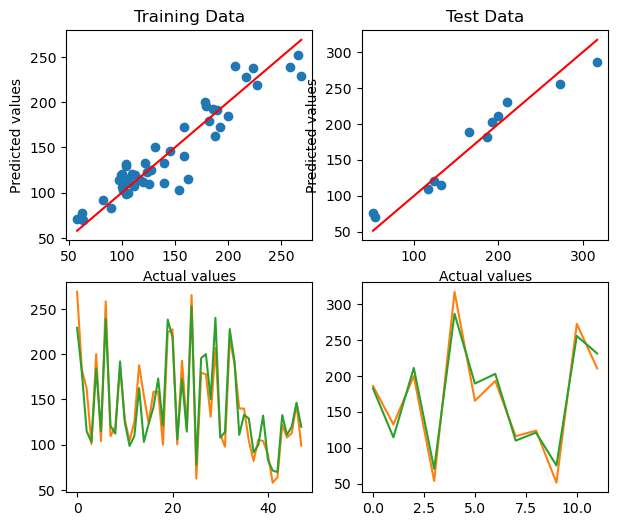

Epoch 400, Training Loss: 0.0954
Train R²:  0.88101   Train MPE:  68.21 %
Test R² :  0.94962   Test MPE :  36.91 %


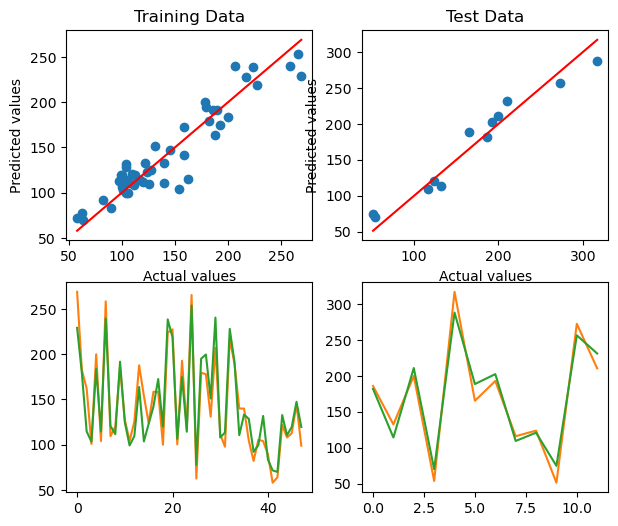

Epoch 450, Training Loss: 0.0937
Train R²:  0.88319   Train MPE:  68.06 %
Test R² :  0.95208   Test MPE :  36.70 %


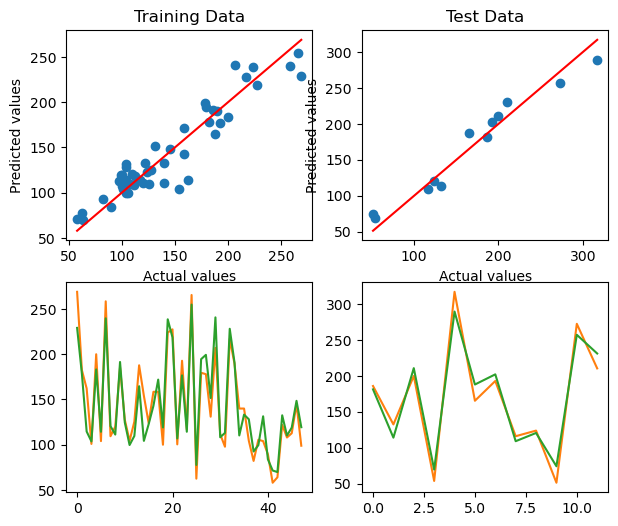

Epoch 500, Training Loss: 0.0919
Train R²:  0.88541   Train MPE:  67.56 %
Test R² :  0.95426   Test MPE :  36.42 %


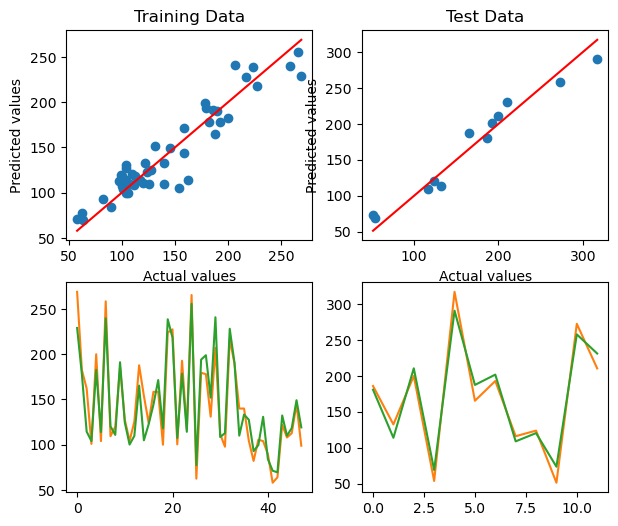

Epoch 550, Training Loss: 0.0900
Train R²:  0.88783   Train MPE:  66.99 %
Test R² :  0.95662   Test MPE :  36.06 %


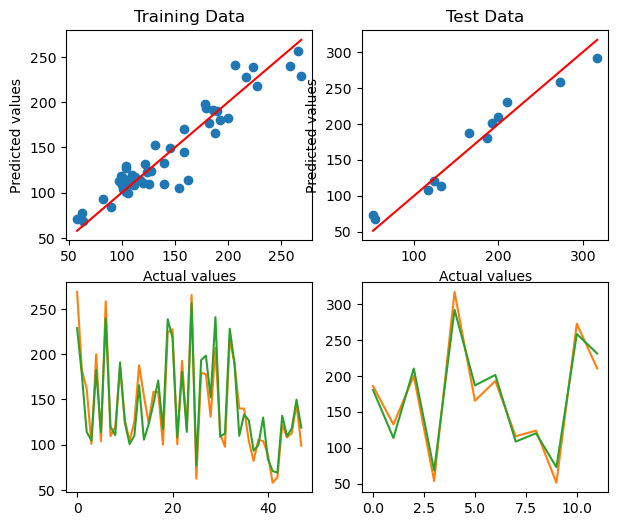

Epoch 600, Training Loss: 0.0879
Train R²:  0.89038   Train MPE:  66.56 %
Test R² :  0.95883   Test MPE :  35.70 %


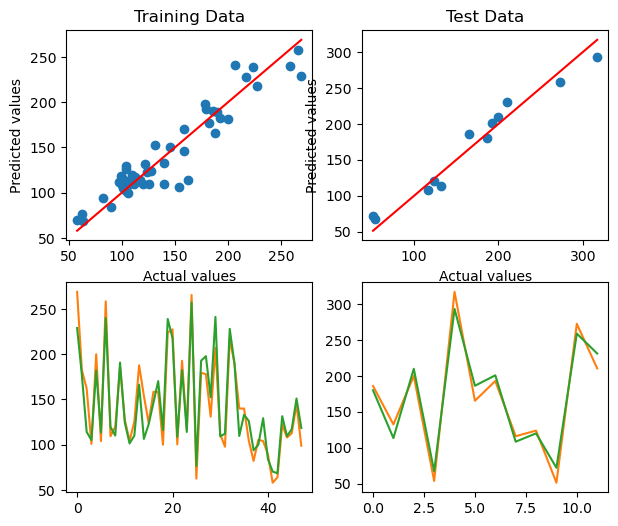

Epoch 650, Training Loss: 0.0858
Train R²:  0.89297   Train MPE:  65.99 %
Test R² :  0.96109   Test MPE :  35.17 %


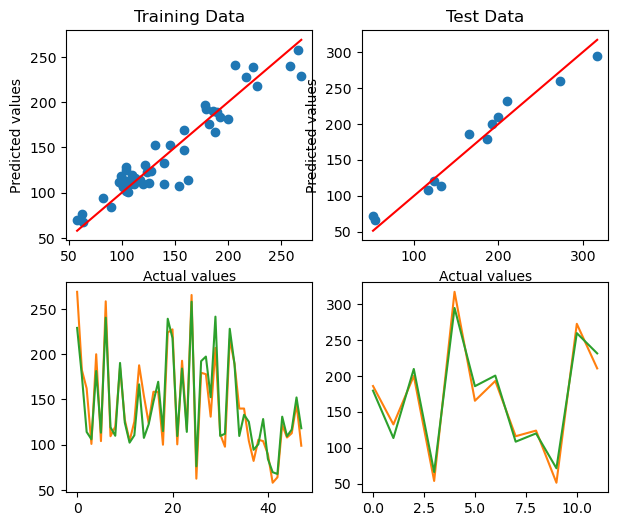

Epoch 700, Training Loss: 0.0830
Train R²:  0.89654   Train MPE:  65.44 %
Test R² :  0.96147   Test MPE :  34.79 %


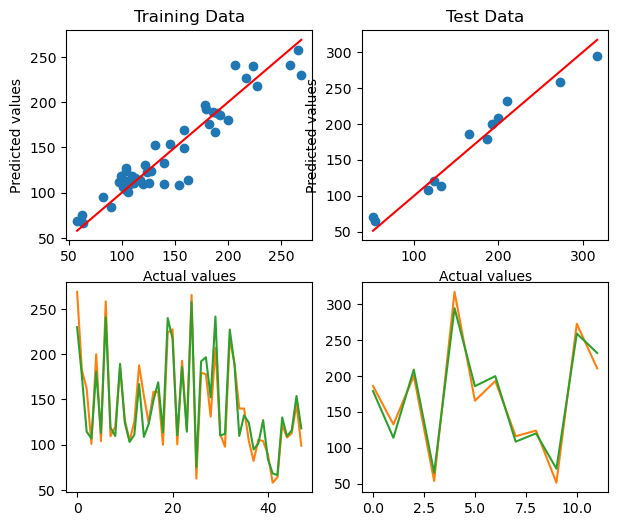

Epoch 750, Training Loss: 0.0807
Train R²:  0.89943   Train MPE:  64.44 %
Test R² :  0.96385   Test MPE :  34.09 %


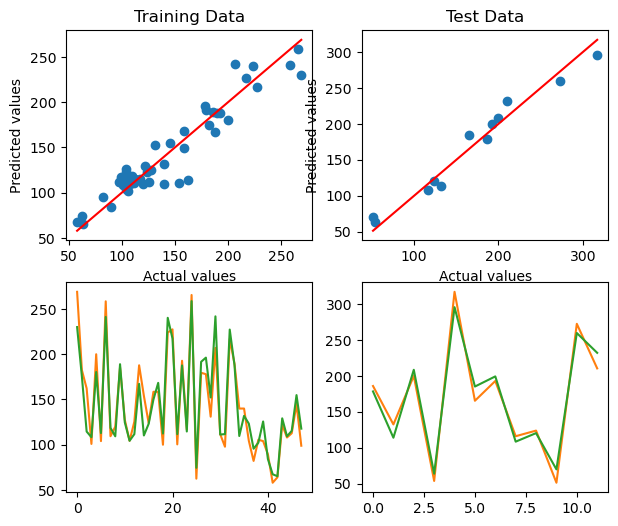

Epoch 800, Training Loss: 0.0782
Train R²:  0.90253   Train MPE:  62.57 %
Test R² :  0.96582   Test MPE :  33.50 %


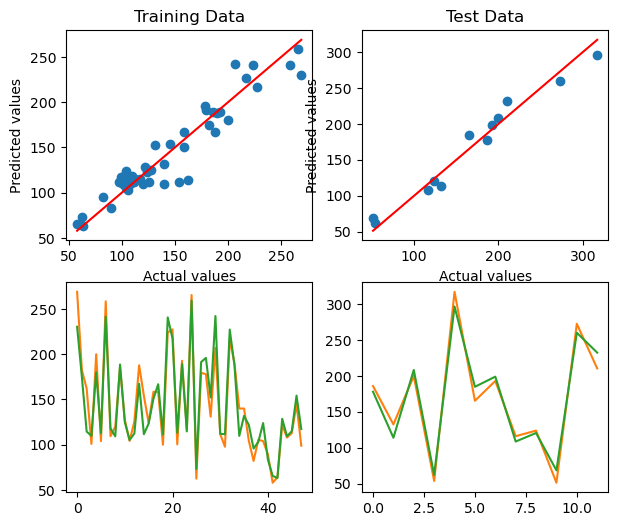

Epoch 850, Training Loss: 0.0759
Train R²:  0.90533   Train MPE:  61.31 %
Test R² :  0.96666   Test MPE :  32.96 %


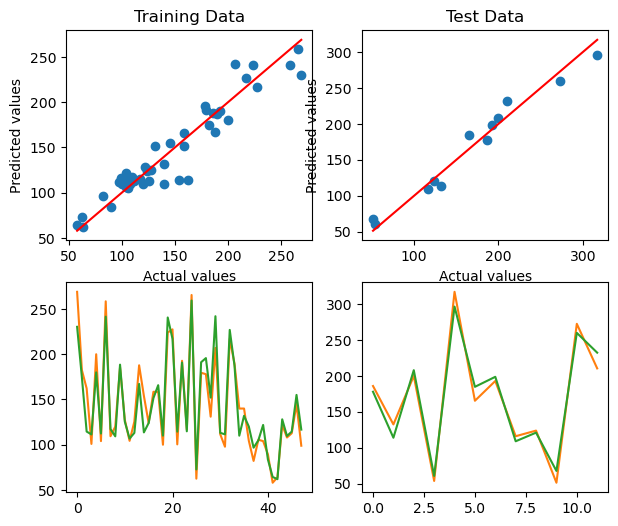

Epoch 900, Training Loss: 0.0741
Train R²:  0.90763   Train MPE:  60.35 %
Test R² :  0.96793   Test MPE :  32.35 %


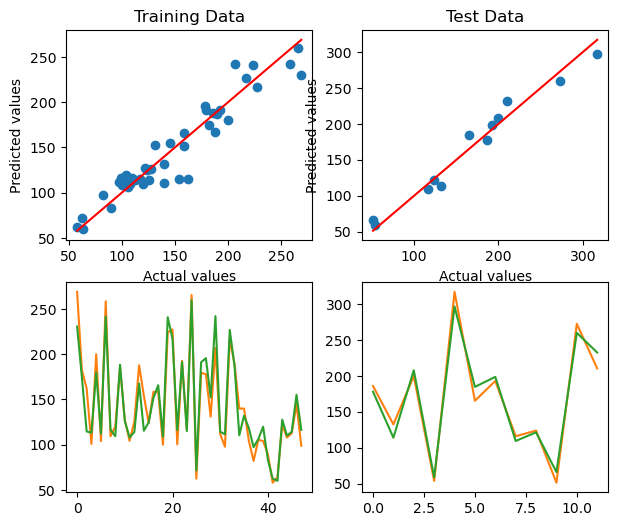

Epoch 950, Training Loss: 0.0725
Train R²:  0.90958   Train MPE:  59.09 %
Test R² :  0.96800   Test MPE :  32.27 %


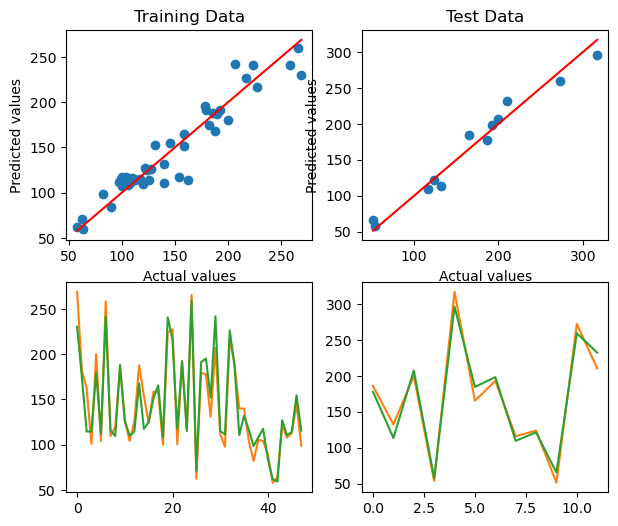

Epoch 1000, Training Loss: 0.0711
Train R²:  0.91134   Train MPE:  57.91 %
Test R² :  0.96829   Test MPE :  31.97 %


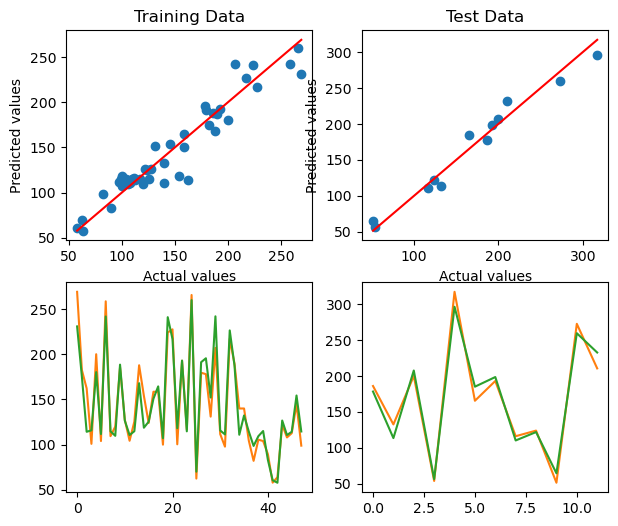

In [78]:
Pure_DNN2(5)

Epoch 50, Training Loss: 1.0156
Train R²:  0.02197   Train MPE:  202.98 %
Test R² :  -1.30682   Test MPE :  116.12 %


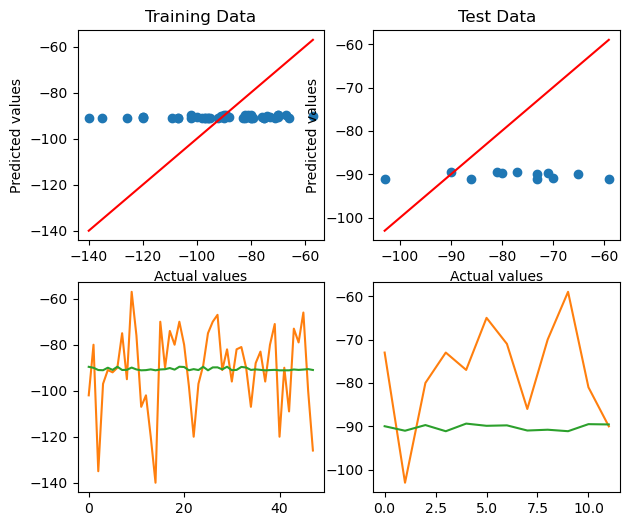

Epoch 100, Training Loss: 0.8759
Train R²:  0.15643   Train MPE:  286.62 %
Test R² :  -1.10279   Test MPE :  137.14 %


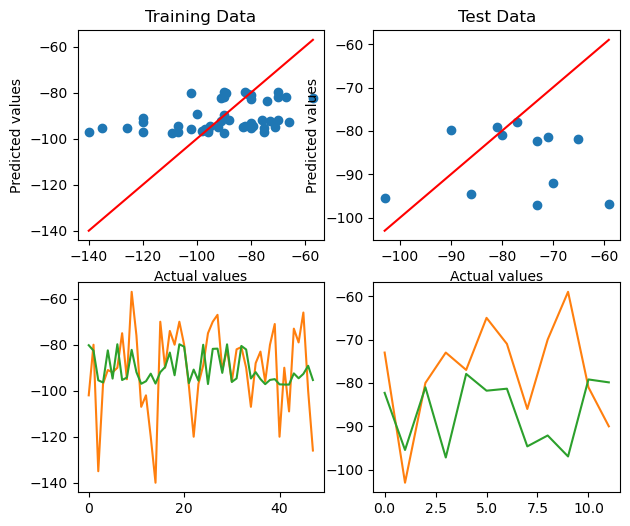

Epoch 150, Training Loss: 0.8126
Train R²:  0.21747   Train MPE:  140.01 %
Test R² :  -1.10959   Test MPE :  131.24 %


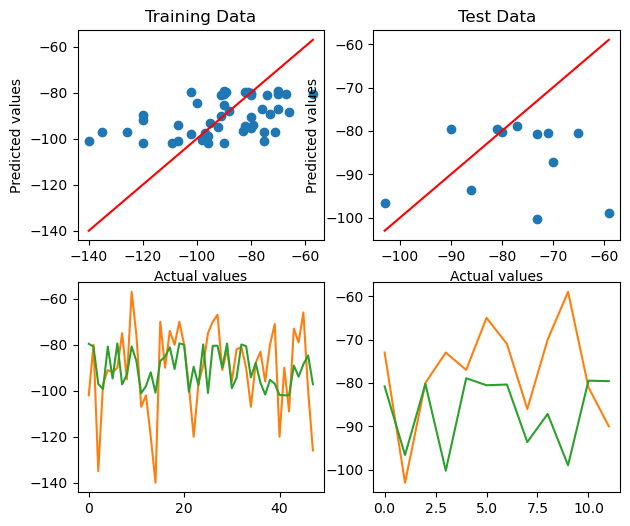

Epoch 200, Training Loss: 0.7292
Train R²:  0.29776   Train MPE:  301.24 %
Test R² :  -0.65788   Test MPE :  121.30 %


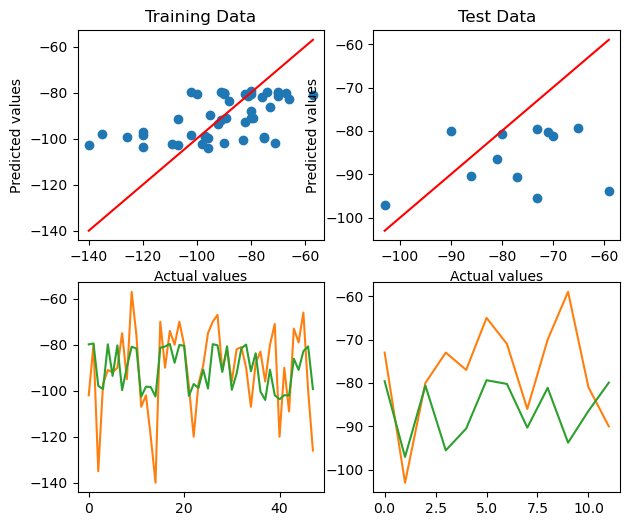

Epoch 250, Training Loss: 0.6854
Train R²:  0.33994   Train MPE:  405.43 %
Test R² :  -0.13115   Test MPE :  91.53 %


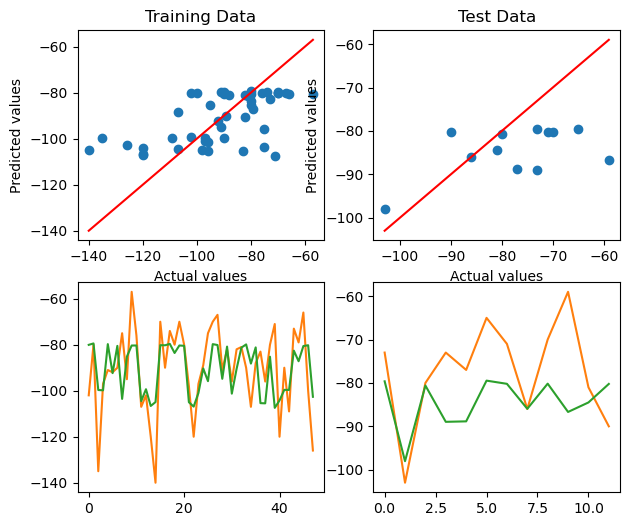

Epoch 300, Training Loss: 0.6715
Train R²:  0.35331   Train MPE:  421.37 %
Test R² :  -0.15587   Test MPE :  93.15 %


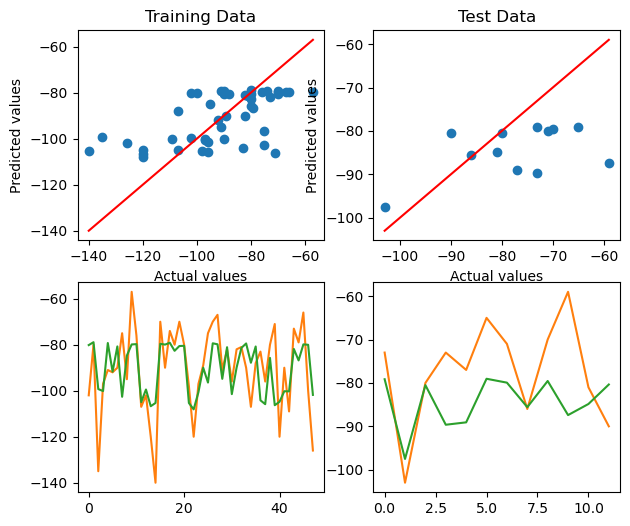

Epoch 350, Training Loss: 0.6453
Train R²:  0.37856   Train MPE:  424.10 %
Test R² :  -0.26907   Test MPE :  92.85 %


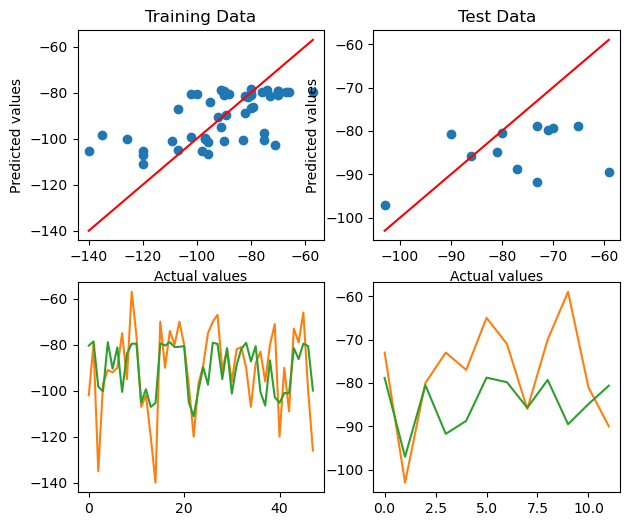

Epoch 400, Training Loss: 0.5594
Train R²:  0.46128   Train MPE:  328.92 %
Test R² :  -0.19820   Test MPE :  88.99 %


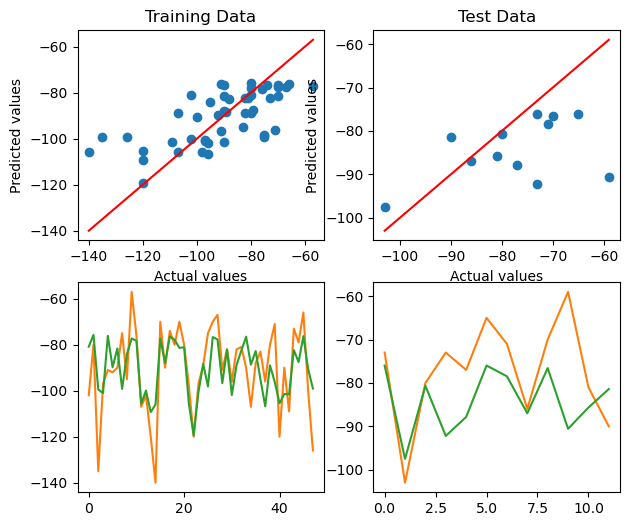

Epoch 450, Training Loss: 0.5270
Train R²:  0.49249   Train MPE:  455.69 %
Test R² :  -0.20005   Test MPE :  99.51 %


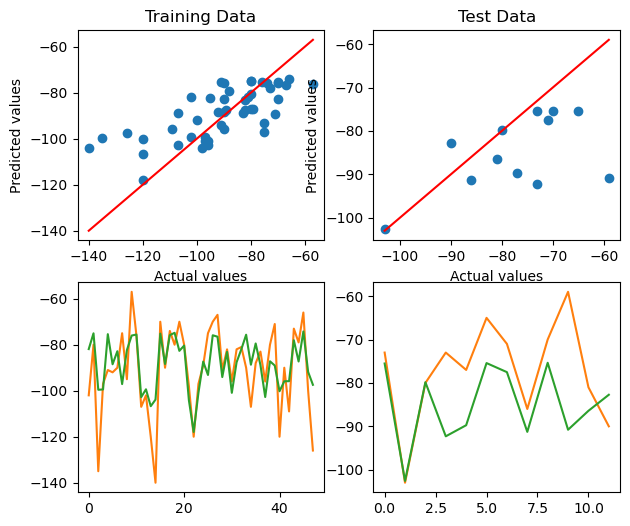

Epoch 500, Training Loss: 0.4562
Train R²:  0.56062   Train MPE:  457.59 %
Test R² :  0.29587   Test MPE :  74.84 %


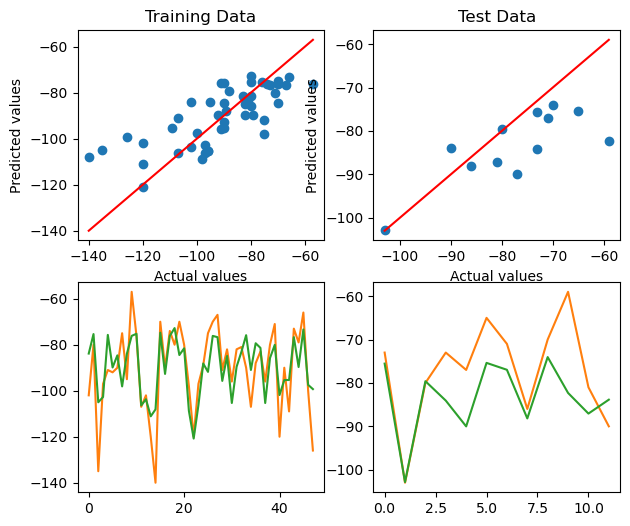

Epoch 550, Training Loss: 0.4412
Train R²:  0.57511   Train MPE:  396.07 %
Test R² :  0.49268   Test MPE :  67.34 %


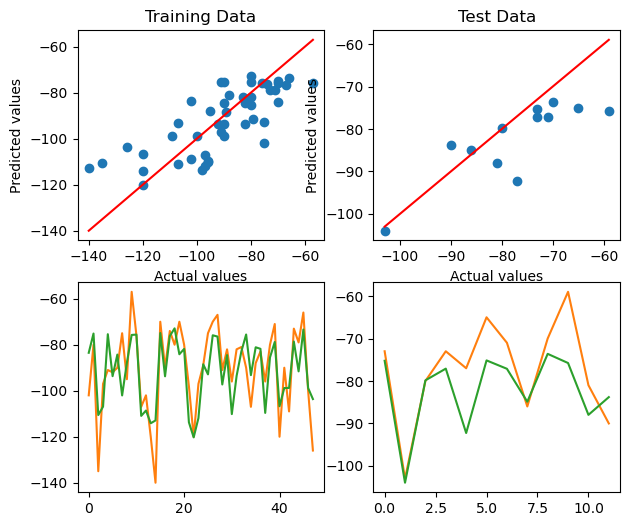

Epoch 600, Training Loss: 0.4277
Train R²:  0.58808   Train MPE:  428.14 %
Test R² :  0.41458   Test MPE :  75.88 %


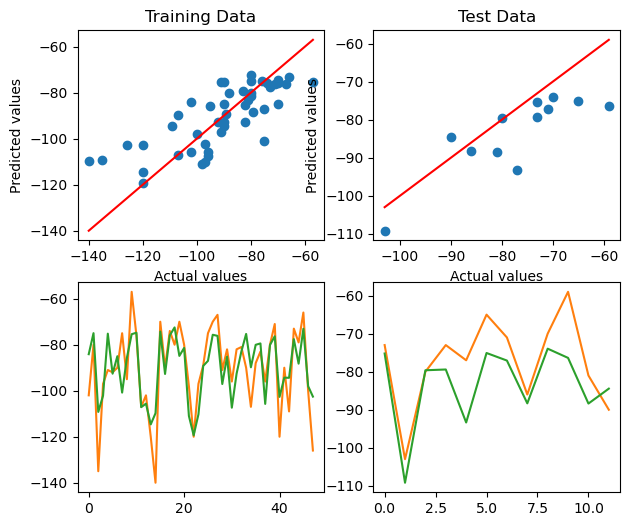

Epoch 650, Training Loss: 0.4613
Train R²:  0.55570   Train MPE:  353.10 %
Test R² :  0.38571   Test MPE :  75.10 %


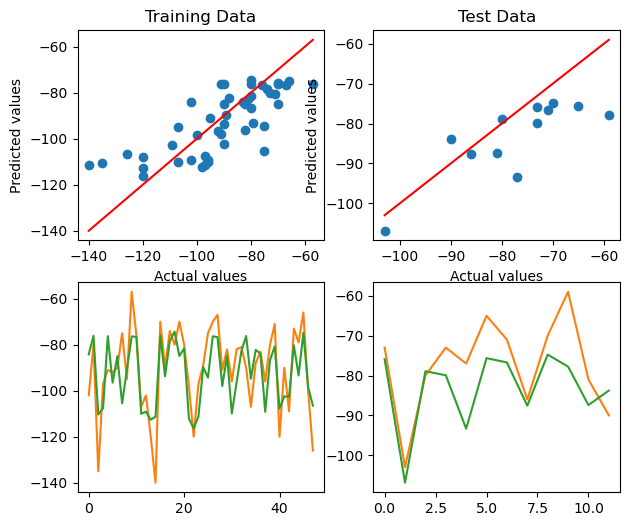

Epoch 700, Training Loss: 0.4113
Train R²:  0.60387   Train MPE:  386.92 %
Test R² :  0.43774   Test MPE :  66.58 %


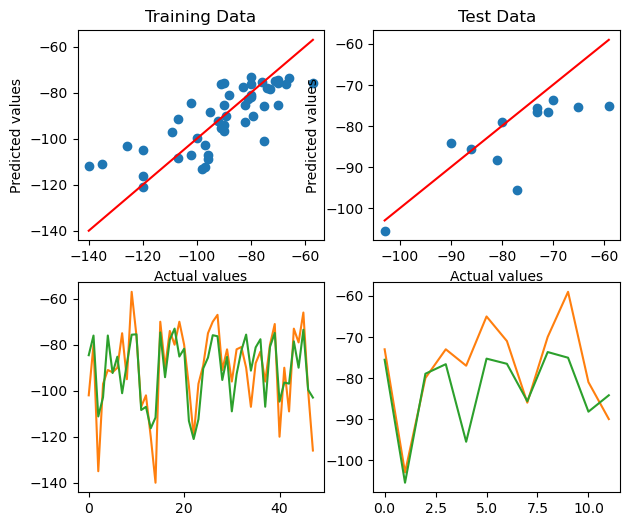

Epoch 750, Training Loss: 0.4243
Train R²:  0.59139   Train MPE:  434.36 %
Test R² :  0.23810   Test MPE :  102.61 %


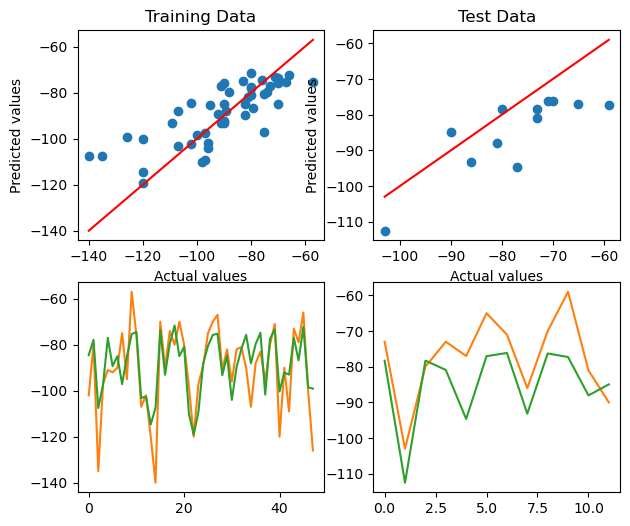

Epoch 800, Training Loss: 0.3934
Train R²:  0.62116   Train MPE:  462.98 %
Test R² :  0.32234   Test MPE :  88.31 %


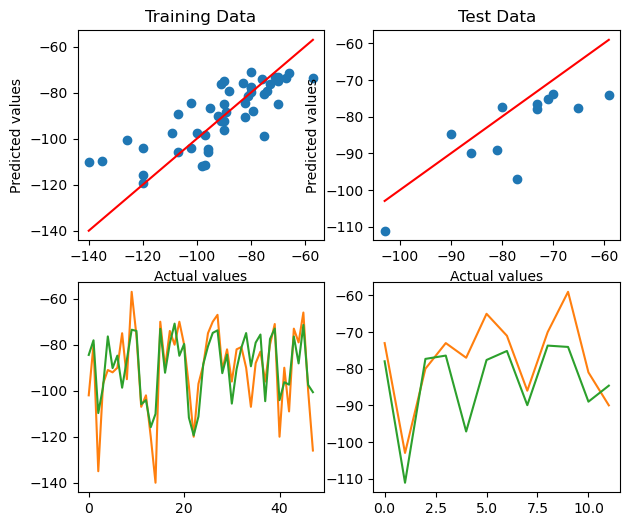

Epoch 850, Training Loss: 0.3930
Train R²:  0.62147   Train MPE:  516.11 %
Test R² :  0.31804   Test MPE :  87.11 %


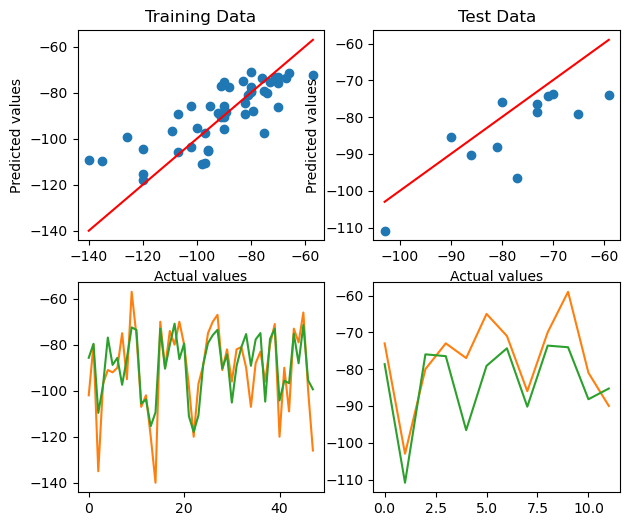

Epoch 900, Training Loss: 0.3951
Train R²:  0.61951   Train MPE:  416.90 %
Test R² :  0.53652   Test MPE :  80.04 %


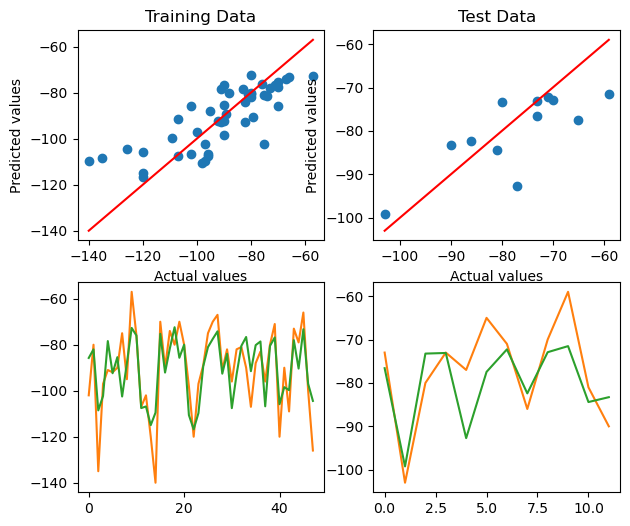

Epoch 950, Training Loss: 0.4063
Train R²:  0.60870   Train MPE:  343.95 %
Test R² :  0.37735   Test MPE :  72.60 %


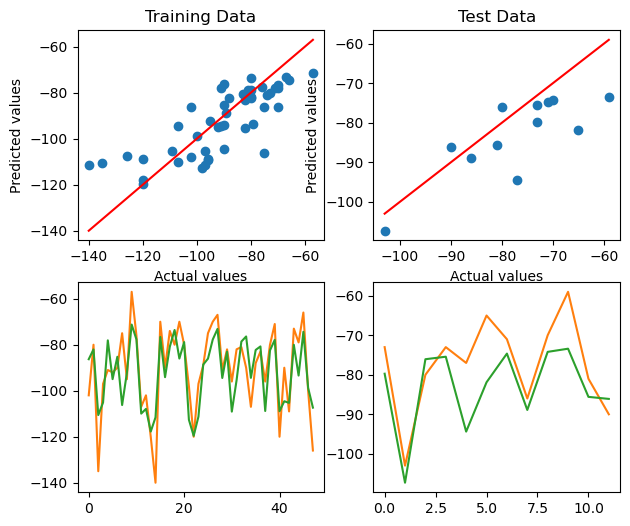

Epoch 1000, Training Loss: 0.3592
Train R²:  0.65403   Train MPE:  448.84 %
Test R² :  0.39826   Test MPE :  73.75 %


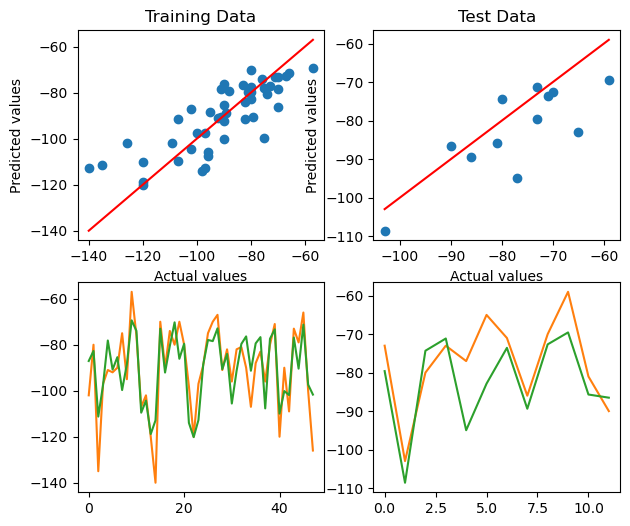

In [79]:
Pure_DNN2(6)

In [80]:
def Pure_DNN3(variable):
    X = pd.read_excel(root,usecols=[0,3,4])
    y = pd.read_excel(root,usecols=[variable])
    
    # Normalize inputs
    scaler_X = StandardScaler()
    X_scaled = scaler_X.fit_transform(X)
    
    scaler_y = StandardScaler()
    y_scaled = scaler_y.fit_transform(y)
    
    # Use scaled data
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=10)
    
    # Convert y to float and flatten
    y_train = np.array(y_train, dtype=np.float32).ravel()
    y_test = np.array(y_test, dtype=np.float32).ravel()
    
    # Convert to tensors
    X_train = torch.tensor(X_train, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
    X_test = torch.tensor(X_test, dtype=torch.float32)
    y_test = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)
    
    # Neural network class
    class DeepNN(nn.Module):
        def __init__(self, input_size=3, hidden_size= 32, output_size=1):
            super(DeepNN, self).__init__()
            # self.fc1 = nn.Linear(input_size, hidden_size)
            # self.activation = nn.ReLU()
            # self.out = nn.Linear(hidden_size, output_size)
            self.fc1 = nn.Linear(input_size, hidden_size)
            self.fc2 = nn.Linear(hidden_size, hidden_size)
            self.fc3 = nn.Linear(hidden_size, hidden_size)
            self.fc4 = nn.Linear(hidden_size, hidden_size)
            self.fc5 = nn.Linear(hidden_size, hidden_size)
            self.fc6 = nn.Linear(hidden_size, output_size)
    
        def forward(self, x):
            # x = self.activation(self.fc1(x))
            x = torch.relu(self.fc1(x))
            x = torch.relu(self.fc2(x))
            x = torch.relu(self.fc3(x))
            x = torch.relu(self.fc4(x))
            x = torch.relu(self.fc5(x))
            x = self.fc6(x)
            return x
    
    # Model, loss, optimizer
    model = DeepNN()
    criterion = nn.MSELoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
    
    # Training loop
    num_epochs = 1000
    for epoch in range(num_epochs):
        model.train()
        y_train_pred = model(X_train)
        loss = criterion(y_train_pred, y_train)
    
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
        if (epoch + 1) % 50 == 0:
            model.eval()
            y_test_pred = model(X_test)

            train_r2 = r2_score(y_train.detach().numpy(), y_train_pred.detach().numpy())
            train_mpe = mean_absolute_percentage_error(y_train.detach().numpy(), y_train_pred.detach().numpy())
            
            test_r2 = r2_score(y_test.detach().numpy(), y_test_pred.detach().numpy())
            test_mpe = mean_absolute_percentage_error(y_test.detach().numpy(), y_test_pred.detach().numpy())
           
            print(f"Epoch {epoch+1}, Training Loss: {loss.item():.4f}")
            print("Train R²: ", "%.5f" % round(train_r2, 5), "  Train MPE: ", "%.2f" % round(train_mpe * 100, 2),"%")
            print("Test R² : ", "%.5f" % round(test_r2, 5), "  Test MPE : ", "%.2f" % round(test_mpe * 100, 2),"%")
    
            y_train2 = scaler_y.inverse_transform(y_train.detach().numpy())
            y_train_pred2 = scaler_y.inverse_transform(y_train_pred.detach().numpy())
            y_test2 = scaler_y.inverse_transform(y_test.detach().numpy())
            y_test_pred2 = scaler_y.inverse_transform(y_test_pred.detach().numpy())
    
            fig, axes = plt.subplots(2, 2, figsize = (7, 6))
            axes[0, 0].scatter(y_train2, y_train_pred2)
            axes[0, 0].plot([min(y_train2), max(y_train2)],[min(y_train2), max(y_train2)], color = 'r')
            axes[0, 0].set_title("Training Data")
            axes[0, 0].set_xlabel("Actual values")
            axes[0, 0].set_ylabel("Predicted values")
            
            axes[0, 1].scatter(y_test2, y_test_pred2)
            axes[0, 1].plot([min(y_test2), max(y_test2)],[min(y_test2), max(y_test2)], color = 'r')
            axes[0, 1].set_title("Test Data")
            axes[0, 1].set_xlabel("Actual values")
            axes[0, 1].set_ylabel("Predicted values")
    
            axes[1, 0].plot(y_train2,'tab:orange', label = 'real')
            axes[1, 0].plot(y_train_pred2,'tab:green',label = 'pred')
    
            axes[1, 1].plot(y_test2,'tab:orange',label = 'real')
            axes[1, 1].plot(y_test_pred2,'tab:green',label = 'pred')
    
            plt.draw();plt.pause(0.05)
        
        plt.ioff()
        plt.show()

Epoch 50, Training Loss: 0.4632
Train R²:  0.42252   Train MPE:  80.22 %
Test R² :  0.42019   Test MPE :  55.76 %


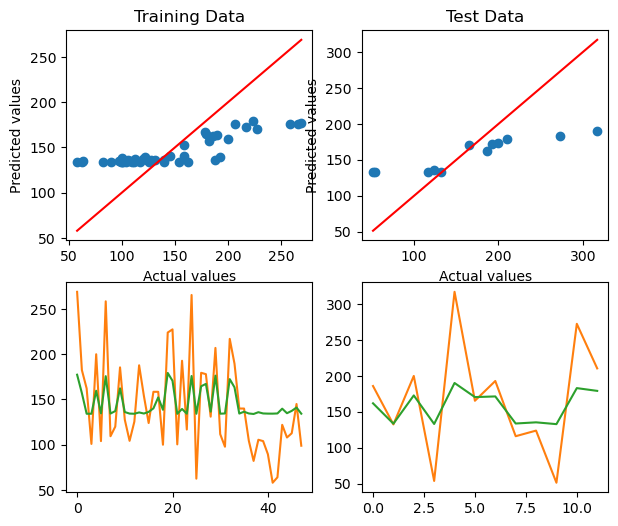

Epoch 100, Training Loss: 0.1406
Train R²:  0.82473   Train MPE:  72.89 %
Test R² :  0.86693   Test MPE :  46.42 %


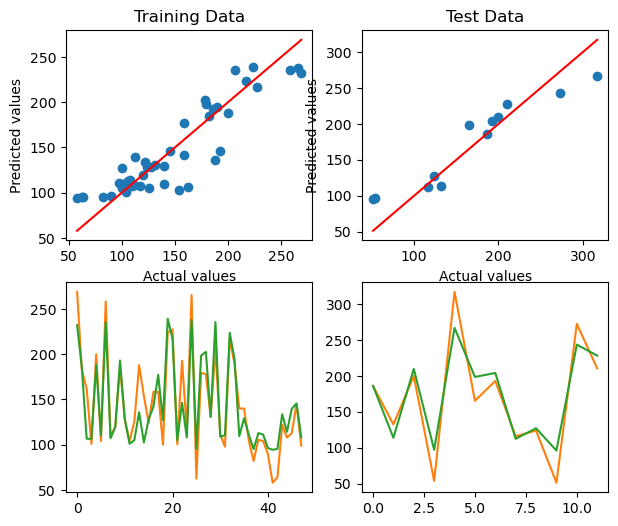

Epoch 150, Training Loss: 0.1092
Train R²:  0.86388   Train MPE:  71.94 %
Test R² :  0.90538   Test MPE :  43.95 %


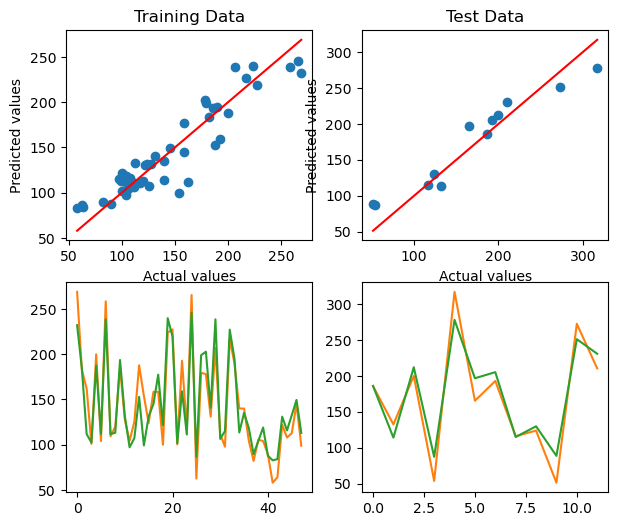

Epoch 200, Training Loss: 0.0982
Train R²:  0.87762   Train MPE:  67.90 %
Test R² :  0.91840   Test MPE :  42.01 %


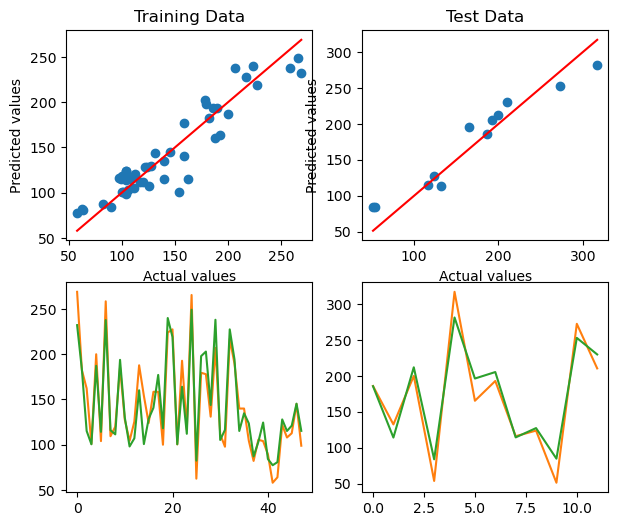

Epoch 250, Training Loss: 0.0931
Train R²:  0.88387   Train MPE:  67.16 %
Test R² :  0.92205   Test MPE :  41.34 %


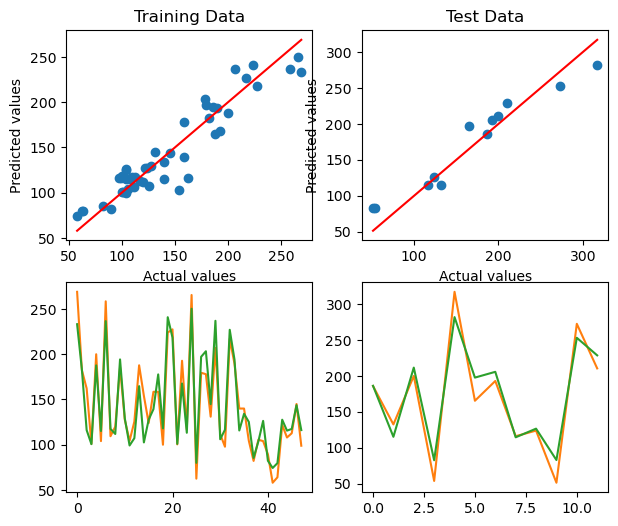

Epoch 300, Training Loss: 0.0891
Train R²:  0.88889   Train MPE:  66.36 %
Test R² :  0.92476   Test MPE :  40.64 %


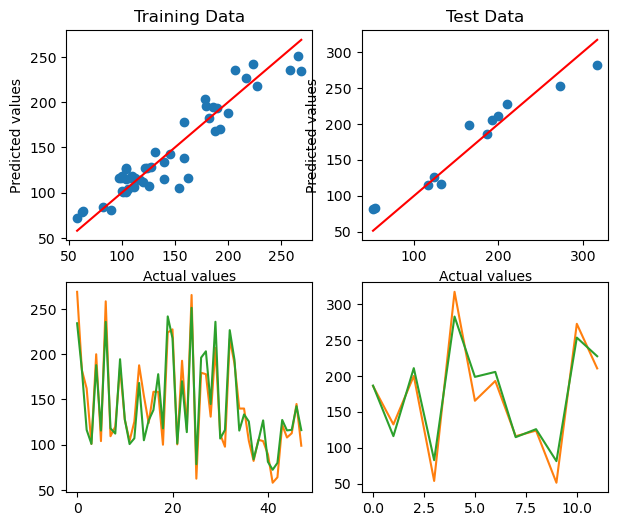

Epoch 350, Training Loss: 0.0845
Train R²:  0.89467   Train MPE:  64.81 %
Test R² :  0.92812   Test MPE :  39.77 %


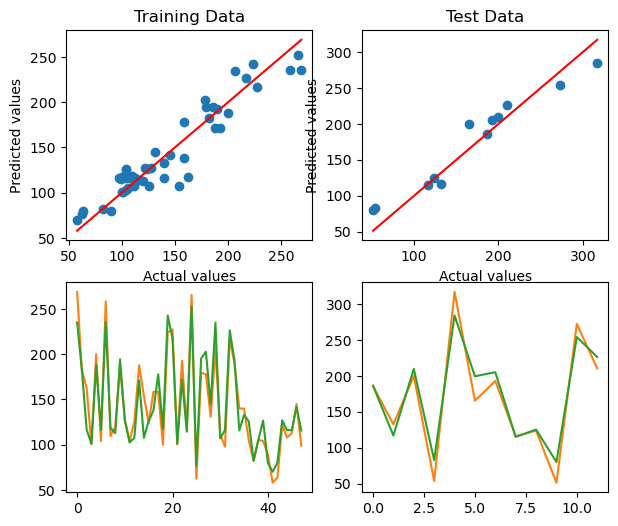

Epoch 400, Training Loss: 0.0803
Train R²:  0.89989   Train MPE:  62.90 %
Test R² :  0.93273   Test MPE :  38.41 %


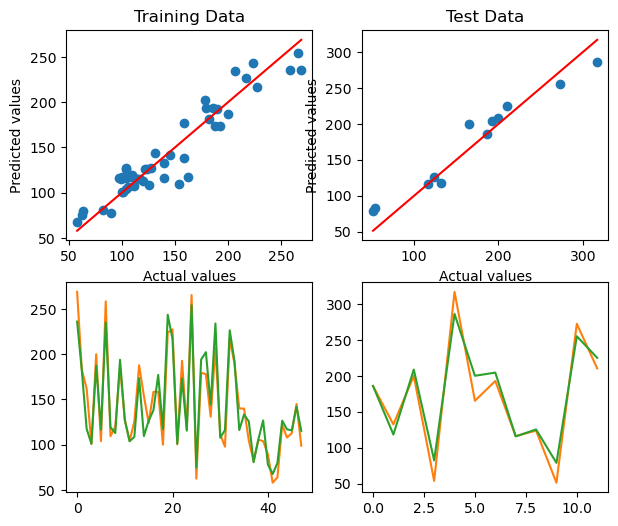

Epoch 450, Training Loss: 0.0760
Train R²:  0.90528   Train MPE:  60.61 %
Test R² :  0.93685   Test MPE :  37.67 %


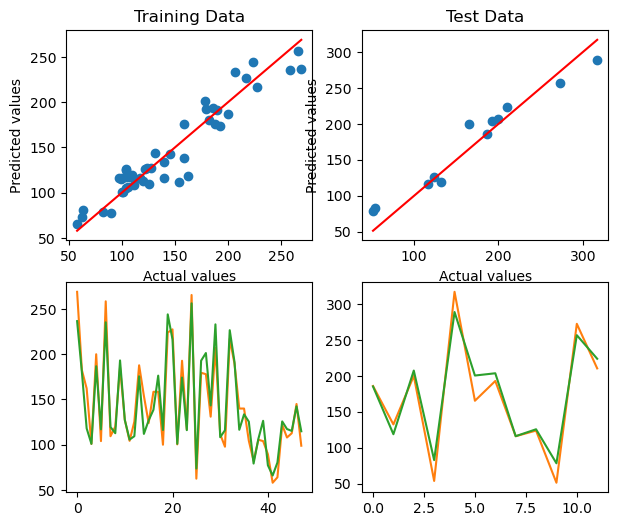

Epoch 500, Training Loss: 0.0712
Train R²:  0.91124   Train MPE:  57.82 %
Test R² :  0.94168   Test MPE :  37.14 %


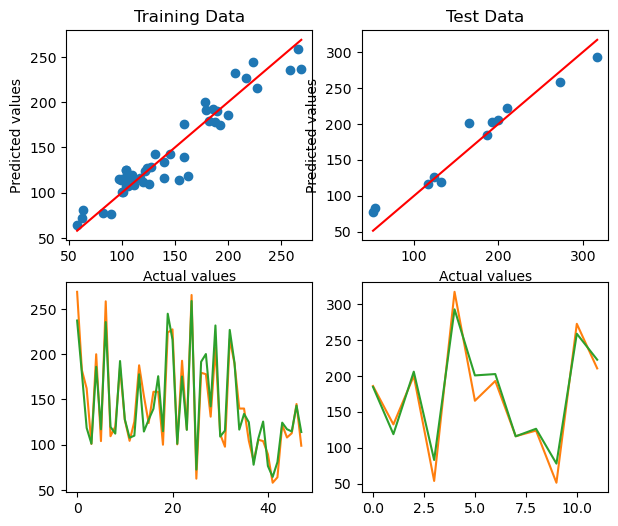

Epoch 550, Training Loss: 0.0663
Train R²:  0.91739   Train MPE:  54.46 %
Test R² :  0.94560   Test MPE :  36.64 %


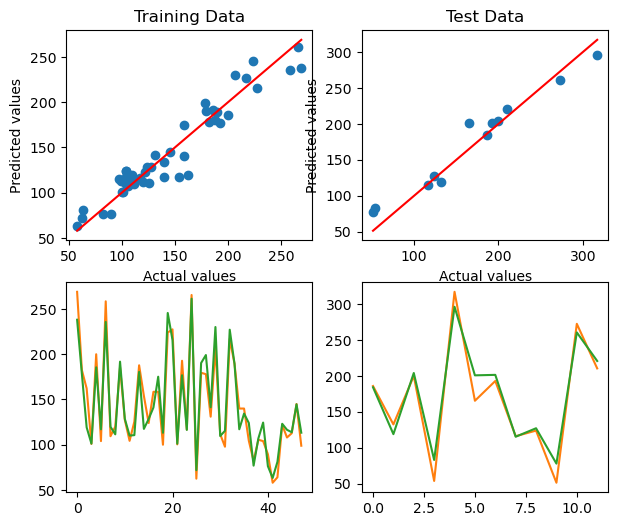

Epoch 600, Training Loss: 0.0609
Train R²:  0.92401   Train MPE:  51.87 %
Test R² :  0.94965   Test MPE :  35.32 %


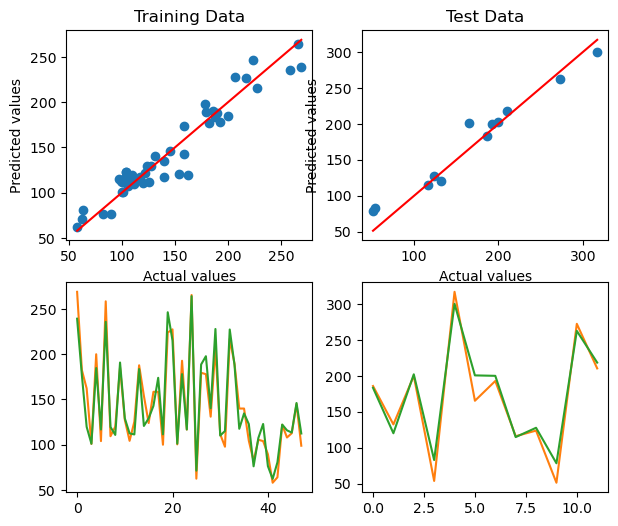

Epoch 650, Training Loss: 0.0555
Train R²:  0.93083   Train MPE:  49.02 %
Test R² :  0.95290   Test MPE :  34.59 %


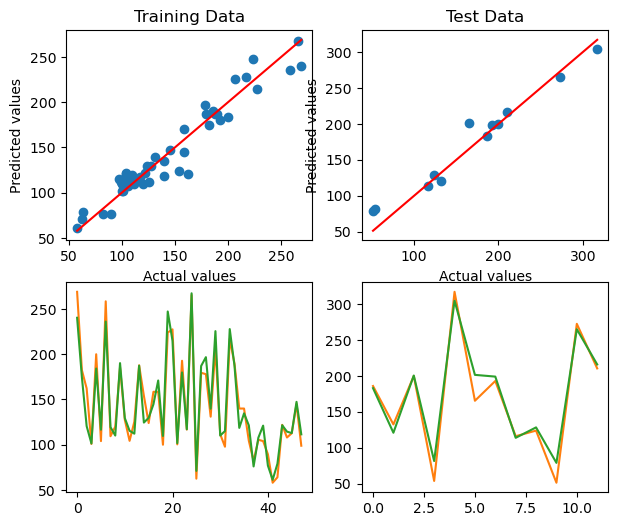

Epoch 700, Training Loss: 0.0501
Train R²:  0.93758   Train MPE:  46.73 %
Test R² :  0.95526   Test MPE :  34.62 %


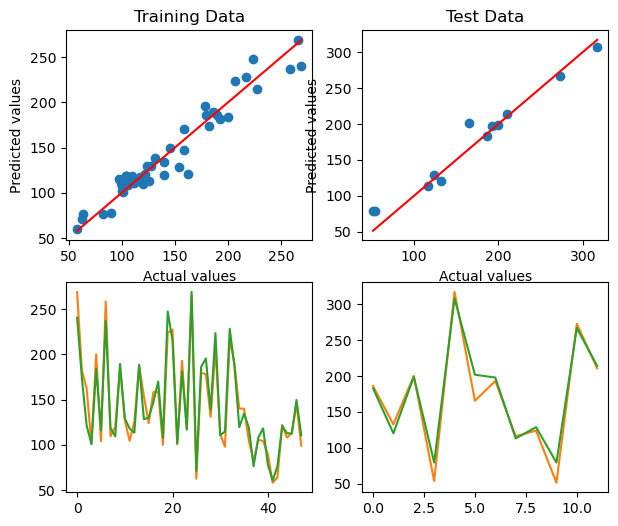

Epoch 750, Training Loss: 0.0450
Train R²:  0.94385   Train MPE:  44.21 %
Test R² :  0.95639   Test MPE :  35.30 %


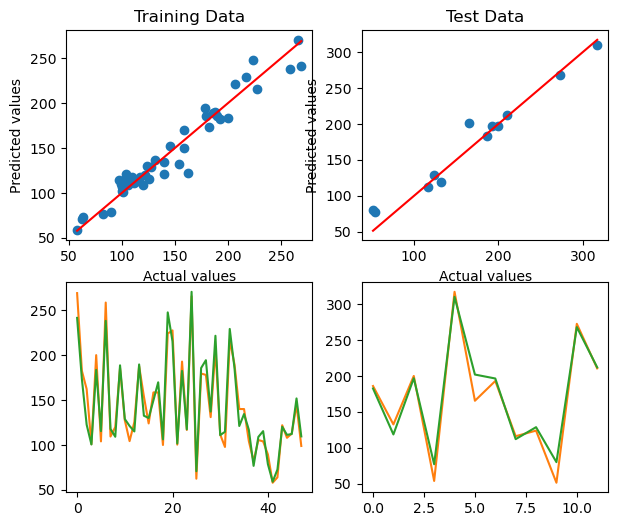

Epoch 800, Training Loss: 0.0404
Train R²:  0.94962   Train MPE:  41.42 %
Test R² :  0.95705   Test MPE :  35.70 %


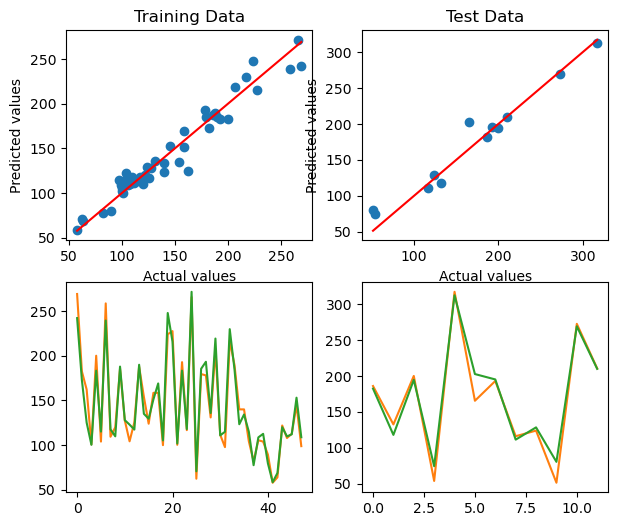

Epoch 850, Training Loss: 0.0361
Train R²:  0.95497   Train MPE:  38.63 %
Test R² :  0.95722   Test MPE :  36.81 %


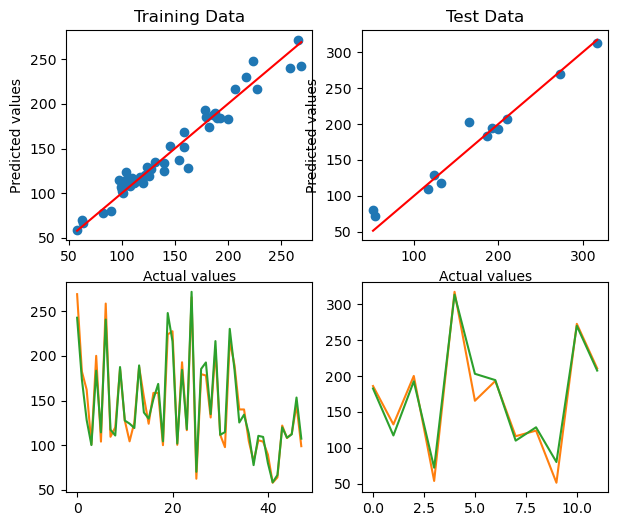

Epoch 900, Training Loss: 0.0319
Train R²:  0.96018   Train MPE:  35.89 %
Test R² :  0.95599   Test MPE :  37.75 %


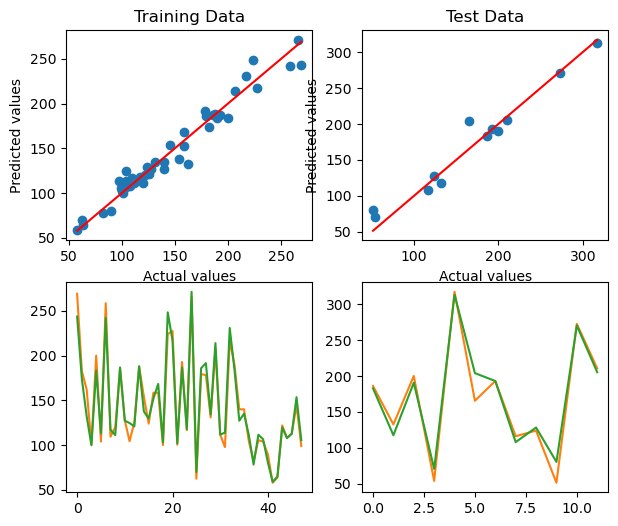

Epoch 950, Training Loss: 0.0281
Train R²:  0.96499   Train MPE:  33.75 %
Test R² :  0.95515   Test MPE :  38.55 %


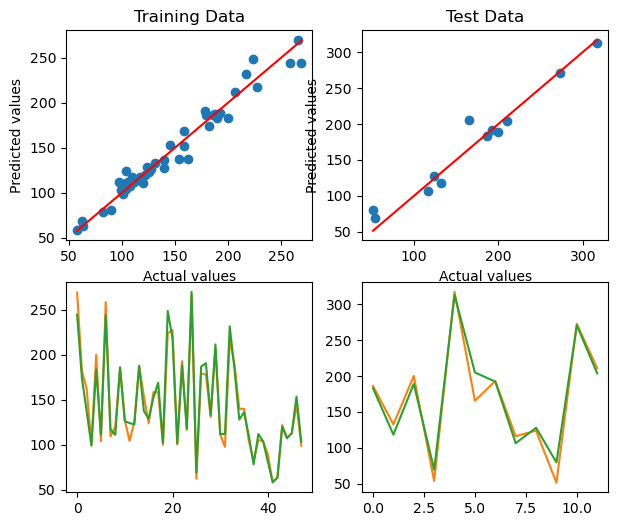

Epoch 1000, Training Loss: 0.0250
Train R²:  0.96882   Train MPE:  31.46 %
Test R² :  0.95432   Test MPE :  39.35 %


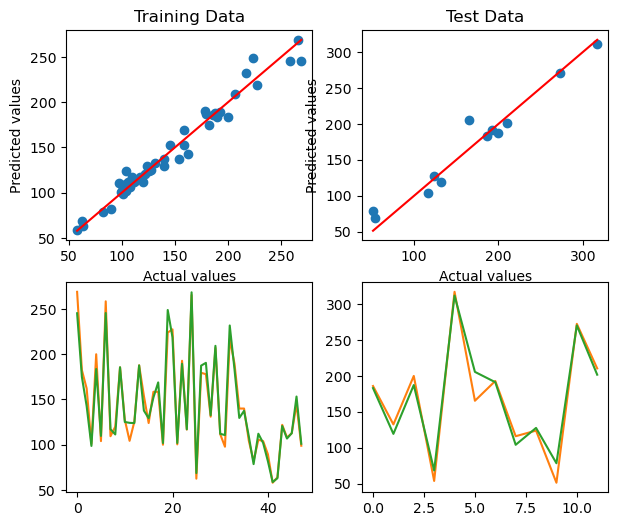

In [81]:
Pure_DNN3(5)

Epoch 50, Training Loss: 1.0177
Train R²:  0.01990   Train MPE:  203.03 %
Test R² :  -1.36675   Test MPE :  116.02 %


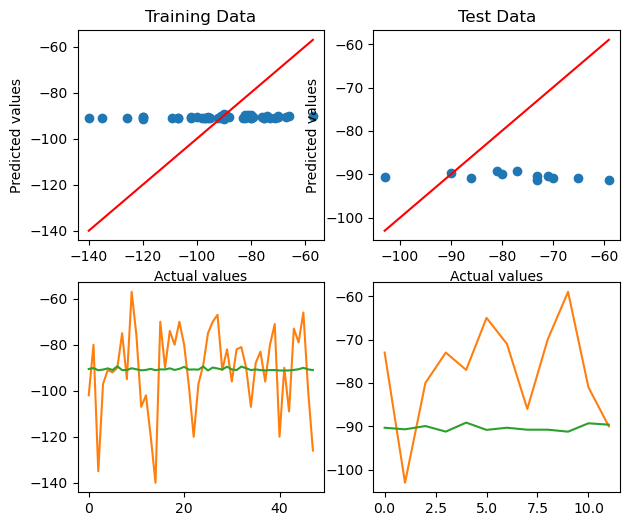

Epoch 100, Training Loss: 0.8584
Train R²:  0.17335   Train MPE:  261.11 %
Test R² :  -1.30464   Test MPE :  136.42 %


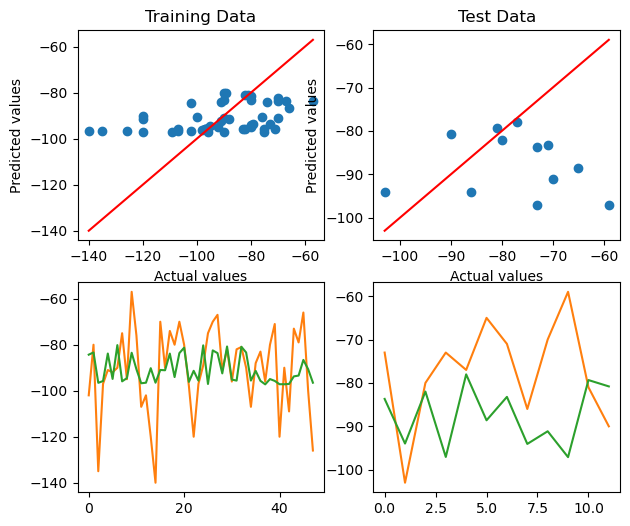

Epoch 150, Training Loss: 0.7690
Train R²:  0.25944   Train MPE:  173.51 %
Test R² :  -1.51008   Test MPE :  149.15 %


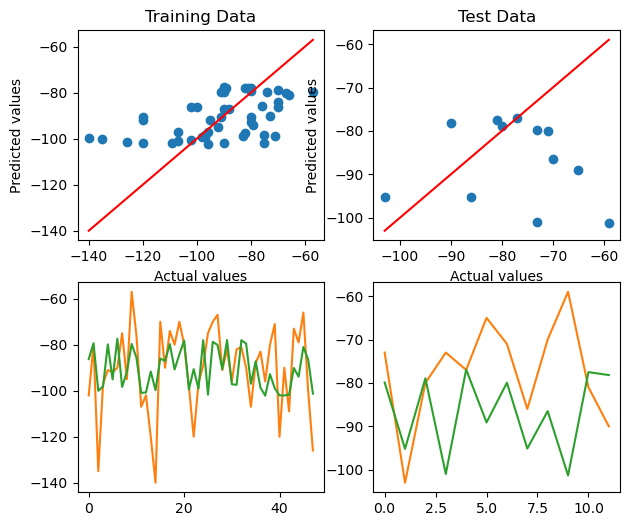

Epoch 200, Training Loss: 0.6797
Train R²:  0.34539   Train MPE:  225.98 %
Test R² :  -1.58363   Test MPE :  146.00 %


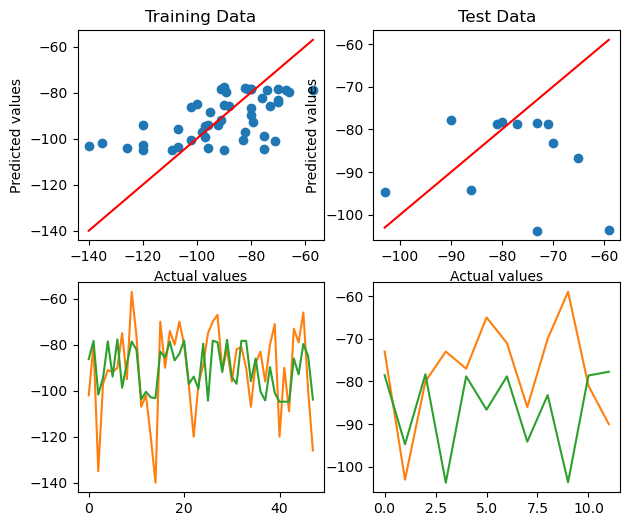

Epoch 250, Training Loss: 0.5318
Train R²:  0.48785   Train MPE:  216.43 %
Test R² :  -1.78331   Test MPE :  126.19 %


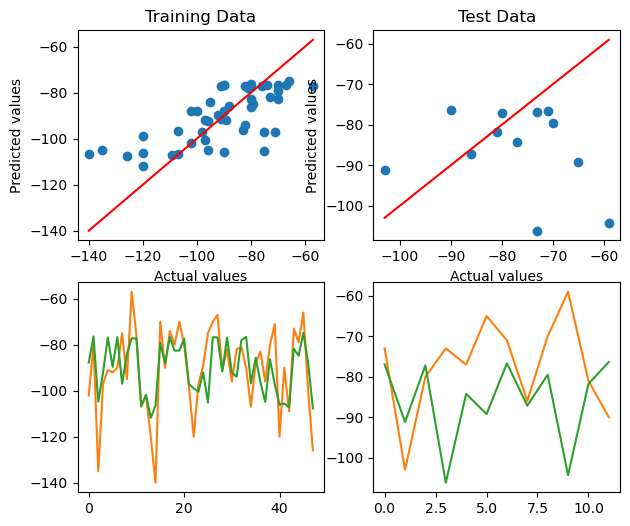

Epoch 300, Training Loss: 0.2384
Train R²:  0.77044   Train MPE:  211.78 %
Test R² :  -2.69459   Test MPE :  188.94 %


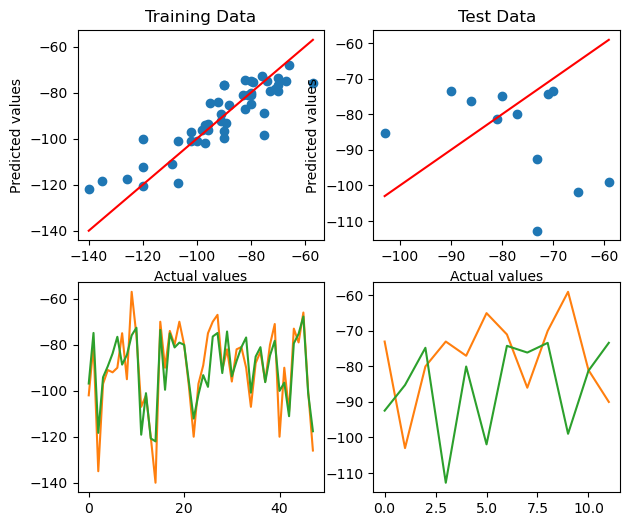

Epoch 350, Training Loss: 0.1680
Train R²:  0.83824   Train MPE:  295.44 %
Test R² :  -2.80962   Test MPE :  180.15 %


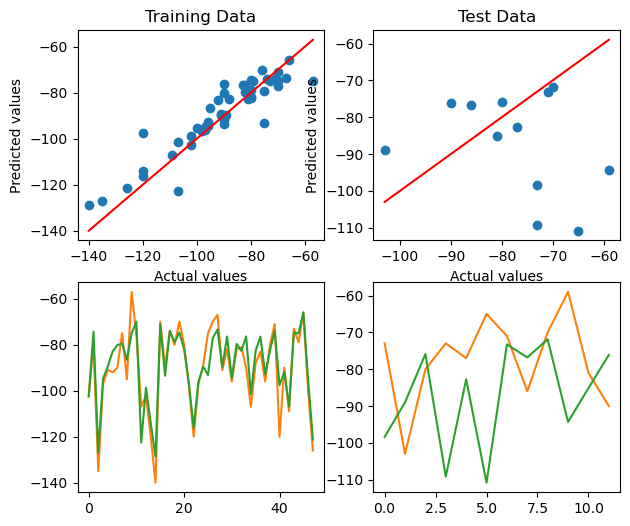

Epoch 400, Training Loss: 0.1506
Train R²:  0.85501   Train MPE:  138.50 %
Test R² :  -1.75367   Test MPE :  170.06 %


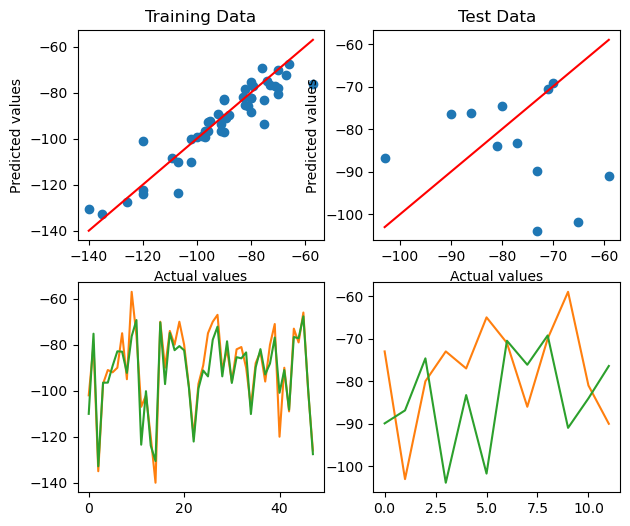

Epoch 450, Training Loss: 0.1148
Train R²:  0.88943   Train MPE:  140.65 %
Test R² :  -1.77051   Test MPE :  162.94 %


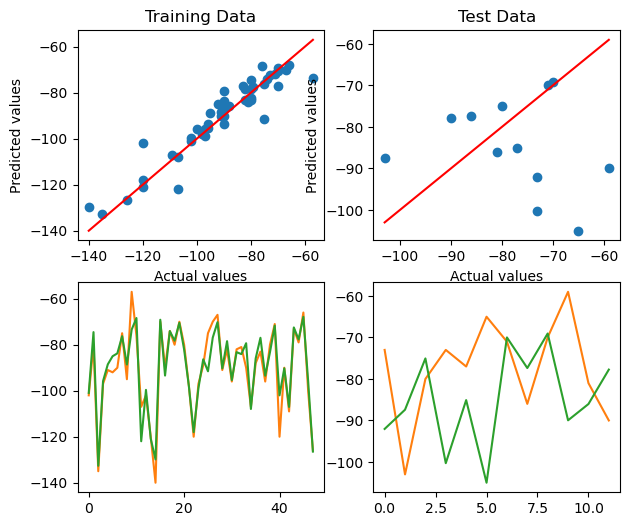

Epoch 500, Training Loss: 0.0950
Train R²:  0.90855   Train MPE:  80.53 %
Test R² :  -1.47914   Test MPE :  164.24 %


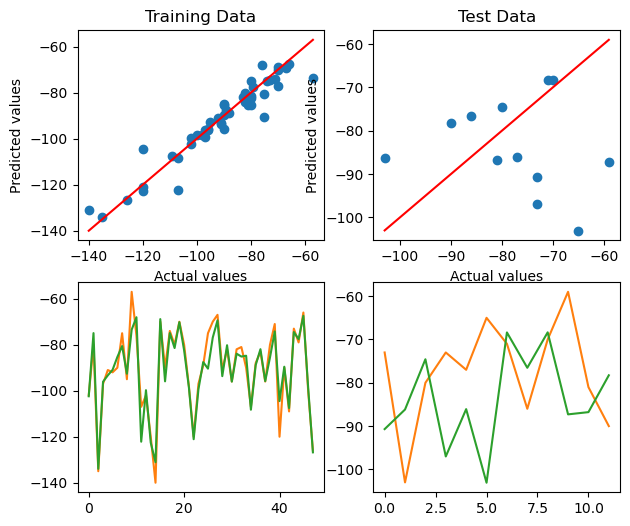

Epoch 550, Training Loss: 0.4688
Train R²:  0.54855   Train MPE:  776.23 %
Test R² :  -1.44479   Test MPE :  117.38 %


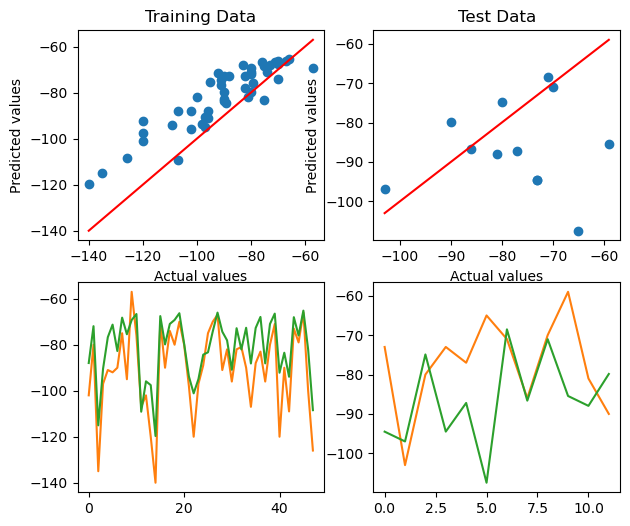

Epoch 600, Training Loss: 0.0878
Train R²:  0.91545   Train MPE:  155.26 %
Test R² :  -1.31450   Test MPE :  158.50 %


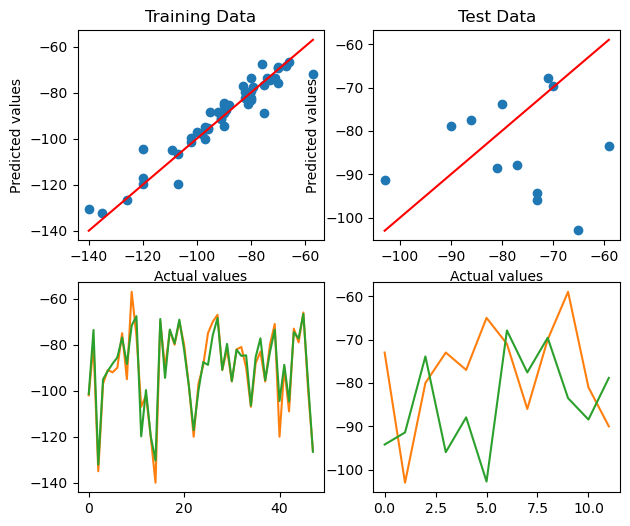

Epoch 650, Training Loss: 0.0572
Train R²:  0.94491   Train MPE:  44.23 %
Test R² :  -1.00876   Test MPE :  152.77 %


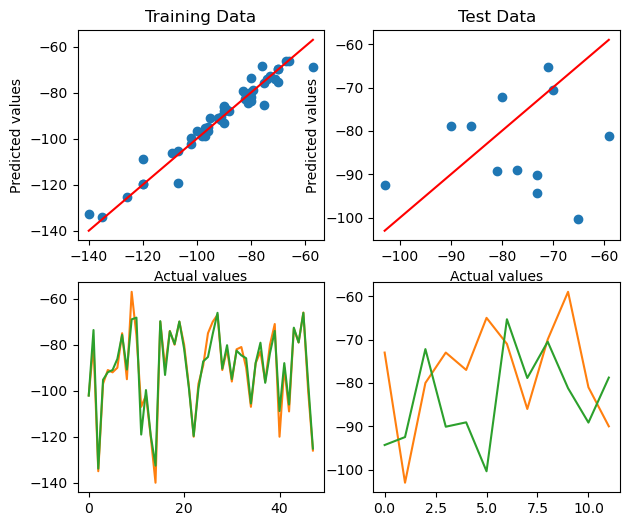

Epoch 700, Training Loss: 0.0884
Train R²:  0.91485   Train MPE:  301.68 %
Test R² :  -1.12622   Test MPE :  142.54 %


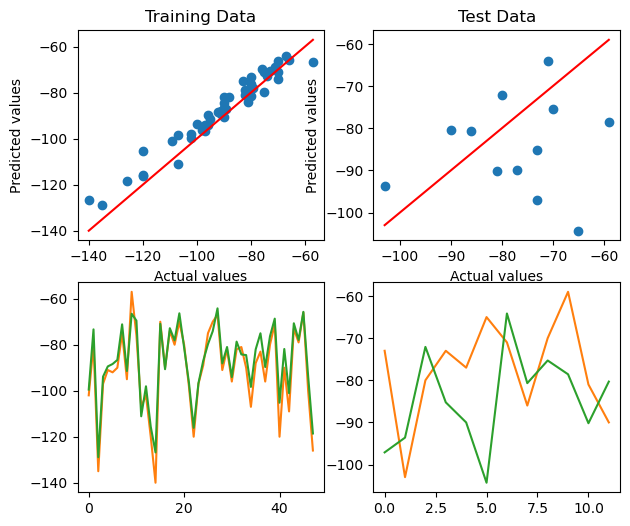

Epoch 750, Training Loss: 0.0298
Train R²:  0.97128   Train MPE:  80.81 %
Test R² :  -1.00895   Test MPE :  151.36 %


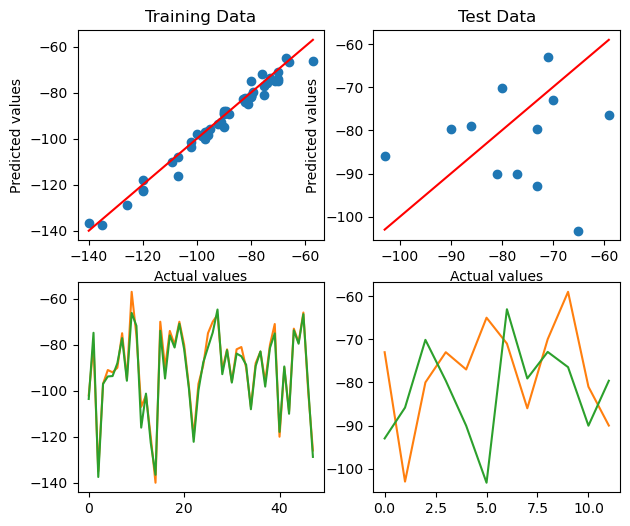

Epoch 800, Training Loss: 0.0410
Train R²:  0.96049   Train MPE:  168.64 %
Test R² :  -1.35886   Test MPE :  146.58 %


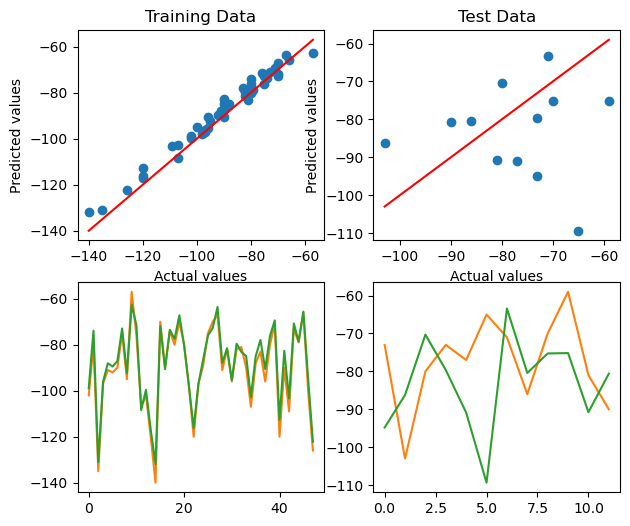

Epoch 850, Training Loss: 0.0132
Train R²:  0.98731   Train MPE:  92.08 %
Test R² :  -1.25628   Test MPE :  147.15 %


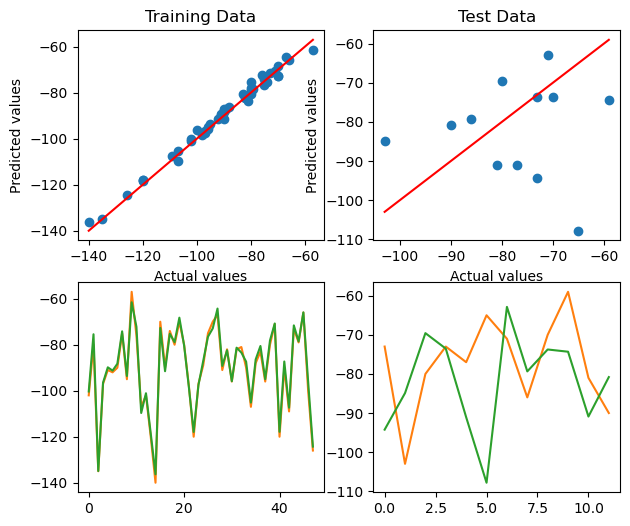

Epoch 900, Training Loss: 0.0082
Train R²:  0.99206   Train MPE:  71.24 %
Test R² :  -1.39930   Test MPE :  144.17 %


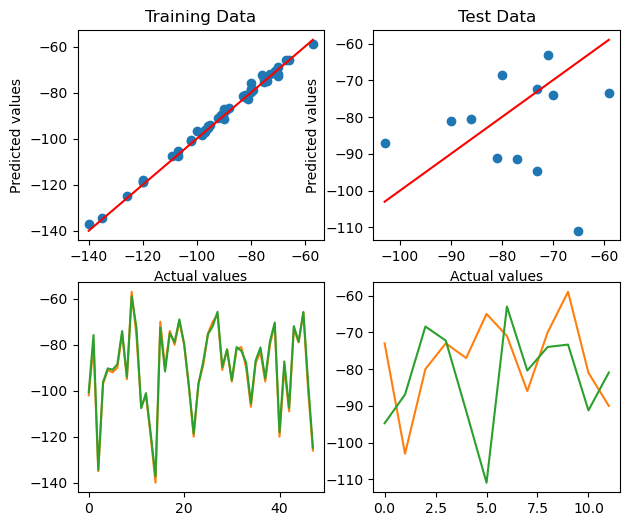

Epoch 950, Training Loss: 0.0364
Train R²:  0.96492   Train MPE:  68.31 %
Test R² :  -1.38736   Test MPE :  149.91 %


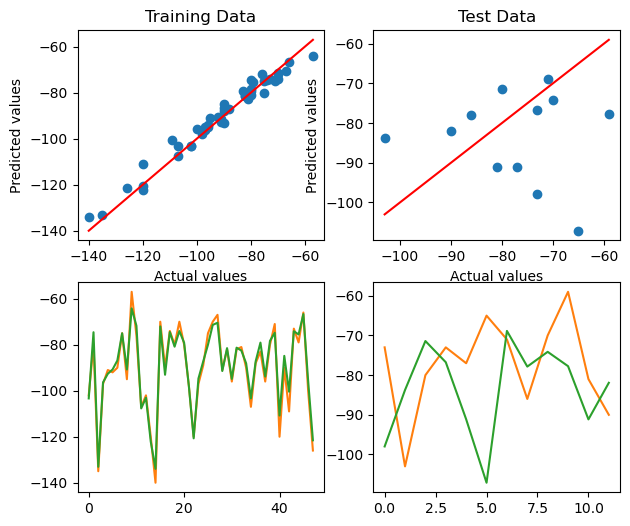

Epoch 1000, Training Loss: 0.0035
Train R²:  0.99667   Train MPE:  18.35 %
Test R² :  -1.55756   Test MPE :  144.45 %


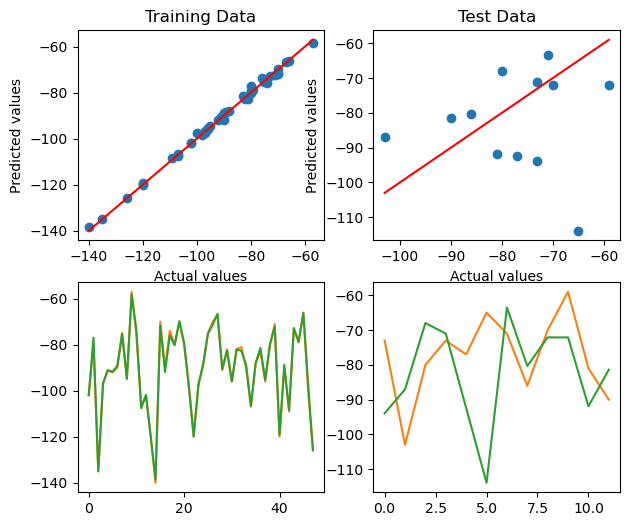

In [82]:
Pure_DNN3(6)